# Learning a Nonlinear Operator with a Feed-Forward Neural Network

In this notebook, we use a feed-forward neural network (FFNN) to learn a nonlinear operator that maps between function spaces. The operator is defined by the integral:

$$\int_{-1}^{1} \left( f(x)y + f'(x)\sin(\pi y^2)\cos(x) \right) dx$$


This notebook includes the following steps:
1. Generating training data using the defined operator.
2. Defining and training a feed-forward neural network to learn the operator.
3. Evaluating and plotting the results.

We use two helper scripts, `gll_discretize.jl` and `sample_operators.jl`, to handle data generation and preprocessing.

In [1]:
using JLD2


include("../Scripts/utils/create_model.jl")
include("../Scripts/data_generator.jl")
include("../Scripts/Discretizations/gll_discretize.jl")
include("../Scripts/sample_operators.jl")
# include("../Scripts/plot_data.jl")

include("../Scripts/LuxTraining/Enzyme_MetalTraining.jl")
# using .GllDiscretize: Discretization, generate_gll_disc

train_model_with_params_continue (generic function with 1 method)

# Training Operators:

# Linear Operators:

### 1 Layer:

In [16]:
train_state_1L, model_1L::Chain, Θ_1L::NamedTuple, st_1L::NamedTuple = train_model_with_params(leakyrelu, ℒ_lin; NN_width=64, NN_depth=1, selected_epochs=10, selected_learn_rate=0.001, selected_reg_rate=0.01, selected_batchsize=100)

Epoch: [10/10]	Batch: 100	Loss: ConcreteRNumber{Float32, 1, Reactant.Sharding.ShardInfo{Reactant.Sharding.NoSharding, Nothing}}(1.4828179f-6)
Epoch: [10/10]	Batch: 200	Loss: ConcreteRNumber{Float32, 1, Reactant.Sharding.ShardInfo{Reactant.Sharding.NoSharding, Nothing}}(2.3329223f-6)
Epoch: [10/10]	Batch: 300	Loss: ConcreteRNumber{Float32, 1, Reactant.Sharding.ShardInfo{Reactant.Sharding.NoSharding, Nothing}}(2.4046685f-6)
Epoch: [10/10]	Batch: 400	Loss: ConcreteRNumber{Float32, 1, Reactant.Sharding.ShardInfo{Reactant.Sharding.NoSharding, Nothing}}(1.4087992f-6)
Epoch: [10/10]	Batch: 500	Loss: ConcreteRNumber{Float32, 1, Reactant.Sharding.ShardInfo{Reactant.Sharding.NoSharding, Nothing}}(1.8389893f-6)
Epoch: [10/10]	Batch: 600	Loss: ConcreteRNumber{Float32, 1, Reactant.Sharding.ShardInfo{Reactant.Sharding.NoSharding, Nothing}}(9.261633f-6)
Epoch: [10/10]	Batch: 700	Loss: ConcreteRNumber{Float32, 1, Reactant.Sharding.ShardInfo{Reactant.Sharding.NoSharding, Nothing}}(1.4356537f-5)
Epoch: 

(Lux.Training.TrainState{Lux.Training.TrainingBackendCache{Lux.Training.ReactantBackend{Static.True}, Static.False, Nothing, @NamedTuple{compiled_grad_and_step_function::Reactant.Compiler.Thunk{typeof(LuxReactantExt.compute_gradients_internal_and_step!), Symbol("##compute_gradients_internal_and_step!_reactant#292"), Tuple{GenericLossFunction{typeof(Lux.LossFunctionImpl.l2_distance_loss), typeof(mean)}, Chain{@NamedTuple{layer_1::Dense{typeof(leakyrelu), Int64, Int64, Nothing, Nothing, Static.True}, layer_2::Dense{typeof(identity), Int64, Int64, Nothing, Nothing, Static.False}}, Nothing}, Tuple{ConcreteRArray{Float32, 2, 1, Reactant.Sharding.ShardInfo{Reactant.Sharding.NoSharding, Nothing}}, ConcreteRArray{Float32, 2, 1, Reactant.Sharding.ShardInfo{Reactant.Sharding.NoSharding, Nothing}}}, @NamedTuple{layer_1::@NamedTuple{weight::ConcreteRArray{Float32, 2, 1, Reactant.Sharding.ShardInfo{Reactant.Sharding.NoSharding, Nothing}}, bias::ConcreteRArray{Float32, 1, 1, Reactant.Sharding.ShardI

In [17]:
jldsave("Saved_Models/lin_op/Metal/V3S1layerFF_leakyreluActFN_1MSamples_1kBatch_100Epochs_1e-4LearnRate.jld2"; params=Θ_1L, layer_states=st_1L)

In [5]:
Θ_1L

(layer_1 = (weight = Float32[-0.016350219 -0.089836664 … -0.1721057 -0.07162372; -0.11725547 0.13883136 … -0.17540954 -0.13821386; … ; 0.12756634 0.12784827 … -0.12816064 0.058341924; 0.15642937 0.0712063 … 0.03786423 -0.06791337], bias = Float32[0.114998095, -0.027925594, 0.06440199, 0.08543013, -0.14970887, -0.14338446, -0.173009, -0.064275086, 0.029182376, 0.16865477  …  -0.10301026, 0.015626006, 0.05196818, 0.09137372, -0.056831196, 0.07692551, -0.11058134, 0.14238018, 0.014248918, 0.019432407]), layer_2 = (weight = Float32[0.1599858 -0.008991512 … -0.08607256 0.040861916; 0.023017902 -0.1905341 … -0.17487724 0.1883597; … ; -0.16882335 -0.14772445 … -0.08702785 -0.015959373; 0.21050973 -0.12541708 … -0.05942217 -0.14109007],))

In [6]:
st_1L

(layer_1 = NamedTuple(), layer_2 = NamedTuple())

In [34]:
ℒ_nonlin2 isa Function

true

In [ ]:
train_state_2L, model_2L::Chain, Θ_2L::NamedTuple, st_2L::NamedTuple = train_model_with_params(leakyrelu, ℒ_lin; NN_width=64, NN_depth=2, num_samples=5_000_000)

In [ ]:
jldsave("Saved_Models/nonlin_op/CUDA/new2layerFF_leakyreluActFN_1MSamples_1kBatch_5000Epochs_dot001LR.jld2"; params=Θ_2L, layer_states=st_2L)

### 2 Layers:

In [15]:
train_state_2L, model_2L::Chain, Θ_2L::NamedTuple, st_2L::NamedTuple = train_model_with_params(leakyrelu, ℒ_lin; NN_width=64, NN_depth=2, selected_epochs=100, selected_learn_rate=1e-3, selected_batchsize=1000)

Epoch: [10/100]	Batch: 100	Loss: ConcreteRNumber{Float32, 1, Reactant.Sharding.ShardInfo{Reactant.Sharding.NoSharding, Nothing}}(3.2954347f-6)
Epoch: [10/100]	Batch: 200	Loss: ConcreteRNumber{Float32, 1, Reactant.Sharding.ShardInfo{Reactant.Sharding.NoSharding, Nothing}}(5.3534204f-6)
Epoch: [10/100]	Batch: 300	Loss: ConcreteRNumber{Float32, 1, Reactant.Sharding.ShardInfo{Reactant.Sharding.NoSharding, Nothing}}(1.2463974f-7)
Epoch: [10/100]	Batch: 400	Loss: ConcreteRNumber{Float32, 1, Reactant.Sharding.ShardInfo{Reactant.Sharding.NoSharding, Nothing}}(2.3634706f-5)
Epoch: [10/100]	Batch: 500	Loss: ConcreteRNumber{Float32, 1, Reactant.Sharding.ShardInfo{Reactant.Sharding.NoSharding, Nothing}}(1.4851653f-7)
Epoch: [10/100]	Batch: 600	Loss: ConcreteRNumber{Float32, 1, Reactant.Sharding.ShardInfo{Reactant.Sharding.NoSharding, Nothing}}(7.409098f-6)
Epoch: [10/100]	Batch: 700	Loss: ConcreteRNumber{Float32, 1, Reactant.Sharding.ShardInfo{Reactant.Sharding.NoSharding, Nothing}}(1.3599524f-7)


(Lux.Training.TrainState{Lux.Training.TrainingBackendCache{Lux.Training.ReactantBackend{Static.True}, Static.False, Nothing, @NamedTuple{compiled_grad_and_step_function::Reactant.Compiler.Thunk{typeof(LuxReactantExt.compute_gradients_internal_and_step!), Symbol("##compute_gradients_internal_and_step!_reactant#431726"), Tuple{GenericLossFunction{typeof(Lux.LossFunctionImpl.l2_distance_loss), typeof(mean)}, Chain{@NamedTuple{layer_1::Dense{typeof(leakyrelu), Int64, Int64, Nothing, Nothing, Static.True}, layer_2::Dense{typeof(leakyrelu), Int64, Int64, Nothing, Nothing, Static.True}, layer_3::Dense{typeof(identity), Int64, Int64, Nothing, Nothing, Static.False}}, Nothing}, Tuple{ConcreteRArray{Float32, 2, 1, Reactant.Sharding.ShardInfo{Reactant.Sharding.NoSharding, Nothing}}, ConcreteRArray{Float32, 2, 1, Reactant.Sharding.ShardInfo{Reactant.Sharding.NoSharding, Nothing}}}, @NamedTuple{layer_1::@NamedTuple{weight::ConcreteRArray{Float32, 2, 1, Reactant.Sharding.ShardInfo{Reactant.Sharding.

In [18]:
jldsave("../Data/Saved_Models/lin_op/Metal/2layerFF_leakyreluActFN_1MSamples_1kBatch_100Epochs_1e-3LR.jld2"; params=Θ_2L, layer_states=st_2L)

### 3 Layers:

In [ ]:
train_state_3L, model_3L::Chain, Θ_3L::NamedTuple, st_3L::NamedTuple = train_model_with_params(leakyrelu, ℒ_lin; NN_width=64, NN_depth=3, selected_epochs=1000)

In [ ]:
jldsave("Saved_Models/lin_op/CUDA/3layerFF_leakyreluActFN_1MSamples_1kBatch_1000Epochs_dot001LR.jld2"; params=Θ_1L, layer_states=st_1L)

### 5 Layers:

In [ ]:
train_state_5L, model_5L::Chain, Θ_5L::NamedTuple, st_5L::NamedTuple = train_model_with_params(leakyrelu, ℒ_lin; NN_width=64, NN_depth=5, selected_epochs=1000)

In [ ]:
jldsave("Saved_Models/lin_op/CUDA/5layerFF_leakyreluActFN_1MSamples_1kBatch_1000Epochs_dot001LR.jld2"; params=Θ_1L, layer_states=st_1L)

### 7 Layers:

In [ ]:
train_state_7L, model_7L::Chain, Θ_7L::NamedTuple, st_7L::NamedTuple = train_model_with_params(leakyrelu, ℒ_lin; NN_width=64, NN_depth=7, selected_epochs=1000)

Epoch: [10/1000]	Batch: 100	Loss: 2.3540824e-5
Epoch: [10/1000]	Batch: 200	Loss: 7.1837753e-6
Epoch: [10/1000]	Batch: 300	Loss: 5.3738286e-6
Epoch: [10/1000]	Batch: 400	Loss: 5.5225473e-6
Epoch: [10/1000]	Batch: 500	Loss: 6.6569833e-6
Epoch: [10/1000]	Batch: 600	Loss: 2.5192194e-6
Epoch: [10/1000]	Batch: 700	Loss: 4.763408e-6
Epoch: [10/1000]	Batch: 800	Loss: 1.0476749e-5
Epoch: [10/1000]	Batch: 900	Loss: 4.39805e-6
Epoch: [10/1000]	Batch: 1000	Loss: 1.504693e-5
Epoch: [10/1000]	Average Loss: 2.4330086821919394e-5
Epoch: [20/1000]	Batch: 100	Loss: 1.6491326e-6
Epoch: [20/1000]	Batch: 200	Loss: 9.7772145e-6
Epoch: [20/1000]	Batch: 300	Loss: 1.4412728e-5
Epoch: [20/1000]	Batch: 400	Loss: 9.946092e-6
Epoch: [20/1000]	Batch: 500	Loss: 4.6340197e-6
Epoch: [20/1000]	Batch: 600	Loss: 8.086334e-6
Epoch: [20/1000]	Batch: 700	Loss: 5.0484905e-5
Epoch: [20/1000]	Batch: 800	Loss: 4.8119975e-5
Epoch: [20/1000]	Batch: 900	Loss: 2.914512e-6
Epoch: [20/1000]	Batch: 1000	Loss: 1.0662611e-5
Epoch: [20/1

(Lux.Training.TrainState{Nothing, Nothing, Chain{@NamedTuple{layer_1::Dense{typeof(leakyrelu), Int64, Int64, Nothing, Nothing, Static.True}, layer_2::Dense{typeof(leakyrelu), Int64, Int64, Nothing, Nothing, Static.True}, layer_3::Dense{typeof(leakyrelu), Int64, Int64, Nothing, Nothing, Static.True}, layer_4::Dense{typeof(leakyrelu), Int64, Int64, Nothing, Nothing, Static.True}, layer_5::Dense{typeof(leakyrelu), Int64, Int64, Nothing, Nothing, Static.True}, layer_6::Dense{typeof(leakyrelu), Int64, Int64, Nothing, Nothing, Static.True}, layer_7::Dense{typeof(leakyrelu), Int64, Int64, Nothing, Nothing, Static.True}, layer_8::Dense{typeof(identity), Int64, Int64, Nothing, Nothing, Static.False}}, Nothing}, @NamedTuple{layer_1::@NamedTuple{weight::CuArray{Float32, 2, CUDA.DeviceMemory}, bias::CuArray{Float32, 1, CUDA.DeviceMemory}}, layer_2::@NamedTuple{weight::CuArray{Float32, 2, CUDA.DeviceMemory}, bias::CuArray{Float32, 1, CUDA.DeviceMemory}}, layer_3::@NamedTuple{weight::CuArray{Float32

In [ ]:
jldsave("Saved_Models/lin_op/CUDA/7layerFF_leakyreluActFN_1MSamples_1kBatch_1000Epochs_dot001LR.jld2"; params=Θ_7L, layer_states=st_7L, selected_epochs=1000)

### 10 Layers:

In [ ]:
train_state_10L, model_10L::Chain, Θ_10L::NamedTuple, st_10L::NamedTuple = train_model_with_params(leakyrelu, ℒ_lin; NN_width=64, NN_depth=10, selected_epochs=1000)

Epoch: [10/1000]	Batch: 100	Loss: 2.1705955e-5
Epoch: [10/1000]	Batch: 200	Loss: 3.7517108e-5
Epoch: [10/1000]	Batch: 300	Loss: 6.296105e-5
Epoch: [10/1000]	Batch: 400	Loss: 2.9261604e-5
Epoch: [10/1000]	Batch: 500	Loss: 3.473781e-5
Epoch: [10/1000]	Batch: 600	Loss: 0.00012119379
Epoch: [10/1000]	Batch: 700	Loss: 3.075817e-6
Epoch: [10/1000]	Batch: 800	Loss: 7.3953255e-5
Epoch: [10/1000]	Batch: 900	Loss: 7.773471e-6
Epoch: [10/1000]	Batch: 1000	Loss: 2.3943842e-6
Epoch: [10/1000]	Average Loss: 3.9492891859708834e-5
Epoch: [20/1000]	Batch: 100	Loss: 3.3569368e-6
Epoch: [20/1000]	Batch: 200	Loss: 2.0160826e-6
Epoch: [20/1000]	Batch: 300	Loss: 4.095642e-5
Epoch: [20/1000]	Batch: 400	Loss: 6.840516e-6
Epoch: [20/1000]	Batch: 500	Loss: 6.438963e-5
Epoch: [20/1000]	Batch: 600	Loss: 2.3220184e-6
Epoch: [20/1000]	Batch: 700	Loss: 2.7025106e-5
Epoch: [20/1000]	Batch: 800	Loss: 6.7536976e-6
Epoch: [20/1000]	Batch: 900	Loss: 3.8039511e-6
Epoch: [20/1000]	Batch: 1000	Loss: 2.9632615e-6
Epoch: [20/

(Lux.Training.TrainState{Nothing, Nothing, Chain{@NamedTuple{layer_1::Dense{typeof(leakyrelu), Int64, Int64, Nothing, Nothing, Static.True}, layer_2::Dense{typeof(leakyrelu), Int64, Int64, Nothing, Nothing, Static.True}, layer_3::Dense{typeof(leakyrelu), Int64, Int64, Nothing, Nothing, Static.True}, layer_4::Dense{typeof(leakyrelu), Int64, Int64, Nothing, Nothing, Static.True}, layer_5::Dense{typeof(leakyrelu), Int64, Int64, Nothing, Nothing, Static.True}, layer_6::Dense{typeof(leakyrelu), Int64, Int64, Nothing, Nothing, Static.True}, layer_7::Dense{typeof(leakyrelu), Int64, Int64, Nothing, Nothing, Static.True}, layer_8::Dense{typeof(leakyrelu), Int64, Int64, Nothing, Nothing, Static.True}, layer_9::Dense{typeof(leakyrelu), Int64, Int64, Nothing, Nothing, Static.True}, layer_10::Dense{typeof(leakyrelu), Int64, Int64, Nothing, Nothing, Static.True}, layer_11::Dense{typeof(identity), Int64, Int64, Nothing, Nothing, Static.False}}, Nothing}, @NamedTuple{layer_1::@NamedTuple{weight::CuArr

In [ ]:
jldsave("Saved_Models/lin_op/CUDA/10layerFF_leakyreluActFN_1MSamples_1kBatch_1000Epochs_dot001LR.jld2"; params=Θ_10L, layer_states=st_10L, selected_epochs=1000)

### 12 Layers:

In [ ]:
train_state_12L, model_12L::Chain, Θ_12L::NamedTuple, st_12L::NamedTuple = train_model_with_params(leakyrelu, ℒ_lin; NN_width=64, NN_depth=12, selected_epochs=1000)

Epoch: [10/1000]	Batch: 100	Loss: 3.5940786e-5
Epoch: [10/1000]	Batch: 200	Loss: 1.603951e-5
Epoch: [10/1000]	Batch: 300	Loss: 6.3128855e-6
Epoch: [10/1000]	Batch: 400	Loss: 0.00018198023
Epoch: [10/1000]	Batch: 500	Loss: 4.014019e-6
Epoch: [10/1000]	Batch: 600	Loss: 2.7056101e-5
Epoch: [10/1000]	Batch: 700	Loss: 3.5450087e-6
Epoch: [10/1000]	Batch: 800	Loss: 1.0466739e-5
Epoch: [10/1000]	Batch: 900	Loss: 2.6611304e-5
Epoch: [10/1000]	Batch: 1000	Loss: 1.3526452e-5
Epoch: [10/1000]	Average Loss: 3.8922939406575096e-5
Epoch: [20/1000]	Batch: 100	Loss: 2.5964455e-6
Epoch: [20/1000]	Batch: 200	Loss: 6.69578e-6
Epoch: [20/1000]	Batch: 300	Loss: 3.565323e-6
Epoch: [20/1000]	Batch: 400	Loss: 4.886675e-5
Epoch: [20/1000]	Batch: 500	Loss: 1.8528373e-6
Epoch: [20/1000]	Batch: 600	Loss: 0.00012328051
Epoch: [20/1000]	Batch: 700	Loss: 5.566077e-6
Epoch: [20/1000]	Batch: 800	Loss: 4.553015e-6
Epoch: [20/1000]	Batch: 900	Loss: 7.192882e-5
Epoch: [20/1000]	Batch: 1000	Loss: 1.1328093e-5
Epoch: [20/1

(Lux.Training.TrainState{Nothing, Nothing, Chain{@NamedTuple{layer_1::Dense{typeof(leakyrelu), Int64, Int64, Nothing, Nothing, Static.True}, layer_2::Dense{typeof(leakyrelu), Int64, Int64, Nothing, Nothing, Static.True}, layer_3::Dense{typeof(leakyrelu), Int64, Int64, Nothing, Nothing, Static.True}, layer_4::Dense{typeof(leakyrelu), Int64, Int64, Nothing, Nothing, Static.True}, layer_5::Dense{typeof(leakyrelu), Int64, Int64, Nothing, Nothing, Static.True}, layer_6::Dense{typeof(leakyrelu), Int64, Int64, Nothing, Nothing, Static.True}, layer_7::Dense{typeof(leakyrelu), Int64, Int64, Nothing, Nothing, Static.True}, layer_8::Dense{typeof(leakyrelu), Int64, Int64, Nothing, Nothing, Static.True}, layer_9::Dense{typeof(leakyrelu), Int64, Int64, Nothing, Nothing, Static.True}, layer_10::Dense{typeof(leakyrelu), Int64, Int64, Nothing, Nothing, Static.True}, layer_11::Dense{typeof(leakyrelu), Int64, Int64, Nothing, Nothing, Static.True}, layer_12::Dense{typeof(leakyrelu), Int64, Int64, Nothing,

In [ ]:
jldsave("Saved_Models/lin_op/CUDA/12layerFF_leakyreluActFN_1MSamples_1kBatch_1000Epochs_dot1LR.jld2"; params=Θ_12L, layer_states=st_12L)

### 15 Layers:

In [ ]:
train_state_15L, model_15L::Chain, Θ_15L::NamedTuple, st_15L::NamedTuple = train_model_with_params(leakyrelu, ℒ_lin; NN_width=64, NN_depth=15, selected_epochs=1000)

Epoch: [10/1000]	Batch: 100	Loss: 1.2986383e-5
Epoch: [10/1000]	Batch: 200	Loss: 2.9124993e-5
Epoch: [10/1000]	Batch: 300	Loss: 2.146135e-5
Epoch: [10/1000]	Batch: 400	Loss: 3.7710934e-6
Epoch: [10/1000]	Batch: 500	Loss: 0.00021908781
Epoch: [10/1000]	Batch: 600	Loss: 5.487414e-6
Epoch: [10/1000]	Batch: 700	Loss: 0.0008418691
Epoch: [10/1000]	Batch: 800	Loss: 8.7831926e-5
Epoch: [10/1000]	Batch: 900	Loss: 5.3064186e-6
Epoch: [10/1000]	Batch: 1000	Loss: 2.8273137e-6
Epoch: [10/1000]	Average Loss: 5.699006158101838e-5
Epoch: [20/1000]	Batch: 100	Loss: 2.0320501e-6
Epoch: [20/1000]	Batch: 200	Loss: 1.3230983e-6
Epoch: [20/1000]	Batch: 300	Loss: 5.284088e-6
Epoch: [20/1000]	Batch: 400	Loss: 4.2013376e-6
Epoch: [20/1000]	Batch: 500	Loss: 3.5728133e-6
Epoch: [20/1000]	Batch: 600	Loss: 1.4202288e-5
Epoch: [20/1000]	Batch: 700	Loss: 7.383257e-5
Epoch: [20/1000]	Batch: 800	Loss: 1.4727842e-5
Epoch: [20/1000]	Batch: 900	Loss: 0.00010092984
Epoch: [20/1000]	Batch: 1000	Loss: 1.9540164e-5
Epoch: [

(Lux.Training.TrainState{Nothing, Nothing, Chain{@NamedTuple{layer_1::Dense{typeof(leakyrelu), Int64, Int64, Nothing, Nothing, Static.True}, layer_2::Dense{typeof(leakyrelu), Int64, Int64, Nothing, Nothing, Static.True}, layer_3::Dense{typeof(leakyrelu), Int64, Int64, Nothing, Nothing, Static.True}, layer_4::Dense{typeof(leakyrelu), Int64, Int64, Nothing, Nothing, Static.True}, layer_5::Dense{typeof(leakyrelu), Int64, Int64, Nothing, Nothing, Static.True}, layer_6::Dense{typeof(leakyrelu), Int64, Int64, Nothing, Nothing, Static.True}, layer_7::Dense{typeof(leakyrelu), Int64, Int64, Nothing, Nothing, Static.True}, layer_8::Dense{typeof(leakyrelu), Int64, Int64, Nothing, Nothing, Static.True}, layer_9::Dense{typeof(leakyrelu), Int64, Int64, Nothing, Nothing, Static.True}, layer_10::Dense{typeof(leakyrelu), Int64, Int64, Nothing, Nothing, Static.True}, layer_11::Dense{typeof(leakyrelu), Int64, Int64, Nothing, Nothing, Static.True}, layer_12::Dense{typeof(leakyrelu), Int64, Int64, Nothing,

In [ ]:
jldsave("Saved_Models/lin_op/CUDA/15layerFF_leakyreluActFN_1MSamples_1kBatch_1000Epochs_dot001LR.jld2"; params=Θ_15L, layer_states=st_15L)

### 18 Layers:

In [ ]:
train_state_20L, model_20L::Chain, Θ_20L::NamedTuple, st_20L::NamedTuple = train_model_with_params(leakyrelu, ℒ_lin; NN_width=64, NN_depth=18, selected_epochs=1000)

Epoch: [10/1000]	Batch: 100	Loss: 0.00013505678
Epoch: [10/1000]	Batch: 200	Loss: 9.981895e-6
Epoch: [10/1000]	Batch: 300	Loss: 6.5775043e-6
Epoch: [10/1000]	Batch: 400	Loss: 1.065612e-5
Epoch: [10/1000]	Batch: 500	Loss: 1.5311838e-5
Epoch: [10/1000]	Batch: 600	Loss: 1.5645483e-5
Epoch: [10/1000]	Batch: 700	Loss: 6.380503e-5
Epoch: [10/1000]	Batch: 800	Loss: 1.2356067e-5
Epoch: [10/1000]	Batch: 900	Loss: 5.6033077e-6
Epoch: [10/1000]	Batch: 1000	Loss: 6.8326176e-6
Epoch: [10/1000]	Average Loss: 7.262115167850425e-5
Epoch: [20/1000]	Batch: 100	Loss: 6.252532e-6
Epoch: [20/1000]	Batch: 200	Loss: 4.5846107e-5
Epoch: [20/1000]	Batch: 300	Loss: 3.1478319e-6
Epoch: [20/1000]	Batch: 400	Loss: 4.8807084e-5
Epoch: [20/1000]	Batch: 500	Loss: 1.8994411e-5
Epoch: [20/1000]	Batch: 600	Loss: 4.172255e-5
Epoch: [20/1000]	Batch: 700	Loss: 7.797413e-6
Epoch: [20/1000]	Batch: 800	Loss: 2.3846958e-5
Epoch: [20/1000]	Batch: 900	Loss: 5.7015433e-5
Epoch: [20/1000]	Batch: 1000	Loss: 4.06855e-5
Epoch: [20/10

(Lux.Training.TrainState{Nothing, Nothing, Chain{@NamedTuple{layer_1::Dense{typeof(leakyrelu), Int64, Int64, Nothing, Nothing, Static.True}, layer_2::Dense{typeof(leakyrelu), Int64, Int64, Nothing, Nothing, Static.True}, layer_3::Dense{typeof(leakyrelu), Int64, Int64, Nothing, Nothing, Static.True}, layer_4::Dense{typeof(leakyrelu), Int64, Int64, Nothing, Nothing, Static.True}, layer_5::Dense{typeof(leakyrelu), Int64, Int64, Nothing, Nothing, Static.True}, layer_6::Dense{typeof(leakyrelu), Int64, Int64, Nothing, Nothing, Static.True}, layer_7::Dense{typeof(leakyrelu), Int64, Int64, Nothing, Nothing, Static.True}, layer_8::Dense{typeof(leakyrelu), Int64, Int64, Nothing, Nothing, Static.True}, layer_9::Dense{typeof(leakyrelu), Int64, Int64, Nothing, Nothing, Static.True}, layer_10::Dense{typeof(leakyrelu), Int64, Int64, Nothing, Nothing, Static.True}, layer_11::Dense{typeof(leakyrelu), Int64, Int64, Nothing, Nothing, Static.True}, layer_12::Dense{typeof(leakyrelu), Int64, Int64, Nothing,

In [ ]:
jldsave("Saved_Models/lin_op/CUDA/18layerFF_leakyreluActFN_1MSamples_1kBatch_1000Epochs_dot001LR.jld2"; params=Θ_18L, layer_states=st_18L)

### 20 Layers (Past this point requires smaller learning rate!):

In [ ]:
train_state_20L, model_20L::Chain, Θ_20L::NamedTuple, st_20L::NamedTuple = train_model_with_params(leakyrelu, ℒ_lin; NN_width=64, NN_depth=20, selected_epochs=1000, learn_rate=0.0001)

Epoch: [10/1000]	Batch: 100	Loss: 0.00015642794
Epoch: [10/1000]	Batch: 200	Loss: 0.00021694408
Epoch: [10/1000]	Batch: 300	Loss: 9.656216e-5
Epoch: [10/1000]	Batch: 400	Loss: 0.000104607745
Epoch: [10/1000]	Batch: 500	Loss: 0.00011309056
Epoch: [10/1000]	Batch: 600	Loss: 0.00024606154
Epoch: [10/1000]	Batch: 700	Loss: 0.0002499696
Epoch: [10/1000]	Batch: 800	Loss: 8.719555e-5
Epoch: [10/1000]	Batch: 900	Loss: 9.319347e-5
Epoch: [10/1000]	Batch: 1000	Loss: 7.109699e-5
Epoch: [10/1000]	Average Loss: 0.00014558613351255188
Epoch: [20/1000]	Batch: 100	Loss: 6.300812e-5
Epoch: [20/1000]	Batch: 200	Loss: 2.441642e-5
Epoch: [20/1000]	Batch: 300	Loss: 1.0708923e-5
Epoch: [20/1000]	Batch: 400	Loss: 0.00011954795
Epoch: [20/1000]	Batch: 500	Loss: 0.0003240519
Epoch: [20/1000]	Batch: 600	Loss: 1.2962937e-5
Epoch: [20/1000]	Batch: 700	Loss: 4.176633e-5
Epoch: [20/1000]	Batch: 800	Loss: 0.00012464277
Epoch: [20/1000]	Batch: 900	Loss: 1.2896969e-5
Epoch: [20/1000]	Batch: 1000	Loss: 1.6046792e-5
Epo

(Lux.Training.TrainState{Nothing, Nothing, Chain{@NamedTuple{layer_1::Dense{typeof(leakyrelu), Int64, Int64, Nothing, Nothing, Static.True}, layer_2::Dense{typeof(leakyrelu), Int64, Int64, Nothing, Nothing, Static.True}, layer_3::Dense{typeof(leakyrelu), Int64, Int64, Nothing, Nothing, Static.True}, layer_4::Dense{typeof(leakyrelu), Int64, Int64, Nothing, Nothing, Static.True}, layer_5::Dense{typeof(leakyrelu), Int64, Int64, Nothing, Nothing, Static.True}, layer_6::Dense{typeof(leakyrelu), Int64, Int64, Nothing, Nothing, Static.True}, layer_7::Dense{typeof(leakyrelu), Int64, Int64, Nothing, Nothing, Static.True}, layer_8::Dense{typeof(leakyrelu), Int64, Int64, Nothing, Nothing, Static.True}, layer_9::Dense{typeof(leakyrelu), Int64, Int64, Nothing, Nothing, Static.True}, layer_10::Dense{typeof(leakyrelu), Int64, Int64, Nothing, Nothing, Static.True}, layer_11::Dense{typeof(leakyrelu), Int64, Int64, Nothing, Nothing, Static.True}, layer_12::Dense{typeof(leakyrelu), Int64, Int64, Nothing,

In [ ]:
jldsave("Saved_Models/lin_op/CUDA/20layerFF_leakyreluActFN_1MSamples_1kBatch_1000Epochs_dot0001LR.jld2"; params=Θ_20L, layer_states=st_20L)

### 30 Layers (Requires smaller $\eta$, as well as possible regularization!):

In [ ]:
train_state_30L, model_30L::Chain, Θ_30L::NamedTuple, st_30L::NamedTuple = train_model_with_params(leakyrelu, ℒ_lin; NN_width=64, NN_depth=30, selected_epochs=1000, selected_learn_rate=0.0001, selected_batchsize=100)

Epoch: [10/1000]	Batch: 100	Loss: 0.25520283
Epoch: [10/1000]	Batch: 200	Loss: 0.25403306
Epoch: [10/1000]	Batch: 300	Loss: 0.31303775
Epoch: [10/1000]	Batch: 400	Loss: 0.27977413
Epoch: [10/1000]	Batch: 500	Loss: 0.30982333
Epoch: [10/1000]	Batch: 600	Loss: 0.33832324
Epoch: [10/1000]	Batch: 700	Loss: 0.33893338
Epoch: [10/1000]	Batch: 800	Loss: 0.3371696
Epoch: [10/1000]	Batch: 900	Loss: 0.26700714
Epoch: [10/1000]	Batch: 1000	Loss: 0.32542473
Epoch: [10/1000]	Batch: 1100	Loss: 0.27627897
Epoch: [10/1000]	Batch: 1200	Loss: 0.25947946
Epoch: [10/1000]	Batch: 1300	Loss: 0.361364
Epoch: [10/1000]	Batch: 1400	Loss: 0.2784128
Epoch: [10/1000]	Batch: 1500	Loss: 0.2812571
Epoch: [10/1000]	Batch: 1600	Loss: 0.29497066
Epoch: [10/1000]	Batch: 1700	Loss: 0.3151591
Epoch: [10/1000]	Batch: 1800	Loss: 0.26608524
Epoch: [10/1000]	Batch: 1900	Loss: 0.24097931
Epoch: [10/1000]	Batch: 2000	Loss: 0.26049677
Epoch: [10/1000]	Batch: 2100	Loss: 0.28934118
Epoch: [10/1000]	Batch: 2200	Loss: 0.30931333
Epo

InterruptException: InterruptException:

In [ ]:
jldsave("Saved_Models/lin_op/CUDA/30layerFF_leakyreluActFN_1MSamples_1kBatch_1000Epochs_dot00001LR.jld2"; params=Θ_30L, layer_states=st_30L)

UndefVarError: UndefVarError: `Θ_30L` not defined in `Main`
Suggestion: check for spelling errors or missing imports.

### 50 Layers (Requires smaller $\eta$, as well as possible regularization!):

In [ ]:
train_state_50L, model_50L::Chain, Θ_50L::NamedTuple, st_50L::NamedTuple = train_model_with_params(leakyrelu, ℒ_lin; NN_width=64, NN_depth=50, selected_epochs=1000, learn_rate=0.00001)

InterruptException: InterruptException:

In [ ]:
jldsave("Saved_Models/lin_op/CUDA/50layerFF_leakyreluActFN_1MSamples_1kBatch_1000Epochs_dot00001LR.jld2"; params=Θ_50L, layer_states=st_50L)

UndefVarError: UndefVarError: `Θ_50L` not defined in `Main`
Suggestion: check for spelling errors or missing imports.

### 100 Layers (Requires smaller $\eta$, as well as possible regularization!):

In [ ]:
train_state_100L, model_100L::Chain, Θ_100L::NamedTuple, st_100L::NamedTuple = train_model_with_params(leakyrelu, ℒ_lin; NN_width=64, NN_depth=100, selected_epochs=1000, learn_rate=0.0001)

InterruptException: InterruptException:

In [ ]:
jldsave("Saved_Models/lin_op/CUDA/100layerFF_leakyreluActFN_1MSamples_1kBatch_1000Epochs_dot0001LR.jld2"; params=Θ_100L, layer_states=st_100L, selected_epochs=1000)

UndefVarError: UndefVarError: `Θ_100L` not defined in `Main`
Suggestion: check for spelling errors or missing imports.

# Nonlinear Operators:

## $$\int_{-1}^{1} \left( f(x)y + f(x)f'(x)\sin(\pi y^2)\cos(x) \right) dx$$

### 1 Layer:

In [38]:
train_state_1L, model_1L::Chain, Θ_1L::NamedTuple, st_1L::NamedTuple = train_model_with_params(leakyrelu, ℒ_nonlin; NN_width=64, NN_depth=1, selected_epochs=2000, selected_learn_rate=0.0001)

Epoch: [10/2000]	Batch: 100	Loss: 0.007663397
Epoch: [10/2000]	Batch: 200	Loss: 0.008044302
Epoch: [10/2000]	Batch: 300	Loss: 0.0076641436
Epoch: [10/2000]	Batch: 400	Loss: 0.009865575
Epoch: [10/2000]	Batch: 500	Loss: 0.0074850977
Epoch: [10/2000]	Batch: 600	Loss: 0.007826735
Epoch: [10/2000]	Batch: 700	Loss: 0.0074537126
Epoch: [10/2000]	Batch: 800	Loss: 0.006223581
Epoch: [10/2000]	Batch: 900	Loss: 0.007516456
Epoch: [10/2000]	Batch: 1000	Loss: 0.008519808
Epoch: [10/2000]	Average Loss: 0.0076923550022766
Epoch: [20/2000]	Batch: 100	Loss: 0.0031994896
Epoch: [20/2000]	Batch: 200	Loss: 0.0024479958
Epoch: [20/2000]	Batch: 300	Loss: 0.0025371276
Epoch: [20/2000]	Batch: 400	Loss: 0.0024618127
Epoch: [20/2000]	Batch: 500	Loss: 0.002506948
Epoch: [20/2000]	Batch: 600	Loss: 0.0029066931
Epoch: [20/2000]	Batch: 700	Loss: 0.0027508761
Epoch: [20/2000]	Batch: 800	Loss: 0.0028199197
Epoch: [20/2000]	Batch: 900	Loss: 0.0029204888
Epoch: [20/2000]	Batch: 1000	Loss: 0.0035122852
Epoch: [20/2000]

(Lux.Training.TrainState{Nothing, Nothing, Chain{@NamedTuple{layer_1::Dense{typeof(leakyrelu), Int64, Int64, Nothing, Nothing, Static.True}, layer_2::Dense{typeof(identity), Int64, Int64, Nothing, Nothing, Static.False}}, Nothing}, @NamedTuple{layer_1::@NamedTuple{weight::CuArray{Float32, 2, CUDA.DeviceMemory}, bias::CuArray{Float32, 1, CUDA.DeviceMemory}}, layer_2::@NamedTuple{weight::CuArray{Float32, 2, CUDA.DeviceMemory}}}, @NamedTuple{layer_1::@NamedTuple{}, layer_2::@NamedTuple{}}, Adam, @NamedTuple{layer_1::@NamedTuple{weight::Optimisers.Leaf{Adam, Tuple{CuArray{Float32, 2, CUDA.DeviceMemory}, CuArray{Float32, 2, CUDA.DeviceMemory}, Tuple{Float32, Float32}}}, bias::Optimisers.Leaf{Adam, Tuple{CuArray{Float32, 1, CUDA.DeviceMemory}, CuArray{Float32, 1, CUDA.DeviceMemory}, Tuple{Float32, Float32}}}}, layer_2::@NamedTuple{weight::Optimisers.Leaf{Adam, Tuple{CuArray{Float32, 2, CUDA.DeviceMemory}, CuArray{Float32, 2, CUDA.DeviceMemory}, Tuple{Float32, Float32}}}}}}(nothing, nothing, 

In [39]:
jldsave("Saved_Models/nonlin_op/CUDA/1layerFF_leakyreluActFN_1MSamples_1kBatch_2000Epochs_1e-3LearnRate.jld2"; params=Θ_1L, layer_states=st_1L)

### 2 Layers:

In [24]:
train_state_2L, model_2L::Chain, Θ_2L::NamedTuple, st_2L::NamedTuple = train_model_with_params(leakyrelu, ℒ_nonlin; NN_width=64, NN_depth=2, selected_epochs=1000, selected_learn_rate=1e-3, selected_reg_rate=1e-1, selected_batchsize=1000)

Epoch: [10/1000]	Batch: 100	Loss: ConcreteRNumber{Float32, 1, Reactant.Sharding.ShardInfo{Reactant.Sharding.NoSharding, Nothing}}(0.0006401113f0)
Epoch: [10/1000]	Batch: 200	Loss: ConcreteRNumber{Float32, 1, Reactant.Sharding.ShardInfo{Reactant.Sharding.NoSharding, Nothing}}(0.0006582488f0)
Epoch: [10/1000]	Batch: 300	Loss: ConcreteRNumber{Float32, 1, Reactant.Sharding.ShardInfo{Reactant.Sharding.NoSharding, Nothing}}(0.00059103273f0)
Epoch: [10/1000]	Batch: 400	Loss: ConcreteRNumber{Float32, 1, Reactant.Sharding.ShardInfo{Reactant.Sharding.NoSharding, Nothing}}(0.00073691277f0)
Epoch: [10/1000]	Batch: 500	Loss: ConcreteRNumber{Float32, 1, Reactant.Sharding.ShardInfo{Reactant.Sharding.NoSharding, Nothing}}(0.000655591f0)
Epoch: [10/1000]	Batch: 600	Loss: ConcreteRNumber{Float32, 1, Reactant.Sharding.ShardInfo{Reactant.Sharding.NoSharding, Nothing}}(0.0005560179f0)
Epoch: [10/1000]	Batch: 700	Loss: ConcreteRNumber{Float32, 1, Reactant.Sharding.ShardInfo{Reactant.Sharding.NoSharding, Not

(Lux.Training.TrainState{Lux.Training.TrainingBackendCache{Lux.Training.ReactantBackend{Static.True}, Static.False, Nothing, @NamedTuple{compiled_grad_and_step_function::Reactant.Compiler.Thunk{typeof(LuxReactantExt.compute_gradients_internal_and_step!), Symbol("##compute_gradients_internal_and_step!_reactant#431738"), Tuple{GenericLossFunction{typeof(Lux.LossFunctionImpl.l2_distance_loss), typeof(mean)}, Chain{@NamedTuple{layer_1::Dense{typeof(leakyrelu), Int64, Int64, Nothing, Nothing, Static.True}, layer_2::Dense{typeof(leakyrelu), Int64, Int64, Nothing, Nothing, Static.True}, layer_3::Dense{typeof(identity), Int64, Int64, Nothing, Nothing, Static.False}}, Nothing}, Tuple{ConcreteRArray{Float32, 2, 1, Reactant.Sharding.ShardInfo{Reactant.Sharding.NoSharding, Nothing}}, ConcreteRArray{Float32, 2, 1, Reactant.Sharding.ShardInfo{Reactant.Sharding.NoSharding, Nothing}}}, @NamedTuple{layer_1::@NamedTuple{weight::ConcreteRArray{Float32, 2, 1, Reactant.Sharding.ShardInfo{Reactant.Sharding.

In [26]:
jldsave("../Data/Saved_Models/nonlin_op/Metal/2layerFF_leakyreluActFN_1MSamples_1kBatch_2000Epochs_1e-3LearnRat_1e-3RegRate.jld2"; params=Θ_2L, layer_states=st_2L)

In [29]:
train_state_2L

TrainState
    model: Chain{@NamedTuple{layer_1::Dense{typeof(leakyrelu), Int64, Int64, Nothing, Nothing, Static.True}, layer_2::Dense{typeof(leakyrelu), Int64, Int64, Nothing, Nothing, Static.True}, layer_3::Dense{typeof(identity), Int64, Int64, Nothing, Nothing, Static.False}}, Nothing}((layer_1 = Dense(31 => 64, leakyrelu), layer_2 = Dense(64 => 64, leakyrelu), layer_3 = Dense(64 => 31, use_bias=false)), nothing)
    # of parameters: 8192
    # of states: 0
    optimizer: AdamW(eta=0.001, beta=(0.9, 0.999), lambda=0.1, epsilon=1.0e-8, couple=true)
    step: 1000000
    cache: TrainingBackendCache(Lux.Training.ReactantBackend{Static.True}(static(true)))
    objective_function: GenericLossFunction

### 3 Layers:

In [8]:
1e-4 == 0.0001

true

0.0001

In [11]:
train_state_3L, model_3L::Chain, Θ_3L::NamedTuple, st_3L::NamedTuple = train_model_with_params(leakyrelu, ℒ_nonlin; NN_width=64, NN_depth=3, selected_epochs=2000, selected_learn_rate=1e-2)

Epoch: [10/2000]	Batch: 100	Loss: ConcreteRNumber{Float32, 1, Reactant.Sharding.ShardInfo{Reactant.Sharding.NoSharding, Nothing}}(0.00036207415f0)
Epoch: [10/2000]	Batch: 200	Loss: ConcreteRNumber{Float32, 1, Reactant.Sharding.ShardInfo{Reactant.Sharding.NoSharding, Nothing}}(0.00049405656f0)
Epoch: [10/2000]	Batch: 300	Loss: ConcreteRNumber{Float32, 1, Reactant.Sharding.ShardInfo{Reactant.Sharding.NoSharding, Nothing}}(0.00038089152f0)
Epoch: [10/2000]	Batch: 400	Loss: ConcreteRNumber{Float32, 1, Reactant.Sharding.ShardInfo{Reactant.Sharding.NoSharding, Nothing}}(0.00058610225f0)
Epoch: [10/2000]	Batch: 500	Loss: ConcreteRNumber{Float32, 1, Reactant.Sharding.ShardInfo{Reactant.Sharding.NoSharding, Nothing}}(0.00042225645f0)
Epoch: [10/2000]	Batch: 600	Loss: ConcreteRNumber{Float32, 1, Reactant.Sharding.ShardInfo{Reactant.Sharding.NoSharding, Nothing}}(0.00043316613f0)
Epoch: [10/2000]	Batch: 700	Loss: ConcreteRNumber{Float32, 1, Reactant.Sharding.ShardInfo{Reactant.Sharding.NoSharding

(Lux.Training.TrainState{Lux.Training.TrainingBackendCache{Lux.Training.ReactantBackend{Static.True}, Static.False, Nothing, @NamedTuple{compiled_grad_and_step_function::Reactant.Compiler.Thunk{typeof(LuxReactantExt.compute_gradients_internal_and_step!), Symbol("##compute_gradients_internal_and_step!_reactant#423116"), Tuple{GenericLossFunction{typeof(Lux.LossFunctionImpl.l2_distance_loss), typeof(mean)}, Chain{@NamedTuple{layer_1::Dense{typeof(leakyrelu), Int64, Int64, Nothing, Nothing, Static.True}, layer_2::Dense{typeof(leakyrelu), Int64, Int64, Nothing, Nothing, Static.True}, layer_3::Dense{typeof(leakyrelu), Int64, Int64, Nothing, Nothing, Static.True}, layer_4::Dense{typeof(identity), Int64, Int64, Nothing, Nothing, Static.False}}, Nothing}, Tuple{ConcreteRArray{Float32, 2, 1, Reactant.Sharding.ShardInfo{Reactant.Sharding.NoSharding, Nothing}}, ConcreteRArray{Float32, 2, 1, Reactant.Sharding.ShardInfo{Reactant.Sharding.NoSharding, Nothing}}}, @NamedTuple{layer_1::@NamedTuple{weig

In [ ]:
jldsave("../Data/Saved_Models/nonlin_op/Metal/3layerFF_leakyreluActFN_1MSamples_1kBatch_2000Epochs_1e-2LearnRate.jld2"; params=Θ_3L, layer_states=st_3L)

In [14]:
jldsave("../Data/Saved_Models/nonlin_op/Metal/3layerFF_leakyreluActFN_1MSamples_1kBatch_2000Epochs_1e-2LearnRate.jld2"; params=Θ_3L, layer_states=st_3L)

### 5 Layers:

In [2]:
train_state_5L, model_5L::Chain, Θ_5L::NamedTuple, st_5L::NamedTuple = train_model_with_params(leakyrelu, ℒ_nonlin; NN_width=64, NN_depth=5, selected_epochs=300, selected_learn_rate=1e-2, selected_batchsize=2000, doWeParamSchedule=true)

Epoch: [10/300]	Batch: 100	Loss: ConcreteRNumber{Float32, 1, Reactant.Sharding.ShardInfo{Reactant.Sharding.NoSharding, Nothing}}(0.00031973148f0)
Epoch: [10/300]	Batch: 200	Loss: ConcreteRNumber{Float32, 1, Reactant.Sharding.ShardInfo{Reactant.Sharding.NoSharding, Nothing}}(0.00037552463f0)
Epoch: [10/300]	Batch: 300	Loss: ConcreteRNumber{Float32, 1, Reactant.Sharding.ShardInfo{Reactant.Sharding.NoSharding, Nothing}}(0.0007538607f0)
Epoch: [10/300]	Batch: 400	Loss: ConcreteRNumber{Float32, 1, Reactant.Sharding.ShardInfo{Reactant.Sharding.NoSharding, Nothing}}(0.0002771543f0)
Epoch: [10/300]	Batch: 500	Loss: ConcreteRNumber{Float32, 1, Reactant.Sharding.ShardInfo{Reactant.Sharding.NoSharding, Nothing}}(0.0003161748f0)
Epoch: [10/300]	Average Loss: 0.0004384850181522779
Epoch: [20/300]	Batch: 100	Loss: ConcreteRNumber{Float32, 1, Reactant.Sharding.ShardInfo{Reactant.Sharding.NoSharding, Nothing}}(0.00023221048f0)
Epoch: [20/300]	Batch: 200	Loss: ConcreteRNumber{Float32, 1, Reactant.Shard

(Lux.Training.TrainState{Lux.Training.TrainingBackendCache{Lux.Training.ReactantBackend{Static.True}, Static.False, Nothing, @NamedTuple{compiled_grad_and_step_function::Reactant.Compiler.Thunk{typeof(LuxReactantExt.compute_gradients_internal_and_step!), Symbol("##compute_gradients_internal_and_step!_reactant#421713"), Tuple{GenericLossFunction{typeof(Lux.LossFunctionImpl.l2_distance_loss), typeof(mean)}, Chain{@NamedTuple{layer_1::Dense{typeof(leakyrelu), Int64, Int64, Nothing, Nothing, Static.True}, layer_2::Dense{typeof(leakyrelu), Int64, Int64, Nothing, Nothing, Static.True}, layer_3::Dense{typeof(leakyrelu), Int64, Int64, Nothing, Nothing, Static.True}, layer_4::Dense{typeof(leakyrelu), Int64, Int64, Nothing, Nothing, Static.True}, layer_5::Dense{typeof(leakyrelu), Int64, Int64, Nothing, Nothing, Static.True}, layer_6::Dense{typeof(identity), Int64, Int64, Nothing, Nothing, Static.False}}, Nothing}, Tuple{ConcreteRArray{Float32, 2, 1, Reactant.Sharding.ShardInfo{Reactant.Sharding.

In [3]:
jldsave("../Data/Saved_Models/nonlin_op/Metal/V2_5layerFF_leakyreluActFN_1MSamples_1kBatch_2000Epochs_1e-2LearnRate.jld2"; params=Θ_5L, layer_states=st_5L)

### 7 Layers:

In [ ]:
train_state_7L, model_7L::Chain, Θ_7L::NamedTuple, st_7L::NamedTuple = train_model_with_params(leakyrelu, ℒ_lin; NN_width=64, NN_depth=7, selected_epochs=1000)

Epoch: [10/1000]	Batch: 100	Loss: 2.3540824e-5
Epoch: [10/1000]	Batch: 200	Loss: 7.1837753e-6
Epoch: [10/1000]	Batch: 300	Loss: 5.3738286e-6
Epoch: [10/1000]	Batch: 400	Loss: 5.5225473e-6
Epoch: [10/1000]	Batch: 500	Loss: 6.6569833e-6
Epoch: [10/1000]	Batch: 600	Loss: 2.5192194e-6
Epoch: [10/1000]	Batch: 700	Loss: 4.763408e-6
Epoch: [10/1000]	Batch: 800	Loss: 1.0476749e-5
Epoch: [10/1000]	Batch: 900	Loss: 4.39805e-6
Epoch: [10/1000]	Batch: 1000	Loss: 1.504693e-5
Epoch: [10/1000]	Average Loss: 2.4330086821919394e-5
Epoch: [20/1000]	Batch: 100	Loss: 1.6491326e-6
Epoch: [20/1000]	Batch: 200	Loss: 9.7772145e-6
Epoch: [20/1000]	Batch: 300	Loss: 1.4412728e-5
Epoch: [20/1000]	Batch: 400	Loss: 9.946092e-6
Epoch: [20/1000]	Batch: 500	Loss: 4.6340197e-6
Epoch: [20/1000]	Batch: 600	Loss: 8.086334e-6
Epoch: [20/1000]	Batch: 700	Loss: 5.0484905e-5
Epoch: [20/1000]	Batch: 800	Loss: 4.8119975e-5
Epoch: [20/1000]	Batch: 900	Loss: 2.914512e-6
Epoch: [20/1000]	Batch: 1000	Loss: 1.0662611e-5
Epoch: [20/1

(Lux.Training.TrainState{Nothing, Nothing, Chain{@NamedTuple{layer_1::Dense{typeof(leakyrelu), Int64, Int64, Nothing, Nothing, Static.True}, layer_2::Dense{typeof(leakyrelu), Int64, Int64, Nothing, Nothing, Static.True}, layer_3::Dense{typeof(leakyrelu), Int64, Int64, Nothing, Nothing, Static.True}, layer_4::Dense{typeof(leakyrelu), Int64, Int64, Nothing, Nothing, Static.True}, layer_5::Dense{typeof(leakyrelu), Int64, Int64, Nothing, Nothing, Static.True}, layer_6::Dense{typeof(leakyrelu), Int64, Int64, Nothing, Nothing, Static.True}, layer_7::Dense{typeof(leakyrelu), Int64, Int64, Nothing, Nothing, Static.True}, layer_8::Dense{typeof(identity), Int64, Int64, Nothing, Nothing, Static.False}}, Nothing}, @NamedTuple{layer_1::@NamedTuple{weight::CuArray{Float32, 2, CUDA.DeviceMemory}, bias::CuArray{Float32, 1, CUDA.DeviceMemory}}, layer_2::@NamedTuple{weight::CuArray{Float32, 2, CUDA.DeviceMemory}, bias::CuArray{Float32, 1, CUDA.DeviceMemory}}, layer_3::@NamedTuple{weight::CuArray{Float32

In [4]:
jldsave("Saved_Models/lin_op/CUDA/7layerFF_leakyreluActFN_1MSamples_1kBatch_1000Epochs_dot001LR.jld2"; params=Θ_7L, layer_states=st_7L, selected_epochs=1000)

### 10 Layers:

In [16]:
train_state_10L, model_10L::Chain, Θ_10L::NamedTuple, st_10L::NamedTuple = train_model_with_params(leakyrelu, ℒ_nonlin; NN_width=64, NN_depth=10, selected_epochs=2000, selected_learn_rate=1e-2)

InterruptException: InterruptException:

In [17]:
jldsave("../Data/Saved_Models/nonlin_op/Metal/10layerFF_leakyreluActFN_1MSamples_1kBatch_2000Epochs_1e-2LearnRate.jld2"; params=Θ_10L, layer_states=st_10L)

UndefVarError: UndefVarError: `Θ_10L` not defined in `Main`
Suggestion: check for spelling errors or missing imports.

In [5]:
train_state_10L, model_10L::Chain, Θ_10L::NamedTuple, st_10L::NamedTuple = train_model_with_params(leakyrelu, ℒ_lin; NN_width=64, NN_depth=10, selected_epochs=1000)

Epoch: [10/1000]	Batch: 100	Loss: 2.1705955e-5
Epoch: [10/1000]	Batch: 200	Loss: 3.7517108e-5
Epoch: [10/1000]	Batch: 300	Loss: 6.296105e-5
Epoch: [10/1000]	Batch: 400	Loss: 2.9261604e-5
Epoch: [10/1000]	Batch: 500	Loss: 3.473781e-5
Epoch: [10/1000]	Batch: 600	Loss: 0.00012119379
Epoch: [10/1000]	Batch: 700	Loss: 3.075817e-6
Epoch: [10/1000]	Batch: 800	Loss: 7.3953255e-5
Epoch: [10/1000]	Batch: 900	Loss: 7.773471e-6
Epoch: [10/1000]	Batch: 1000	Loss: 2.3943842e-6
Epoch: [10/1000]	Average Loss: 3.9492891859708834e-5
Epoch: [20/1000]	Batch: 100	Loss: 3.3569368e-6
Epoch: [20/1000]	Batch: 200	Loss: 2.0160826e-6
Epoch: [20/1000]	Batch: 300	Loss: 4.095642e-5
Epoch: [20/1000]	Batch: 400	Loss: 6.840516e-6
Epoch: [20/1000]	Batch: 500	Loss: 6.438963e-5
Epoch: [20/1000]	Batch: 600	Loss: 2.3220184e-6
Epoch: [20/1000]	Batch: 700	Loss: 2.7025106e-5
Epoch: [20/1000]	Batch: 800	Loss: 6.7536976e-6
Epoch: [20/1000]	Batch: 900	Loss: 3.8039511e-6
Epoch: [20/1000]	Batch: 1000	Loss: 2.9632615e-6
Epoch: [20/

(Lux.Training.TrainState{Nothing, Nothing, Chain{@NamedTuple{layer_1::Dense{typeof(leakyrelu), Int64, Int64, Nothing, Nothing, Static.True}, layer_2::Dense{typeof(leakyrelu), Int64, Int64, Nothing, Nothing, Static.True}, layer_3::Dense{typeof(leakyrelu), Int64, Int64, Nothing, Nothing, Static.True}, layer_4::Dense{typeof(leakyrelu), Int64, Int64, Nothing, Nothing, Static.True}, layer_5::Dense{typeof(leakyrelu), Int64, Int64, Nothing, Nothing, Static.True}, layer_6::Dense{typeof(leakyrelu), Int64, Int64, Nothing, Nothing, Static.True}, layer_7::Dense{typeof(leakyrelu), Int64, Int64, Nothing, Nothing, Static.True}, layer_8::Dense{typeof(leakyrelu), Int64, Int64, Nothing, Nothing, Static.True}, layer_9::Dense{typeof(leakyrelu), Int64, Int64, Nothing, Nothing, Static.True}, layer_10::Dense{typeof(leakyrelu), Int64, Int64, Nothing, Nothing, Static.True}, layer_11::Dense{typeof(identity), Int64, Int64, Nothing, Nothing, Static.False}}, Nothing}, @NamedTuple{layer_1::@NamedTuple{weight::CuArr

In [6]:
jldsave("Saved_Models/lin_op/CUDA/10layerFF_leakyreluActFN_1MSamples_1kBatch_1000Epochs_dot001LR.jld2"; params=Θ_10L, layer_states=st_10L, selected_epochs=1000)

### 12 Layers:

In [7]:
train_state_12L, model_12L::Chain, Θ_12L::NamedTuple, st_12L::NamedTuple = train_model_with_params(leakyrelu, ℒ_lin; NN_width=64, NN_depth=12, selected_epochs=1000)

Epoch: [10/1000]	Batch: 100	Loss: 3.5940786e-5
Epoch: [10/1000]	Batch: 200	Loss: 1.603951e-5
Epoch: [10/1000]	Batch: 300	Loss: 6.3128855e-6
Epoch: [10/1000]	Batch: 400	Loss: 0.00018198023
Epoch: [10/1000]	Batch: 500	Loss: 4.014019e-6
Epoch: [10/1000]	Batch: 600	Loss: 2.7056101e-5
Epoch: [10/1000]	Batch: 700	Loss: 3.5450087e-6
Epoch: [10/1000]	Batch: 800	Loss: 1.0466739e-5
Epoch: [10/1000]	Batch: 900	Loss: 2.6611304e-5
Epoch: [10/1000]	Batch: 1000	Loss: 1.3526452e-5
Epoch: [10/1000]	Average Loss: 3.8922939406575096e-5
Epoch: [20/1000]	Batch: 100	Loss: 2.5964455e-6
Epoch: [20/1000]	Batch: 200	Loss: 6.69578e-6
Epoch: [20/1000]	Batch: 300	Loss: 3.565323e-6
Epoch: [20/1000]	Batch: 400	Loss: 4.886675e-5
Epoch: [20/1000]	Batch: 500	Loss: 1.8528373e-6
Epoch: [20/1000]	Batch: 600	Loss: 0.00012328051
Epoch: [20/1000]	Batch: 700	Loss: 5.566077e-6
Epoch: [20/1000]	Batch: 800	Loss: 4.553015e-6
Epoch: [20/1000]	Batch: 900	Loss: 7.192882e-5
Epoch: [20/1000]	Batch: 1000	Loss: 1.1328093e-5
Epoch: [20/1

(Lux.Training.TrainState{Nothing, Nothing, Chain{@NamedTuple{layer_1::Dense{typeof(leakyrelu), Int64, Int64, Nothing, Nothing, Static.True}, layer_2::Dense{typeof(leakyrelu), Int64, Int64, Nothing, Nothing, Static.True}, layer_3::Dense{typeof(leakyrelu), Int64, Int64, Nothing, Nothing, Static.True}, layer_4::Dense{typeof(leakyrelu), Int64, Int64, Nothing, Nothing, Static.True}, layer_5::Dense{typeof(leakyrelu), Int64, Int64, Nothing, Nothing, Static.True}, layer_6::Dense{typeof(leakyrelu), Int64, Int64, Nothing, Nothing, Static.True}, layer_7::Dense{typeof(leakyrelu), Int64, Int64, Nothing, Nothing, Static.True}, layer_8::Dense{typeof(leakyrelu), Int64, Int64, Nothing, Nothing, Static.True}, layer_9::Dense{typeof(leakyrelu), Int64, Int64, Nothing, Nothing, Static.True}, layer_10::Dense{typeof(leakyrelu), Int64, Int64, Nothing, Nothing, Static.True}, layer_11::Dense{typeof(leakyrelu), Int64, Int64, Nothing, Nothing, Static.True}, layer_12::Dense{typeof(leakyrelu), Int64, Int64, Nothing,

In [8]:
jldsave("Saved_Models/lin_op/CUDA/12layerFF_leakyreluActFN_1MSamples_1kBatch_1000Epochs_dot1LR.jld2"; params=Θ_12L, layer_states=st_12L)

### 15 Layers:

In [9]:
train_state_15L, model_15L::Chain, Θ_15L::NamedTuple, st_15L::NamedTuple = train_model_with_params(leakyrelu, ℒ_lin; NN_width=64, NN_depth=15, selected_epochs=1000)

Epoch: [10/1000]	Batch: 100	Loss: 1.2986383e-5
Epoch: [10/1000]	Batch: 200	Loss: 2.9124993e-5
Epoch: [10/1000]	Batch: 300	Loss: 2.146135e-5
Epoch: [10/1000]	Batch: 400	Loss: 3.7710934e-6
Epoch: [10/1000]	Batch: 500	Loss: 0.00021908781
Epoch: [10/1000]	Batch: 600	Loss: 5.487414e-6
Epoch: [10/1000]	Batch: 700	Loss: 0.0008418691
Epoch: [10/1000]	Batch: 800	Loss: 8.7831926e-5
Epoch: [10/1000]	Batch: 900	Loss: 5.3064186e-6
Epoch: [10/1000]	Batch: 1000	Loss: 2.8273137e-6
Epoch: [10/1000]	Average Loss: 5.699006158101838e-5
Epoch: [20/1000]	Batch: 100	Loss: 2.0320501e-6
Epoch: [20/1000]	Batch: 200	Loss: 1.3230983e-6
Epoch: [20/1000]	Batch: 300	Loss: 5.284088e-6
Epoch: [20/1000]	Batch: 400	Loss: 4.2013376e-6
Epoch: [20/1000]	Batch: 500	Loss: 3.5728133e-6
Epoch: [20/1000]	Batch: 600	Loss: 1.4202288e-5
Epoch: [20/1000]	Batch: 700	Loss: 7.383257e-5
Epoch: [20/1000]	Batch: 800	Loss: 1.4727842e-5
Epoch: [20/1000]	Batch: 900	Loss: 0.00010092984
Epoch: [20/1000]	Batch: 1000	Loss: 1.9540164e-5
Epoch: [

(Lux.Training.TrainState{Nothing, Nothing, Chain{@NamedTuple{layer_1::Dense{typeof(leakyrelu), Int64, Int64, Nothing, Nothing, Static.True}, layer_2::Dense{typeof(leakyrelu), Int64, Int64, Nothing, Nothing, Static.True}, layer_3::Dense{typeof(leakyrelu), Int64, Int64, Nothing, Nothing, Static.True}, layer_4::Dense{typeof(leakyrelu), Int64, Int64, Nothing, Nothing, Static.True}, layer_5::Dense{typeof(leakyrelu), Int64, Int64, Nothing, Nothing, Static.True}, layer_6::Dense{typeof(leakyrelu), Int64, Int64, Nothing, Nothing, Static.True}, layer_7::Dense{typeof(leakyrelu), Int64, Int64, Nothing, Nothing, Static.True}, layer_8::Dense{typeof(leakyrelu), Int64, Int64, Nothing, Nothing, Static.True}, layer_9::Dense{typeof(leakyrelu), Int64, Int64, Nothing, Nothing, Static.True}, layer_10::Dense{typeof(leakyrelu), Int64, Int64, Nothing, Nothing, Static.True}, layer_11::Dense{typeof(leakyrelu), Int64, Int64, Nothing, Nothing, Static.True}, layer_12::Dense{typeof(leakyrelu), Int64, Int64, Nothing,

In [10]:
jldsave("Saved_Models/lin_op/CUDA/15layerFF_leakyreluActFN_1MSamples_1kBatch_1000Epochs_dot001LR.jld2"; params=Θ_15L, layer_states=st_15L)

### 18 Layers:

In [4]:
train_state_20L, model_20L::Chain, Θ_20L::NamedTuple, st_20L::NamedTuple = train_model_with_params(leakyrelu, ℒ_lin; NN_width=64, NN_depth=18, selected_epochs=1000)

Epoch: [10/1000]	Batch: 100	Loss: 0.00013505678
Epoch: [10/1000]	Batch: 200	Loss: 9.981895e-6
Epoch: [10/1000]	Batch: 300	Loss: 6.5775043e-6
Epoch: [10/1000]	Batch: 400	Loss: 1.065612e-5
Epoch: [10/1000]	Batch: 500	Loss: 1.5311838e-5
Epoch: [10/1000]	Batch: 600	Loss: 1.5645483e-5
Epoch: [10/1000]	Batch: 700	Loss: 6.380503e-5
Epoch: [10/1000]	Batch: 800	Loss: 1.2356067e-5
Epoch: [10/1000]	Batch: 900	Loss: 5.6033077e-6
Epoch: [10/1000]	Batch: 1000	Loss: 6.8326176e-6
Epoch: [10/1000]	Average Loss: 7.262115167850425e-5
Epoch: [20/1000]	Batch: 100	Loss: 6.252532e-6
Epoch: [20/1000]	Batch: 200	Loss: 4.5846107e-5
Epoch: [20/1000]	Batch: 300	Loss: 3.1478319e-6
Epoch: [20/1000]	Batch: 400	Loss: 4.8807084e-5
Epoch: [20/1000]	Batch: 500	Loss: 1.8994411e-5
Epoch: [20/1000]	Batch: 600	Loss: 4.172255e-5
Epoch: [20/1000]	Batch: 700	Loss: 7.797413e-6
Epoch: [20/1000]	Batch: 800	Loss: 2.3846958e-5
Epoch: [20/1000]	Batch: 900	Loss: 5.7015433e-5
Epoch: [20/1000]	Batch: 1000	Loss: 4.06855e-5
Epoch: [20/10

(Lux.Training.TrainState{Nothing, Nothing, Chain{@NamedTuple{layer_1::Dense{typeof(leakyrelu), Int64, Int64, Nothing, Nothing, Static.True}, layer_2::Dense{typeof(leakyrelu), Int64, Int64, Nothing, Nothing, Static.True}, layer_3::Dense{typeof(leakyrelu), Int64, Int64, Nothing, Nothing, Static.True}, layer_4::Dense{typeof(leakyrelu), Int64, Int64, Nothing, Nothing, Static.True}, layer_5::Dense{typeof(leakyrelu), Int64, Int64, Nothing, Nothing, Static.True}, layer_6::Dense{typeof(leakyrelu), Int64, Int64, Nothing, Nothing, Static.True}, layer_7::Dense{typeof(leakyrelu), Int64, Int64, Nothing, Nothing, Static.True}, layer_8::Dense{typeof(leakyrelu), Int64, Int64, Nothing, Nothing, Static.True}, layer_9::Dense{typeof(leakyrelu), Int64, Int64, Nothing, Nothing, Static.True}, layer_10::Dense{typeof(leakyrelu), Int64, Int64, Nothing, Nothing, Static.True}, layer_11::Dense{typeof(leakyrelu), Int64, Int64, Nothing, Nothing, Static.True}, layer_12::Dense{typeof(leakyrelu), Int64, Int64, Nothing,

In [8]:
jldsave("Saved_Models/lin_op/CUDA/18layerFF_leakyreluActFN_1MSamples_1kBatch_1000Epochs_dot001LR.jld2"; params=Θ_18L, layer_states=st_18L)

### 20 Layers (Past this point requires smaller learning rate!):

In [18]:
train_state_20L, model_20L::Chain, Θ_20L::NamedTuple, st_20L::NamedTuple = train_model_with_params(leakyrelu, ℒ_nonlin; NN_width=64, NN_depth=20, selected_epochs=2000, selected_learn_rate=1e-2)

InterruptException: InterruptException:

In [19]:
jldsave("../Data/Saved_Models/nonlin_op/Metal/20layerFF_leakyreluActFN_1MSamples_1kBatch_2000Epochs_1e-2LearnRate.jld2"; params=Θ_20L, layer_states=st_20L)

UndefVarError: UndefVarError: `Θ_20L` not defined in `Main`
Suggestion: check for spelling errors or missing imports.

In [13]:
train_state_20L, model_20L::Chain, Θ_20L::NamedTuple, st_20L::NamedTuple = train_model_with_params(leakyrelu, ℒ_lin; NN_width=64, NN_depth=20, selected_epochs=1000, learn_rate=0.0001)

Epoch: [10/1000]	Batch: 100	Loss: 0.00015642794
Epoch: [10/1000]	Batch: 200	Loss: 0.00021694408
Epoch: [10/1000]	Batch: 300	Loss: 9.656216e-5
Epoch: [10/1000]	Batch: 400	Loss: 0.000104607745
Epoch: [10/1000]	Batch: 500	Loss: 0.00011309056
Epoch: [10/1000]	Batch: 600	Loss: 0.00024606154
Epoch: [10/1000]	Batch: 700	Loss: 0.0002499696
Epoch: [10/1000]	Batch: 800	Loss: 8.719555e-5
Epoch: [10/1000]	Batch: 900	Loss: 9.319347e-5
Epoch: [10/1000]	Batch: 1000	Loss: 7.109699e-5
Epoch: [10/1000]	Average Loss: 0.00014558613351255188
Epoch: [20/1000]	Batch: 100	Loss: 6.300812e-5
Epoch: [20/1000]	Batch: 200	Loss: 2.441642e-5
Epoch: [20/1000]	Batch: 300	Loss: 1.0708923e-5
Epoch: [20/1000]	Batch: 400	Loss: 0.00011954795
Epoch: [20/1000]	Batch: 500	Loss: 0.0003240519
Epoch: [20/1000]	Batch: 600	Loss: 1.2962937e-5
Epoch: [20/1000]	Batch: 700	Loss: 4.176633e-5
Epoch: [20/1000]	Batch: 800	Loss: 0.00012464277
Epoch: [20/1000]	Batch: 900	Loss: 1.2896969e-5
Epoch: [20/1000]	Batch: 1000	Loss: 1.6046792e-5
Epo

(Lux.Training.TrainState{Nothing, Nothing, Chain{@NamedTuple{layer_1::Dense{typeof(leakyrelu), Int64, Int64, Nothing, Nothing, Static.True}, layer_2::Dense{typeof(leakyrelu), Int64, Int64, Nothing, Nothing, Static.True}, layer_3::Dense{typeof(leakyrelu), Int64, Int64, Nothing, Nothing, Static.True}, layer_4::Dense{typeof(leakyrelu), Int64, Int64, Nothing, Nothing, Static.True}, layer_5::Dense{typeof(leakyrelu), Int64, Int64, Nothing, Nothing, Static.True}, layer_6::Dense{typeof(leakyrelu), Int64, Int64, Nothing, Nothing, Static.True}, layer_7::Dense{typeof(leakyrelu), Int64, Int64, Nothing, Nothing, Static.True}, layer_8::Dense{typeof(leakyrelu), Int64, Int64, Nothing, Nothing, Static.True}, layer_9::Dense{typeof(leakyrelu), Int64, Int64, Nothing, Nothing, Static.True}, layer_10::Dense{typeof(leakyrelu), Int64, Int64, Nothing, Nothing, Static.True}, layer_11::Dense{typeof(leakyrelu), Int64, Int64, Nothing, Nothing, Static.True}, layer_12::Dense{typeof(leakyrelu), Int64, Int64, Nothing,

In [14]:
jldsave("Saved_Models/lin_op/CUDA/20layerFF_leakyreluActFN_1MSamples_1kBatch_1000Epochs_dot0001LR.jld2"; params=Θ_20L, layer_states=st_20L)

### 30 Layers (Requires smaller $\eta$, as well as possible regularization!):

In [33]:
train_state_30L, model_30L::Chain, Θ_30L::NamedTuple, st_30L::NamedTuple = train_model_with_params(leakyrelu, ℒ_lin; NN_width=64, NN_depth=30, selected_epochs=1000, selected_learn_rate=0.0001, selected_batchsize=100)

Epoch: [10/1000]	Batch: 100	Loss: 0.25520283
Epoch: [10/1000]	Batch: 200	Loss: 0.25403306
Epoch: [10/1000]	Batch: 300	Loss: 0.31303775
Epoch: [10/1000]	Batch: 400	Loss: 0.27977413
Epoch: [10/1000]	Batch: 500	Loss: 0.30982333
Epoch: [10/1000]	Batch: 600	Loss: 0.33832324
Epoch: [10/1000]	Batch: 700	Loss: 0.33893338
Epoch: [10/1000]	Batch: 800	Loss: 0.3371696
Epoch: [10/1000]	Batch: 900	Loss: 0.26700714
Epoch: [10/1000]	Batch: 1000	Loss: 0.32542473
Epoch: [10/1000]	Batch: 1100	Loss: 0.27627897
Epoch: [10/1000]	Batch: 1200	Loss: 0.25947946
Epoch: [10/1000]	Batch: 1300	Loss: 0.361364
Epoch: [10/1000]	Batch: 1400	Loss: 0.2784128
Epoch: [10/1000]	Batch: 1500	Loss: 0.2812571
Epoch: [10/1000]	Batch: 1600	Loss: 0.29497066
Epoch: [10/1000]	Batch: 1700	Loss: 0.3151591
Epoch: [10/1000]	Batch: 1800	Loss: 0.26608524
Epoch: [10/1000]	Batch: 1900	Loss: 0.24097931
Epoch: [10/1000]	Batch: 2000	Loss: 0.26049677
Epoch: [10/1000]	Batch: 2100	Loss: 0.28934118
Epoch: [10/1000]	Batch: 2200	Loss: 0.30931333
Epo

InterruptException: InterruptException:

In [26]:
jldsave("Saved_Models/lin_op/CUDA/30layerFF_leakyreluActFN_1MSamples_1kBatch_1000Epochs_dot00001LR.jld2"; params=Θ_30L, layer_states=st_30L)

UndefVarError: UndefVarError: `Θ_30L` not defined in `Main`
Suggestion: check for spelling errors or missing imports.

### 50 Layers (Requires smaller $\eta$, as well as possible regularization!):

In [23]:
train_state_50L, model_50L::Chain, Θ_50L::NamedTuple, st_50L::NamedTuple = train_model_with_params(leakyrelu, ℒ_lin; NN_width=64, NN_depth=50, selected_epochs=1000, learn_rate=0.00001)

InterruptException: InterruptException:

In [24]:
jldsave("Saved_Models/lin_op/CUDA/50layerFF_leakyreluActFN_1MSamples_1kBatch_1000Epochs_dot00001LR.jld2"; params=Θ_50L, layer_states=st_50L)

UndefVarError: UndefVarError: `Θ_50L` not defined in `Main`
Suggestion: check for spelling errors or missing imports.

### 100 Layers (Requires smaller $\eta$, as well as possible regularization!):

In [19]:
train_state_100L, model_100L::Chain, Θ_100L::NamedTuple, st_100L::NamedTuple = train_model_with_params(leakyrelu, ℒ_lin; NN_width=64, NN_depth=100, selected_epochs=1000, learn_rate=0.0001)

InterruptException: InterruptException:

In [20]:
jldsave("Saved_Models/lin_op/CUDA/100layerFF_leakyreluActFN_1MSamples_1kBatch_1000Epochs_dot0001LR.jld2"; params=Θ_100L, layer_states=st_100L, selected_epochs=1000)

UndefVarError: UndefVarError: `Θ_100L` not defined in `Main`
Suggestion: check for spelling errors or missing imports.

## $$\int_{-1}^{1} \left( cos(f(x))y + f'(x)\sin(\pi y^2)\cos(x) \right) dx$$

### 1 Layer:

In [45]:
train_state_1L, model_1L::Chain, Θ_1L::NamedTuple, st_1L::NamedTuple = train_model_with_params(leakyrelu, ℒ_nonlin2; NN_width=64, NN_depth=1, selected_epochs=2000, selected_learn_rate=0.0001)

(Lux.Training.TrainState{Nothing, Nothing, Chain{@NamedTuple{layer_1::Dense{typeof(leakyrelu), Int64, Int64, Nothing, Nothing, Static.True}, layer_2::Dense{typeof(identity), Int64, Int64, Nothing, Nothing, Static.False}}, Nothing}, @NamedTuple{layer_1::@NamedTuple{weight::CuArray{Float32, 2, CUDA.DeviceMemory}, bias::CuArray{Float32, 1, CUDA.DeviceMemory}}, layer_2::@NamedTuple{weight::CuArray{Float32, 2, CUDA.DeviceMemory}}}, @NamedTuple{layer_1::@NamedTuple{}, layer_2::@NamedTuple{}}, Adam, @NamedTuple{layer_1::@NamedTuple{weight::Optimisers.Leaf{Adam, Tuple{CuArray{Float32, 2, CUDA.DeviceMemory}, CuArray{Float32, 2, CUDA.DeviceMemory}, Tuple{Float32, Float32}}}, bias::Optimisers.Leaf{Adam, Tuple{CuArray{Float32, 1, CUDA.DeviceMemory}, CuArray{Float32, 1, CUDA.DeviceMemory}, Tuple{Float32, Float32}}}}, layer_2::@NamedTuple{weight::Optimisers.Leaf{Adam, Tuple{CuArray{Float32, 2, CUDA.DeviceMemory}, CuArray{Float32, 2, CUDA.DeviceMemory}, Tuple{Float32, Float32}}}}}}(nothing, nothing, 

In [46]:
jldsave("Saved_Models/nonlin_op2/CUDA/1layerFF_leakyreluActFN_1MSamples_1kBatch_2000Epochs_1e-3LearnRate.jld2"; params=Θ_1L, layer_states=st_1L)

### 2 Layers:

In [47]:
train_state_2L, model_2L::Chain, Θ_2L::NamedTuple, st_2L::NamedTuple = train_model_with_params(leakyrelu, ℒ_nonlin2; NN_width=64, NN_depth=2, selected_epochs=2000, selected_learn_rate=0.0001)

InterruptException: InterruptException:

In [48]:
jldsave("Saved_Models/nonlin_op2/CUDA/2layerFF_leakyreluActFN_1MSamples_1kBatch_2000Epochs_1e-3LearnRate-3LearnRate.jld2"; params=Θ_2L, layer_states=st_2L)

### 3 Layers:

In [ ]:
train_state_3L, model_3L::Chain, Θ_3L::NamedTuple, st_3L::NamedTuple = train_model_with_params(leakyrelu, ℒ_nonlin2; NN_width=64, NN_depth=3, selected_epochs=2000, selected_learn_rate=0.0001)

Epoch: [10/2000]	Batch: 100	Loss: 0.0017535993
Epoch: [10/2000]	Batch: 200	Loss: 0.0018519846
Epoch: [10/2000]	Batch: 300	Loss: 0.0016096443
Epoch: [10/2000]	Batch: 400	Loss: 0.0016053984
Epoch: [10/2000]	Batch: 500	Loss: 0.0016870341
Epoch: [10/2000]	Batch: 600	Loss: 0.0015795144
Epoch: [10/2000]	Batch: 700	Loss: 0.0015258742
Epoch: [10/2000]	Batch: 800	Loss: 0.0016657613
Epoch: [10/2000]	Batch: 900	Loss: 0.0015016221
Epoch: [10/2000]	Batch: 1000	Loss: 0.0015563467
Epoch: [10/2000]	Average Loss: 0.0016889435359044
Epoch: [20/2000]	Batch: 100	Loss: 0.00085185573
Epoch: [20/2000]	Batch: 200	Loss: 0.0008266443
Epoch: [20/2000]	Batch: 300	Loss: 0.0009436553
Epoch: [20/2000]	Batch: 400	Loss: 0.0008602804
Epoch: [20/2000]	Batch: 500	Loss: 0.0009886022
Epoch: [20/2000]	Batch: 600	Loss: 0.0009122161
Epoch: [20/2000]	Batch: 700	Loss: 0.00094913336
Epoch: [20/2000]	Batch: 800	Loss: 0.000741598
Epoch: [20/2000]	Batch: 900	Loss: 0.0008635449
Epoch: [20/2000]	Batch: 1000	Loss: 0.00092754094
Epoch:

Excessive output truncated after 524312 bytes.

Epoch: [1890/2000]	Batch: 1000	Loss: 9.887012e-5


(Lux.Training.TrainState{Nothing, Nothing, Chain{@NamedTuple{layer_1::Dense{typeof(leakyrelu), Int64, Int64, Nothing, Nothing, Static.True}, layer_2::Dense{typeof(leakyrelu), Int64, Int64, Nothing, Nothing, Static.True}, layer_3::Dense{typeof(leakyrelu), Int64, Int64, Nothing, Nothing, Static.True}, layer_4::Dense{typeof(identity), Int64, Int64, Nothing, Nothing, Static.False}}, Nothing}, @NamedTuple{layer_1::@NamedTuple{weight::CuArray{Float32, 2, CUDA.DeviceMemory}, bias::CuArray{Float32, 1, CUDA.DeviceMemory}}, layer_2::@NamedTuple{weight::CuArray{Float32, 2, CUDA.DeviceMemory}, bias::CuArray{Float32, 1, CUDA.DeviceMemory}}, layer_3::@NamedTuple{weight::CuArray{Float32, 2, CUDA.DeviceMemory}, bias::CuArray{Float32, 1, CUDA.DeviceMemory}}, layer_4::@NamedTuple{weight::CuArray{Float32, 2, CUDA.DeviceMemory}}}, @NamedTuple{layer_1::@NamedTuple{}, layer_2::@NamedTuple{}, layer_3::@NamedTuple{}, layer_4::@NamedTuple{}}, Adam, @NamedTuple{layer_1::@NamedTuple{weight::Optimisers.Leaf{Adam,

In [ ]:
jldsave("Saved_Models/nonlin_op2/CUDA/3layerFF_leakyreluActFN_1MSamples_1kBatch_2000Epochs_1e-3LearnRate.jld2"; params=Θ_3L, layer_states=st_3L)

### 5 Layers:

In [ ]:
train_state_5L, model_5L::Chain, Θ_5L::NamedTuple, st_5L::NamedTuple = train_model_with_params(leakyrelu, ℒ_lin; NN_width=64, NN_depth=5, selected_epochs=1000)

Epoch: [10/5000]	Batch: 100	Loss: 0.0005356439
Epoch: [10/5000]	Batch: 200	Loss: 0.0006656625
Epoch: [10/5000]	Batch: 300	Loss: 0.00060558465
Epoch: [10/5000]	Batch: 400	Loss: 0.0005686739
Epoch: [10/5000]	Batch: 500	Loss: 0.000549808
Epoch: [10/5000]	Batch: 600	Loss: 0.0007842267
Epoch: [10/5000]	Batch: 700	Loss: 0.00058558537
Epoch: [10/5000]	Batch: 800	Loss: 0.0006655264
Epoch: [10/5000]	Batch: 900	Loss: 0.00051174476
Epoch: [10/5000]	Batch: 1000	Loss: 0.0005973339
Epoch: [10/5000]	Average Loss: 0.000616737163887592
Epoch: [20/5000]	Batch: 100	Loss: 0.00032651404
Epoch: [20/5000]	Batch: 200	Loss: 0.0003311838
Epoch: [20/5000]	Batch: 300	Loss: 0.00035772086
Epoch: [20/5000]	Batch: 400	Loss: 0.00038565422
Epoch: [20/5000]	Batch: 500	Loss: 0.0003058628
Epoch: [20/5000]	Batch: 600	Loss: 0.00035174517
Epoch: [20/5000]	Batch: 700	Loss: 0.00042253488
Epoch: [20/5000]	Batch: 800	Loss: 0.00033454047
Epoch: [20/5000]	Batch: 900	Loss: 0.000397967
Epoch: [20/5000]	Batch: 1000	Loss: 0.0003772078

(Lux.Training.TrainState{Nothing, Nothing, Chain{@NamedTuple{layer_1::Dense{typeof(leakyrelu), Int64, Int64, Nothing, Nothing, Static.True}, layer_2::Dense{typeof(leakyrelu), Int64, Int64, Nothing, Nothing, Static.True}, layer_3::Dense{typeof(leakyrelu), Int64, Int64, Nothing, Nothing, Static.True}, layer_4::Dense{typeof(leakyrelu), Int64, Int64, Nothing, Nothing, Static.True}, layer_5::Dense{typeof(leakyrelu), Int64, Int64, Nothing, Nothing, Static.True}, layer_6::Dense{typeof(identity), Int64, Int64, Nothing, Nothing, Static.False}}, Nothing}, @NamedTuple{layer_1::@NamedTuple{weight::CuArray{Float32, 2, CUDA.DeviceMemory}, bias::CuArray{Float32, 1, CUDA.DeviceMemory}}, layer_2::@NamedTuple{weight::CuArray{Float32, 2, CUDA.DeviceMemory}, bias::CuArray{Float32, 1, CUDA.DeviceMemory}}, layer_3::@NamedTuple{weight::CuArray{Float32, 2, CUDA.DeviceMemory}, bias::CuArray{Float32, 1, CUDA.DeviceMemory}}, layer_4::@NamedTuple{weight::CuArray{Float32, 2, CUDA.DeviceMemory}, bias::CuArray{Float

In [ ]:
jldsave("Saved_Models/nonlin_op/CUDA/5layerFF_leakyreluActFN_1MSamples_1kBatch_5000Epochs_dot001LR.jld2"; params=Θ_5L, layer_states=st_5L)

### 7 Layers:

In [ ]:
train_state_7L, model_7L::Chain, Θ_7L::NamedTuple, st_7L::NamedTuple = train_model_with_params(leakyrelu, ℒ_lin; NN_width=64, NN_depth=7, selected_epochs=1000)

Epoch: [10/1000]	Batch: 100	Loss: 2.3540824e-5
Epoch: [10/1000]	Batch: 200	Loss: 7.1837753e-6
Epoch: [10/1000]	Batch: 300	Loss: 5.3738286e-6
Epoch: [10/1000]	Batch: 400	Loss: 5.5225473e-6
Epoch: [10/1000]	Batch: 500	Loss: 6.6569833e-6
Epoch: [10/1000]	Batch: 600	Loss: 2.5192194e-6
Epoch: [10/1000]	Batch: 700	Loss: 4.763408e-6
Epoch: [10/1000]	Batch: 800	Loss: 1.0476749e-5
Epoch: [10/1000]	Batch: 900	Loss: 4.39805e-6
Epoch: [10/1000]	Batch: 1000	Loss: 1.504693e-5
Epoch: [10/1000]	Average Loss: 2.4330086821919394e-5
Epoch: [20/1000]	Batch: 100	Loss: 1.6491326e-6
Epoch: [20/1000]	Batch: 200	Loss: 9.7772145e-6
Epoch: [20/1000]	Batch: 300	Loss: 1.4412728e-5
Epoch: [20/1000]	Batch: 400	Loss: 9.946092e-6
Epoch: [20/1000]	Batch: 500	Loss: 4.6340197e-6
Epoch: [20/1000]	Batch: 600	Loss: 8.086334e-6
Epoch: [20/1000]	Batch: 700	Loss: 5.0484905e-5
Epoch: [20/1000]	Batch: 800	Loss: 4.8119975e-5
Epoch: [20/1000]	Batch: 900	Loss: 2.914512e-6
Epoch: [20/1000]	Batch: 1000	Loss: 1.0662611e-5
Epoch: [20/1

(Lux.Training.TrainState{Nothing, Nothing, Chain{@NamedTuple{layer_1::Dense{typeof(leakyrelu), Int64, Int64, Nothing, Nothing, Static.True}, layer_2::Dense{typeof(leakyrelu), Int64, Int64, Nothing, Nothing, Static.True}, layer_3::Dense{typeof(leakyrelu), Int64, Int64, Nothing, Nothing, Static.True}, layer_4::Dense{typeof(leakyrelu), Int64, Int64, Nothing, Nothing, Static.True}, layer_5::Dense{typeof(leakyrelu), Int64, Int64, Nothing, Nothing, Static.True}, layer_6::Dense{typeof(leakyrelu), Int64, Int64, Nothing, Nothing, Static.True}, layer_7::Dense{typeof(leakyrelu), Int64, Int64, Nothing, Nothing, Static.True}, layer_8::Dense{typeof(identity), Int64, Int64, Nothing, Nothing, Static.False}}, Nothing}, @NamedTuple{layer_1::@NamedTuple{weight::CuArray{Float32, 2, CUDA.DeviceMemory}, bias::CuArray{Float32, 1, CUDA.DeviceMemory}}, layer_2::@NamedTuple{weight::CuArray{Float32, 2, CUDA.DeviceMemory}, bias::CuArray{Float32, 1, CUDA.DeviceMemory}}, layer_3::@NamedTuple{weight::CuArray{Float32

In [ ]:
jldsave("Saved_Models/lin_op/CUDA/7layerFF_leakyreluActFN_1MSamples_1kBatch_1000Epochs_dot001LR.jld2"; params=Θ_7L, layer_states=st_7L, selected_epochs=1000)

### 10 Layers:

In [ ]:
train_state_10L, model_10L::Chain, Θ_10L::NamedTuple, st_10L::NamedTuple = train_model_with_params(leakyrelu, ℒ_lin; NN_width=64, NN_depth=10, selected_epochs=1000)

Epoch: [10/1000]	Batch: 100	Loss: 2.1705955e-5
Epoch: [10/1000]	Batch: 200	Loss: 3.7517108e-5
Epoch: [10/1000]	Batch: 300	Loss: 6.296105e-5
Epoch: [10/1000]	Batch: 400	Loss: 2.9261604e-5
Epoch: [10/1000]	Batch: 500	Loss: 3.473781e-5
Epoch: [10/1000]	Batch: 600	Loss: 0.00012119379
Epoch: [10/1000]	Batch: 700	Loss: 3.075817e-6
Epoch: [10/1000]	Batch: 800	Loss: 7.3953255e-5
Epoch: [10/1000]	Batch: 900	Loss: 7.773471e-6
Epoch: [10/1000]	Batch: 1000	Loss: 2.3943842e-6
Epoch: [10/1000]	Average Loss: 3.9492891859708834e-5
Epoch: [20/1000]	Batch: 100	Loss: 3.3569368e-6
Epoch: [20/1000]	Batch: 200	Loss: 2.0160826e-6
Epoch: [20/1000]	Batch: 300	Loss: 4.095642e-5
Epoch: [20/1000]	Batch: 400	Loss: 6.840516e-6
Epoch: [20/1000]	Batch: 500	Loss: 6.438963e-5
Epoch: [20/1000]	Batch: 600	Loss: 2.3220184e-6
Epoch: [20/1000]	Batch: 700	Loss: 2.7025106e-5
Epoch: [20/1000]	Batch: 800	Loss: 6.7536976e-6
Epoch: [20/1000]	Batch: 900	Loss: 3.8039511e-6
Epoch: [20/1000]	Batch: 1000	Loss: 2.9632615e-6
Epoch: [20/

(Lux.Training.TrainState{Nothing, Nothing, Chain{@NamedTuple{layer_1::Dense{typeof(leakyrelu), Int64, Int64, Nothing, Nothing, Static.True}, layer_2::Dense{typeof(leakyrelu), Int64, Int64, Nothing, Nothing, Static.True}, layer_3::Dense{typeof(leakyrelu), Int64, Int64, Nothing, Nothing, Static.True}, layer_4::Dense{typeof(leakyrelu), Int64, Int64, Nothing, Nothing, Static.True}, layer_5::Dense{typeof(leakyrelu), Int64, Int64, Nothing, Nothing, Static.True}, layer_6::Dense{typeof(leakyrelu), Int64, Int64, Nothing, Nothing, Static.True}, layer_7::Dense{typeof(leakyrelu), Int64, Int64, Nothing, Nothing, Static.True}, layer_8::Dense{typeof(leakyrelu), Int64, Int64, Nothing, Nothing, Static.True}, layer_9::Dense{typeof(leakyrelu), Int64, Int64, Nothing, Nothing, Static.True}, layer_10::Dense{typeof(leakyrelu), Int64, Int64, Nothing, Nothing, Static.True}, layer_11::Dense{typeof(identity), Int64, Int64, Nothing, Nothing, Static.False}}, Nothing}, @NamedTuple{layer_1::@NamedTuple{weight::CuArr

In [ ]:
jldsave("Saved_Models/lin_op/CUDA/10layerFF_leakyreluActFN_1MSamples_1kBatch_1000Epochs_dot001LR.jld2"; params=Θ_10L, layer_states=st_10L, selected_epochs=1000)

### 12 Layers:

In [ ]:
train_state_12L, model_12L::Chain, Θ_12L::NamedTuple, st_12L::NamedTuple = train_model_with_params(leakyrelu, ℒ_lin; NN_width=64, NN_depth=12, selected_epochs=1000)

Epoch: [10/1000]	Batch: 100	Loss: 3.5940786e-5
Epoch: [10/1000]	Batch: 200	Loss: 1.603951e-5
Epoch: [10/1000]	Batch: 300	Loss: 6.3128855e-6
Epoch: [10/1000]	Batch: 400	Loss: 0.00018198023
Epoch: [10/1000]	Batch: 500	Loss: 4.014019e-6
Epoch: [10/1000]	Batch: 600	Loss: 2.7056101e-5
Epoch: [10/1000]	Batch: 700	Loss: 3.5450087e-6
Epoch: [10/1000]	Batch: 800	Loss: 1.0466739e-5
Epoch: [10/1000]	Batch: 900	Loss: 2.6611304e-5
Epoch: [10/1000]	Batch: 1000	Loss: 1.3526452e-5
Epoch: [10/1000]	Average Loss: 3.8922939406575096e-5
Epoch: [20/1000]	Batch: 100	Loss: 2.5964455e-6
Epoch: [20/1000]	Batch: 200	Loss: 6.69578e-6
Epoch: [20/1000]	Batch: 300	Loss: 3.565323e-6
Epoch: [20/1000]	Batch: 400	Loss: 4.886675e-5
Epoch: [20/1000]	Batch: 500	Loss: 1.8528373e-6
Epoch: [20/1000]	Batch: 600	Loss: 0.00012328051
Epoch: [20/1000]	Batch: 700	Loss: 5.566077e-6
Epoch: [20/1000]	Batch: 800	Loss: 4.553015e-6
Epoch: [20/1000]	Batch: 900	Loss: 7.192882e-5
Epoch: [20/1000]	Batch: 1000	Loss: 1.1328093e-5
Epoch: [20/1

(Lux.Training.TrainState{Nothing, Nothing, Chain{@NamedTuple{layer_1::Dense{typeof(leakyrelu), Int64, Int64, Nothing, Nothing, Static.True}, layer_2::Dense{typeof(leakyrelu), Int64, Int64, Nothing, Nothing, Static.True}, layer_3::Dense{typeof(leakyrelu), Int64, Int64, Nothing, Nothing, Static.True}, layer_4::Dense{typeof(leakyrelu), Int64, Int64, Nothing, Nothing, Static.True}, layer_5::Dense{typeof(leakyrelu), Int64, Int64, Nothing, Nothing, Static.True}, layer_6::Dense{typeof(leakyrelu), Int64, Int64, Nothing, Nothing, Static.True}, layer_7::Dense{typeof(leakyrelu), Int64, Int64, Nothing, Nothing, Static.True}, layer_8::Dense{typeof(leakyrelu), Int64, Int64, Nothing, Nothing, Static.True}, layer_9::Dense{typeof(leakyrelu), Int64, Int64, Nothing, Nothing, Static.True}, layer_10::Dense{typeof(leakyrelu), Int64, Int64, Nothing, Nothing, Static.True}, layer_11::Dense{typeof(leakyrelu), Int64, Int64, Nothing, Nothing, Static.True}, layer_12::Dense{typeof(leakyrelu), Int64, Int64, Nothing,

In [ ]:
jldsave("Saved_Models/lin_op/CUDA/12layerFF_leakyreluActFN_1MSamples_1kBatch_1000Epochs_dot1LR.jld2"; params=Θ_12L, layer_states=st_12L)

### 15 Layers:

In [ ]:
train_state_15L, model_15L::Chain, Θ_15L::NamedTuple, st_15L::NamedTuple = train_model_with_params(leakyrelu, ℒ_lin; NN_width=64, NN_depth=15, selected_epochs=1000)

Epoch: [10/1000]	Batch: 100	Loss: 1.2986383e-5
Epoch: [10/1000]	Batch: 200	Loss: 2.9124993e-5
Epoch: [10/1000]	Batch: 300	Loss: 2.146135e-5
Epoch: [10/1000]	Batch: 400	Loss: 3.7710934e-6
Epoch: [10/1000]	Batch: 500	Loss: 0.00021908781
Epoch: [10/1000]	Batch: 600	Loss: 5.487414e-6
Epoch: [10/1000]	Batch: 700	Loss: 0.0008418691
Epoch: [10/1000]	Batch: 800	Loss: 8.7831926e-5
Epoch: [10/1000]	Batch: 900	Loss: 5.3064186e-6
Epoch: [10/1000]	Batch: 1000	Loss: 2.8273137e-6
Epoch: [10/1000]	Average Loss: 5.699006158101838e-5
Epoch: [20/1000]	Batch: 100	Loss: 2.0320501e-6
Epoch: [20/1000]	Batch: 200	Loss: 1.3230983e-6
Epoch: [20/1000]	Batch: 300	Loss: 5.284088e-6
Epoch: [20/1000]	Batch: 400	Loss: 4.2013376e-6
Epoch: [20/1000]	Batch: 500	Loss: 3.5728133e-6
Epoch: [20/1000]	Batch: 600	Loss: 1.4202288e-5
Epoch: [20/1000]	Batch: 700	Loss: 7.383257e-5
Epoch: [20/1000]	Batch: 800	Loss: 1.4727842e-5
Epoch: [20/1000]	Batch: 900	Loss: 0.00010092984
Epoch: [20/1000]	Batch: 1000	Loss: 1.9540164e-5
Epoch: [

(Lux.Training.TrainState{Nothing, Nothing, Chain{@NamedTuple{layer_1::Dense{typeof(leakyrelu), Int64, Int64, Nothing, Nothing, Static.True}, layer_2::Dense{typeof(leakyrelu), Int64, Int64, Nothing, Nothing, Static.True}, layer_3::Dense{typeof(leakyrelu), Int64, Int64, Nothing, Nothing, Static.True}, layer_4::Dense{typeof(leakyrelu), Int64, Int64, Nothing, Nothing, Static.True}, layer_5::Dense{typeof(leakyrelu), Int64, Int64, Nothing, Nothing, Static.True}, layer_6::Dense{typeof(leakyrelu), Int64, Int64, Nothing, Nothing, Static.True}, layer_7::Dense{typeof(leakyrelu), Int64, Int64, Nothing, Nothing, Static.True}, layer_8::Dense{typeof(leakyrelu), Int64, Int64, Nothing, Nothing, Static.True}, layer_9::Dense{typeof(leakyrelu), Int64, Int64, Nothing, Nothing, Static.True}, layer_10::Dense{typeof(leakyrelu), Int64, Int64, Nothing, Nothing, Static.True}, layer_11::Dense{typeof(leakyrelu), Int64, Int64, Nothing, Nothing, Static.True}, layer_12::Dense{typeof(leakyrelu), Int64, Int64, Nothing,

In [ ]:
jldsave("Saved_Models/lin_op/CUDA/15layerFF_leakyreluActFN_1MSamples_1kBatch_1000Epochs_dot001LR.jld2"; params=Θ_15L, layer_states=st_15L)

### 18 Layers:

In [ ]:
train_state_20L, model_20L::Chain, Θ_20L::NamedTuple, st_20L::NamedTuple = train_model_with_params(leakyrelu, ℒ_lin; NN_width=64, NN_depth=18, selected_epochs=1000)

Epoch: [10/1000]	Batch: 100	Loss: 0.00013505678
Epoch: [10/1000]	Batch: 200	Loss: 9.981895e-6
Epoch: [10/1000]	Batch: 300	Loss: 6.5775043e-6
Epoch: [10/1000]	Batch: 400	Loss: 1.065612e-5
Epoch: [10/1000]	Batch: 500	Loss: 1.5311838e-5
Epoch: [10/1000]	Batch: 600	Loss: 1.5645483e-5
Epoch: [10/1000]	Batch: 700	Loss: 6.380503e-5
Epoch: [10/1000]	Batch: 800	Loss: 1.2356067e-5
Epoch: [10/1000]	Batch: 900	Loss: 5.6033077e-6
Epoch: [10/1000]	Batch: 1000	Loss: 6.8326176e-6
Epoch: [10/1000]	Average Loss: 7.262115167850425e-5
Epoch: [20/1000]	Batch: 100	Loss: 6.252532e-6
Epoch: [20/1000]	Batch: 200	Loss: 4.5846107e-5
Epoch: [20/1000]	Batch: 300	Loss: 3.1478319e-6
Epoch: [20/1000]	Batch: 400	Loss: 4.8807084e-5
Epoch: [20/1000]	Batch: 500	Loss: 1.8994411e-5
Epoch: [20/1000]	Batch: 600	Loss: 4.172255e-5
Epoch: [20/1000]	Batch: 700	Loss: 7.797413e-6
Epoch: [20/1000]	Batch: 800	Loss: 2.3846958e-5
Epoch: [20/1000]	Batch: 900	Loss: 5.7015433e-5
Epoch: [20/1000]	Batch: 1000	Loss: 4.06855e-5
Epoch: [20/10

(Lux.Training.TrainState{Nothing, Nothing, Chain{@NamedTuple{layer_1::Dense{typeof(leakyrelu), Int64, Int64, Nothing, Nothing, Static.True}, layer_2::Dense{typeof(leakyrelu), Int64, Int64, Nothing, Nothing, Static.True}, layer_3::Dense{typeof(leakyrelu), Int64, Int64, Nothing, Nothing, Static.True}, layer_4::Dense{typeof(leakyrelu), Int64, Int64, Nothing, Nothing, Static.True}, layer_5::Dense{typeof(leakyrelu), Int64, Int64, Nothing, Nothing, Static.True}, layer_6::Dense{typeof(leakyrelu), Int64, Int64, Nothing, Nothing, Static.True}, layer_7::Dense{typeof(leakyrelu), Int64, Int64, Nothing, Nothing, Static.True}, layer_8::Dense{typeof(leakyrelu), Int64, Int64, Nothing, Nothing, Static.True}, layer_9::Dense{typeof(leakyrelu), Int64, Int64, Nothing, Nothing, Static.True}, layer_10::Dense{typeof(leakyrelu), Int64, Int64, Nothing, Nothing, Static.True}, layer_11::Dense{typeof(leakyrelu), Int64, Int64, Nothing, Nothing, Static.True}, layer_12::Dense{typeof(leakyrelu), Int64, Int64, Nothing,

In [ ]:
jldsave("Saved_Models/lin_op/CUDA/18layerFF_leakyreluActFN_1MSamples_1kBatch_1000Epochs_dot001LR.jld2"; params=Θ_18L, layer_states=st_18L)

### 20 Layers (Past this point requires smaller learning rate!):

In [ ]:
train_state_20L, model_20L::Chain, Θ_20L::NamedTuple, st_20L::NamedTuple = train_model_with_params(leakyrelu, ℒ_lin; NN_width=64, NN_depth=20, selected_epochs=1000, learn_rate=0.0001)

Epoch: [10/1000]	Batch: 100	Loss: 0.00015642794
Epoch: [10/1000]	Batch: 200	Loss: 0.00021694408
Epoch: [10/1000]	Batch: 300	Loss: 9.656216e-5
Epoch: [10/1000]	Batch: 400	Loss: 0.000104607745
Epoch: [10/1000]	Batch: 500	Loss: 0.00011309056
Epoch: [10/1000]	Batch: 600	Loss: 0.00024606154
Epoch: [10/1000]	Batch: 700	Loss: 0.0002499696
Epoch: [10/1000]	Batch: 800	Loss: 8.719555e-5
Epoch: [10/1000]	Batch: 900	Loss: 9.319347e-5
Epoch: [10/1000]	Batch: 1000	Loss: 7.109699e-5
Epoch: [10/1000]	Average Loss: 0.00014558613351255188
Epoch: [20/1000]	Batch: 100	Loss: 6.300812e-5
Epoch: [20/1000]	Batch: 200	Loss: 2.441642e-5
Epoch: [20/1000]	Batch: 300	Loss: 1.0708923e-5
Epoch: [20/1000]	Batch: 400	Loss: 0.00011954795
Epoch: [20/1000]	Batch: 500	Loss: 0.0003240519
Epoch: [20/1000]	Batch: 600	Loss: 1.2962937e-5
Epoch: [20/1000]	Batch: 700	Loss: 4.176633e-5
Epoch: [20/1000]	Batch: 800	Loss: 0.00012464277
Epoch: [20/1000]	Batch: 900	Loss: 1.2896969e-5
Epoch: [20/1000]	Batch: 1000	Loss: 1.6046792e-5
Epo

(Lux.Training.TrainState{Nothing, Nothing, Chain{@NamedTuple{layer_1::Dense{typeof(leakyrelu), Int64, Int64, Nothing, Nothing, Static.True}, layer_2::Dense{typeof(leakyrelu), Int64, Int64, Nothing, Nothing, Static.True}, layer_3::Dense{typeof(leakyrelu), Int64, Int64, Nothing, Nothing, Static.True}, layer_4::Dense{typeof(leakyrelu), Int64, Int64, Nothing, Nothing, Static.True}, layer_5::Dense{typeof(leakyrelu), Int64, Int64, Nothing, Nothing, Static.True}, layer_6::Dense{typeof(leakyrelu), Int64, Int64, Nothing, Nothing, Static.True}, layer_7::Dense{typeof(leakyrelu), Int64, Int64, Nothing, Nothing, Static.True}, layer_8::Dense{typeof(leakyrelu), Int64, Int64, Nothing, Nothing, Static.True}, layer_9::Dense{typeof(leakyrelu), Int64, Int64, Nothing, Nothing, Static.True}, layer_10::Dense{typeof(leakyrelu), Int64, Int64, Nothing, Nothing, Static.True}, layer_11::Dense{typeof(leakyrelu), Int64, Int64, Nothing, Nothing, Static.True}, layer_12::Dense{typeof(leakyrelu), Int64, Int64, Nothing,

In [ ]:
jldsave("Saved_Models/lin_op/CUDA/20layerFF_leakyreluActFN_1MSamples_1kBatch_1000Epochs_dot0001LR.jld2"; params=Θ_20L, layer_states=st_20L)

### 30 Layers (Requires smaller $\eta$, as well as possible regularization!):

In [ ]:
train_state_30L, model_30L::Chain, Θ_30L::NamedTuple, st_30L::NamedTuple = train_model_with_params(leakyrelu, ℒ_lin; NN_width=64, NN_depth=30, selected_epochs=1000, selected_learn_rate=0.0001, selected_batchsize=100)

Epoch: [10/1000]	Batch: 100	Loss: 0.25520283
Epoch: [10/1000]	Batch: 200	Loss: 0.25403306
Epoch: [10/1000]	Batch: 300	Loss: 0.31303775
Epoch: [10/1000]	Batch: 400	Loss: 0.27977413
Epoch: [10/1000]	Batch: 500	Loss: 0.30982333
Epoch: [10/1000]	Batch: 600	Loss: 0.33832324
Epoch: [10/1000]	Batch: 700	Loss: 0.33893338
Epoch: [10/1000]	Batch: 800	Loss: 0.3371696
Epoch: [10/1000]	Batch: 900	Loss: 0.26700714
Epoch: [10/1000]	Batch: 1000	Loss: 0.32542473
Epoch: [10/1000]	Batch: 1100	Loss: 0.27627897
Epoch: [10/1000]	Batch: 1200	Loss: 0.25947946
Epoch: [10/1000]	Batch: 1300	Loss: 0.361364
Epoch: [10/1000]	Batch: 1400	Loss: 0.2784128
Epoch: [10/1000]	Batch: 1500	Loss: 0.2812571
Epoch: [10/1000]	Batch: 1600	Loss: 0.29497066
Epoch: [10/1000]	Batch: 1700	Loss: 0.3151591
Epoch: [10/1000]	Batch: 1800	Loss: 0.26608524
Epoch: [10/1000]	Batch: 1900	Loss: 0.24097931
Epoch: [10/1000]	Batch: 2000	Loss: 0.26049677
Epoch: [10/1000]	Batch: 2100	Loss: 0.28934118
Epoch: [10/1000]	Batch: 2200	Loss: 0.30931333
Epo

InterruptException: InterruptException:

In [ ]:
jldsave("Saved_Models/lin_op/CUDA/30layerFF_leakyreluActFN_1MSamples_1kBatch_1000Epochs_dot00001LR.jld2"; params=Θ_30L, layer_states=st_30L)

UndefVarError: UndefVarError: `Θ_30L` not defined in `Main`
Suggestion: check for spelling errors or missing imports.

### 50 Layers (Requires smaller $\eta$, as well as possible regularization!):

In [ ]:
train_state_50L, model_50L::Chain, Θ_50L::NamedTuple, st_50L::NamedTuple = train_model_with_params(leakyrelu, ℒ_lin; NN_width=64, NN_depth=50, selected_epochs=1000, learn_rate=0.00001)

InterruptException: InterruptException:

In [ ]:
jldsave("Saved_Models/lin_op/CUDA/50layerFF_leakyreluActFN_1MSamples_1kBatch_1000Epochs_dot00001LR.jld2"; params=Θ_50L, layer_states=st_50L)

UndefVarError: UndefVarError: `Θ_50L` not defined in `Main`
Suggestion: check for spelling errors or missing imports.

### 100 Layers (Requires smaller $\eta$, as well as possible regularization!):

In [7]:
include("../Scripts/sample_operators.jl")

ℒ_nonlin5 (generic function with 1 method)

## $$f(x) + \int_{-1}^{1} \left( exp(f(x))y + f'(x)\sin(\pi y^2)\cos(x) \right) dx$$

### 1 Layer:

In [8]:
train_state_1L, model_1L::Chain, Θ_1L::NamedTuple, st_1L::NamedTuple = train_model_with_params(leakyrelu, ℒ_nonlin3; NN_width=64, NN_depth=1, selected_epochs=1000, selected_learn_rate=1.0e-6, selected_reg_rate=1.0e-1, selected_batchsize=1000)

Epoch: [10/1000]	Batch: 100	Loss: ConcreteRNumber{Float32, 1, Reactant.Sharding.ShardInfo{Reactant.Sharding.NoSharding, Nothing}}(6.8789005f0)
Epoch: [10/1000]	Batch: 200	Loss: ConcreteRNumber{Float32, 1, Reactant.Sharding.ShardInfo{Reactant.Sharding.NoSharding, Nothing}}(6.959732f0)
Epoch: [10/1000]	Batch: 300	Loss: ConcreteRNumber{Float32, 1, Reactant.Sharding.ShardInfo{Reactant.Sharding.NoSharding, Nothing}}(6.9041786f0)
Epoch: [10/1000]	Batch: 400	Loss: ConcreteRNumber{Float32, 1, Reactant.Sharding.ShardInfo{Reactant.Sharding.NoSharding, Nothing}}(7.0533476f0)
Epoch: [10/1000]	Batch: 500	Loss: ConcreteRNumber{Float32, 1, Reactant.Sharding.ShardInfo{Reactant.Sharding.NoSharding, Nothing}}(6.809981f0)
Epoch: [10/1000]	Batch: 600	Loss: ConcreteRNumber{Float32, 1, Reactant.Sharding.ShardInfo{Reactant.Sharding.NoSharding, Nothing}}(6.725055f0)
Epoch: [10/1000]	Batch: 700	Loss: ConcreteRNumber{Float32, 1, Reactant.Sharding.ShardInfo{Reactant.Sharding.NoSharding, Nothing}}(6.8008065f0)
Ep

InterruptException: InterruptException:

In [ ]:
jldsave("Saved_Models/lin_op/CUDA/1layerFF_leakyreluActFN_1MSamples_1kBatch_5000Epochs_dot001LR.jld2"; params=Θ_1L, layer_states=st_1L)

In [ ]:
ℒ_nonlin2 isa Function

In [ ]:
train_state_2L, model_2L::Chain, Θ_2L::NamedTuple, st_2L::NamedTuple = train_model_with_params(leakyrelu, ℒ_lin; NN_width=64, NN_depth=2, num_samples=5_000_000)

In [ ]:
jldsave("Saved_Models/nonlin_op/CUDA/new2layerFF_leakyreluActFN_1MSamples_1kBatch_5000Epochs_dot001LR.jld2"; params=Θ_2L, layer_states=st_2L)

### 2 Layers:

In [ ]:
train_state_2L, model_2L::Chain, Θ_2L::NamedTuple, st_2L::NamedTuple = train_model_with_params(leakyrelu, ℒ_lin; NN_width=64, NN_depth=2, selected_epochs=1000)

In [ ]:
jldsave("Saved_Models/nonlin_op/CUDA/new2layerFF_leakyreluActFN_1MSamples_1kBatch_5000Epochs_dot001LR.jld2"; params=Θ_2L, layer_states=st_2L)

### 3 Layers:

In [ ]:
train_state_3L, model_3L::Chain, Θ_3L::NamedTuple, st_3L::NamedTuple = train_model_with_params(leakyrelu, ℒ_nonlin; NN_width=64, NN_depth=3, selected_epochs=1000)

Epoch: [10/5000]	Batch: 100	Loss: 0.00051605003
Epoch: [10/5000]	Batch: 200	Loss: 0.0005547035
Epoch: [10/5000]	Batch: 300	Loss: 0.0006065963
Epoch: [10/5000]	Batch: 400	Loss: 0.0005343037
Epoch: [10/5000]	Batch: 500	Loss: 0.00053056364
Epoch: [10/5000]	Batch: 600	Loss: 0.00053058495
Epoch: [10/5000]	Batch: 700	Loss: 0.00047415888
Epoch: [10/5000]	Batch: 800	Loss: 0.0004945134
Epoch: [10/5000]	Batch: 900	Loss: 0.00048096626
Epoch: [10/5000]	Batch: 1000	Loss: 0.00054468535
Epoch: [10/5000]	Average Loss: 0.0005276399192225654
Epoch: [20/5000]	Batch: 100	Loss: 0.00029476805
Epoch: [20/5000]	Batch: 200	Loss: 0.00029718428
Epoch: [20/5000]	Batch: 300	Loss: 0.00031574164
Epoch: [20/5000]	Batch: 400	Loss: 0.0002871949
Epoch: [20/5000]	Batch: 500	Loss: 0.0002831634
Epoch: [20/5000]	Batch: 600	Loss: 0.00031998137
Epoch: [20/5000]	Batch: 700	Loss: 0.0003585189
Epoch: [20/5000]	Batch: 800	Loss: 0.00028257744
Epoch: [20/5000]	Batch: 900	Loss: 0.00026613672
Epoch: [20/5000]	Batch: 1000	Loss: 0.0003

Excessive output truncated after 524308 bytes.

(Lux.Training.TrainState{Nothing, Nothing, Chain{@NamedTuple{layer_1::Dense{typeof(leakyrelu), Int64, Int64, Nothing, Nothing, Static.True}, layer_2::Dense{typeof(leakyrelu), Int64, Int64, Nothing, Nothing, Static.True}, layer_3::Dense{typeof(leakyrelu), Int64, Int64, Nothing, Nothing, Static.True}, layer_4::Dense{typeof(identity), Int64, Int64, Nothing, Nothing, Static.False}}, Nothing}, @NamedTuple{layer_1::@NamedTuple{weight::CuArray{Float32, 2, CUDA.DeviceMemory}, bias::CuArray{Float32, 1, CUDA.DeviceMemory}}, layer_2::@NamedTuple{weight::CuArray{Float32, 2, CUDA.DeviceMemory}, bias::CuArray{Float32, 1, CUDA.DeviceMemory}}, layer_3::@NamedTuple{weight::CuArray{Float32, 2, CUDA.DeviceMemory}, bias::CuArray{Float32, 1, CUDA.DeviceMemory}}, layer_4::@NamedTuple{weight::CuArray{Float32, 2, CUDA.DeviceMemory}}}, @NamedTuple{layer_1::@NamedTuple{}, layer_2::@NamedTuple{}, layer_3::@NamedTuple{}, layer_4::@NamedTuple{}}, Adam, @NamedTuple{layer_1::@NamedTuple{weight::Optimisers.Leaf{Adam,

In [ ]:
jldsave("Saved_Models/nonlin_op/CUDA/3layerFF_leakyreluActFN_1MSamples_1kBatch_5000Epochs_dot001LR.jld2"; params=Θ_3L, layer_states=st_3L)

### 5 Layers:

In [ ]:
train_state_5L, model_5L::Chain, Θ_5L::NamedTuple, st_5L::NamedTuple = train_model_with_params(leakyrelu, ℒ_lin; NN_width=64, NN_depth=5, selected_epochs=1000)

Epoch: [10/5000]	Batch: 100	Loss: 0.0005356439
Epoch: [10/5000]	Batch: 200	Loss: 0.0006656625
Epoch: [10/5000]	Batch: 300	Loss: 0.00060558465
Epoch: [10/5000]	Batch: 400	Loss: 0.0005686739
Epoch: [10/5000]	Batch: 500	Loss: 0.000549808
Epoch: [10/5000]	Batch: 600	Loss: 0.0007842267
Epoch: [10/5000]	Batch: 700	Loss: 0.00058558537
Epoch: [10/5000]	Batch: 800	Loss: 0.0006655264
Epoch: [10/5000]	Batch: 900	Loss: 0.00051174476
Epoch: [10/5000]	Batch: 1000	Loss: 0.0005973339
Epoch: [10/5000]	Average Loss: 0.000616737163887592
Epoch: [20/5000]	Batch: 100	Loss: 0.00032651404
Epoch: [20/5000]	Batch: 200	Loss: 0.0003311838
Epoch: [20/5000]	Batch: 300	Loss: 0.00035772086
Epoch: [20/5000]	Batch: 400	Loss: 0.00038565422
Epoch: [20/5000]	Batch: 500	Loss: 0.0003058628
Epoch: [20/5000]	Batch: 600	Loss: 0.00035174517
Epoch: [20/5000]	Batch: 700	Loss: 0.00042253488
Epoch: [20/5000]	Batch: 800	Loss: 0.00033454047
Epoch: [20/5000]	Batch: 900	Loss: 0.000397967
Epoch: [20/5000]	Batch: 1000	Loss: 0.0003772078

(Lux.Training.TrainState{Nothing, Nothing, Chain{@NamedTuple{layer_1::Dense{typeof(leakyrelu), Int64, Int64, Nothing, Nothing, Static.True}, layer_2::Dense{typeof(leakyrelu), Int64, Int64, Nothing, Nothing, Static.True}, layer_3::Dense{typeof(leakyrelu), Int64, Int64, Nothing, Nothing, Static.True}, layer_4::Dense{typeof(leakyrelu), Int64, Int64, Nothing, Nothing, Static.True}, layer_5::Dense{typeof(leakyrelu), Int64, Int64, Nothing, Nothing, Static.True}, layer_6::Dense{typeof(identity), Int64, Int64, Nothing, Nothing, Static.False}}, Nothing}, @NamedTuple{layer_1::@NamedTuple{weight::CuArray{Float32, 2, CUDA.DeviceMemory}, bias::CuArray{Float32, 1, CUDA.DeviceMemory}}, layer_2::@NamedTuple{weight::CuArray{Float32, 2, CUDA.DeviceMemory}, bias::CuArray{Float32, 1, CUDA.DeviceMemory}}, layer_3::@NamedTuple{weight::CuArray{Float32, 2, CUDA.DeviceMemory}, bias::CuArray{Float32, 1, CUDA.DeviceMemory}}, layer_4::@NamedTuple{weight::CuArray{Float32, 2, CUDA.DeviceMemory}, bias::CuArray{Float

In [ ]:
jldsave("Saved_Models/nonlin_op/CUDA/5layerFF_leakyreluActFN_1MSamples_1kBatch_5000Epochs_dot001LR.jld2"; params=Θ_5L, layer_states=st_5L)

### 7 Layers:

In [ ]:
train_state_7L, model_7L::Chain, Θ_7L::NamedTuple, st_7L::NamedTuple = train_model_with_params(leakyrelu, ℒ_lin; NN_width=64, NN_depth=7, selected_epochs=1000)

Epoch: [10/1000]	Batch: 100	Loss: 2.3540824e-5
Epoch: [10/1000]	Batch: 200	Loss: 7.1837753e-6
Epoch: [10/1000]	Batch: 300	Loss: 5.3738286e-6
Epoch: [10/1000]	Batch: 400	Loss: 5.5225473e-6
Epoch: [10/1000]	Batch: 500	Loss: 6.6569833e-6
Epoch: [10/1000]	Batch: 600	Loss: 2.5192194e-6
Epoch: [10/1000]	Batch: 700	Loss: 4.763408e-6
Epoch: [10/1000]	Batch: 800	Loss: 1.0476749e-5
Epoch: [10/1000]	Batch: 900	Loss: 4.39805e-6
Epoch: [10/1000]	Batch: 1000	Loss: 1.504693e-5
Epoch: [10/1000]	Average Loss: 2.4330086821919394e-5
Epoch: [20/1000]	Batch: 100	Loss: 1.6491326e-6
Epoch: [20/1000]	Batch: 200	Loss: 9.7772145e-6
Epoch: [20/1000]	Batch: 300	Loss: 1.4412728e-5
Epoch: [20/1000]	Batch: 400	Loss: 9.946092e-6
Epoch: [20/1000]	Batch: 500	Loss: 4.6340197e-6
Epoch: [20/1000]	Batch: 600	Loss: 8.086334e-6
Epoch: [20/1000]	Batch: 700	Loss: 5.0484905e-5
Epoch: [20/1000]	Batch: 800	Loss: 4.8119975e-5
Epoch: [20/1000]	Batch: 900	Loss: 2.914512e-6
Epoch: [20/1000]	Batch: 1000	Loss: 1.0662611e-5
Epoch: [20/1

(Lux.Training.TrainState{Nothing, Nothing, Chain{@NamedTuple{layer_1::Dense{typeof(leakyrelu), Int64, Int64, Nothing, Nothing, Static.True}, layer_2::Dense{typeof(leakyrelu), Int64, Int64, Nothing, Nothing, Static.True}, layer_3::Dense{typeof(leakyrelu), Int64, Int64, Nothing, Nothing, Static.True}, layer_4::Dense{typeof(leakyrelu), Int64, Int64, Nothing, Nothing, Static.True}, layer_5::Dense{typeof(leakyrelu), Int64, Int64, Nothing, Nothing, Static.True}, layer_6::Dense{typeof(leakyrelu), Int64, Int64, Nothing, Nothing, Static.True}, layer_7::Dense{typeof(leakyrelu), Int64, Int64, Nothing, Nothing, Static.True}, layer_8::Dense{typeof(identity), Int64, Int64, Nothing, Nothing, Static.False}}, Nothing}, @NamedTuple{layer_1::@NamedTuple{weight::CuArray{Float32, 2, CUDA.DeviceMemory}, bias::CuArray{Float32, 1, CUDA.DeviceMemory}}, layer_2::@NamedTuple{weight::CuArray{Float32, 2, CUDA.DeviceMemory}, bias::CuArray{Float32, 1, CUDA.DeviceMemory}}, layer_3::@NamedTuple{weight::CuArray{Float32

In [ ]:
jldsave("Saved_Models/lin_op/CUDA/7layerFF_leakyreluActFN_1MSamples_1kBatch_1000Epochs_dot001LR.jld2"; params=Θ_7L, layer_states=st_7L, selected_epochs=1000)

### 10 Layers:

In [ ]:
train_state_10L, model_10L::Chain, Θ_10L::NamedTuple, st_10L::NamedTuple = train_model_with_params(leakyrelu, ℒ_lin; NN_width=64, NN_depth=10, selected_epochs=1000)

Epoch: [10/1000]	Batch: 100	Loss: 2.1705955e-5
Epoch: [10/1000]	Batch: 200	Loss: 3.7517108e-5
Epoch: [10/1000]	Batch: 300	Loss: 6.296105e-5
Epoch: [10/1000]	Batch: 400	Loss: 2.9261604e-5
Epoch: [10/1000]	Batch: 500	Loss: 3.473781e-5
Epoch: [10/1000]	Batch: 600	Loss: 0.00012119379
Epoch: [10/1000]	Batch: 700	Loss: 3.075817e-6
Epoch: [10/1000]	Batch: 800	Loss: 7.3953255e-5
Epoch: [10/1000]	Batch: 900	Loss: 7.773471e-6
Epoch: [10/1000]	Batch: 1000	Loss: 2.3943842e-6
Epoch: [10/1000]	Average Loss: 3.9492891859708834e-5
Epoch: [20/1000]	Batch: 100	Loss: 3.3569368e-6
Epoch: [20/1000]	Batch: 200	Loss: 2.0160826e-6
Epoch: [20/1000]	Batch: 300	Loss: 4.095642e-5
Epoch: [20/1000]	Batch: 400	Loss: 6.840516e-6
Epoch: [20/1000]	Batch: 500	Loss: 6.438963e-5
Epoch: [20/1000]	Batch: 600	Loss: 2.3220184e-6
Epoch: [20/1000]	Batch: 700	Loss: 2.7025106e-5
Epoch: [20/1000]	Batch: 800	Loss: 6.7536976e-6
Epoch: [20/1000]	Batch: 900	Loss: 3.8039511e-6
Epoch: [20/1000]	Batch: 1000	Loss: 2.9632615e-6
Epoch: [20/

(Lux.Training.TrainState{Nothing, Nothing, Chain{@NamedTuple{layer_1::Dense{typeof(leakyrelu), Int64, Int64, Nothing, Nothing, Static.True}, layer_2::Dense{typeof(leakyrelu), Int64, Int64, Nothing, Nothing, Static.True}, layer_3::Dense{typeof(leakyrelu), Int64, Int64, Nothing, Nothing, Static.True}, layer_4::Dense{typeof(leakyrelu), Int64, Int64, Nothing, Nothing, Static.True}, layer_5::Dense{typeof(leakyrelu), Int64, Int64, Nothing, Nothing, Static.True}, layer_6::Dense{typeof(leakyrelu), Int64, Int64, Nothing, Nothing, Static.True}, layer_7::Dense{typeof(leakyrelu), Int64, Int64, Nothing, Nothing, Static.True}, layer_8::Dense{typeof(leakyrelu), Int64, Int64, Nothing, Nothing, Static.True}, layer_9::Dense{typeof(leakyrelu), Int64, Int64, Nothing, Nothing, Static.True}, layer_10::Dense{typeof(leakyrelu), Int64, Int64, Nothing, Nothing, Static.True}, layer_11::Dense{typeof(identity), Int64, Int64, Nothing, Nothing, Static.False}}, Nothing}, @NamedTuple{layer_1::@NamedTuple{weight::CuArr

In [ ]:
jldsave("Saved_Models/lin_op/CUDA/10layerFF_leakyreluActFN_1MSamples_1kBatch_1000Epochs_dot001LR.jld2"; params=Θ_10L, layer_states=st_10L, selected_epochs=1000)

### 12 Layers:

In [ ]:
train_state_12L, model_12L::Chain, Θ_12L::NamedTuple, st_12L::NamedTuple = train_model_with_params(leakyrelu, ℒ_lin; NN_width=64, NN_depth=12, selected_epochs=1000)

Epoch: [10/1000]	Batch: 100	Loss: 3.5940786e-5
Epoch: [10/1000]	Batch: 200	Loss: 1.603951e-5
Epoch: [10/1000]	Batch: 300	Loss: 6.3128855e-6
Epoch: [10/1000]	Batch: 400	Loss: 0.00018198023
Epoch: [10/1000]	Batch: 500	Loss: 4.014019e-6
Epoch: [10/1000]	Batch: 600	Loss: 2.7056101e-5
Epoch: [10/1000]	Batch: 700	Loss: 3.5450087e-6
Epoch: [10/1000]	Batch: 800	Loss: 1.0466739e-5
Epoch: [10/1000]	Batch: 900	Loss: 2.6611304e-5
Epoch: [10/1000]	Batch: 1000	Loss: 1.3526452e-5
Epoch: [10/1000]	Average Loss: 3.8922939406575096e-5
Epoch: [20/1000]	Batch: 100	Loss: 2.5964455e-6
Epoch: [20/1000]	Batch: 200	Loss: 6.69578e-6
Epoch: [20/1000]	Batch: 300	Loss: 3.565323e-6
Epoch: [20/1000]	Batch: 400	Loss: 4.886675e-5
Epoch: [20/1000]	Batch: 500	Loss: 1.8528373e-6
Epoch: [20/1000]	Batch: 600	Loss: 0.00012328051
Epoch: [20/1000]	Batch: 700	Loss: 5.566077e-6
Epoch: [20/1000]	Batch: 800	Loss: 4.553015e-6
Epoch: [20/1000]	Batch: 900	Loss: 7.192882e-5
Epoch: [20/1000]	Batch: 1000	Loss: 1.1328093e-5
Epoch: [20/1

(Lux.Training.TrainState{Nothing, Nothing, Chain{@NamedTuple{layer_1::Dense{typeof(leakyrelu), Int64, Int64, Nothing, Nothing, Static.True}, layer_2::Dense{typeof(leakyrelu), Int64, Int64, Nothing, Nothing, Static.True}, layer_3::Dense{typeof(leakyrelu), Int64, Int64, Nothing, Nothing, Static.True}, layer_4::Dense{typeof(leakyrelu), Int64, Int64, Nothing, Nothing, Static.True}, layer_5::Dense{typeof(leakyrelu), Int64, Int64, Nothing, Nothing, Static.True}, layer_6::Dense{typeof(leakyrelu), Int64, Int64, Nothing, Nothing, Static.True}, layer_7::Dense{typeof(leakyrelu), Int64, Int64, Nothing, Nothing, Static.True}, layer_8::Dense{typeof(leakyrelu), Int64, Int64, Nothing, Nothing, Static.True}, layer_9::Dense{typeof(leakyrelu), Int64, Int64, Nothing, Nothing, Static.True}, layer_10::Dense{typeof(leakyrelu), Int64, Int64, Nothing, Nothing, Static.True}, layer_11::Dense{typeof(leakyrelu), Int64, Int64, Nothing, Nothing, Static.True}, layer_12::Dense{typeof(leakyrelu), Int64, Int64, Nothing,

In [ ]:
jldsave("Saved_Models/lin_op/CUDA/12layerFF_leakyreluActFN_1MSamples_1kBatch_1000Epochs_dot1LR.jld2"; params=Θ_12L, layer_states=st_12L)

### 15 Layers:

In [ ]:
train_state_15L, model_15L::Chain, Θ_15L::NamedTuple, st_15L::NamedTuple = train_model_with_params(leakyrelu, ℒ_lin; NN_width=64, NN_depth=15, selected_epochs=1000)

Epoch: [10/1000]	Batch: 100	Loss: 1.2986383e-5
Epoch: [10/1000]	Batch: 200	Loss: 2.9124993e-5
Epoch: [10/1000]	Batch: 300	Loss: 2.146135e-5
Epoch: [10/1000]	Batch: 400	Loss: 3.7710934e-6
Epoch: [10/1000]	Batch: 500	Loss: 0.00021908781
Epoch: [10/1000]	Batch: 600	Loss: 5.487414e-6
Epoch: [10/1000]	Batch: 700	Loss: 0.0008418691
Epoch: [10/1000]	Batch: 800	Loss: 8.7831926e-5
Epoch: [10/1000]	Batch: 900	Loss: 5.3064186e-6
Epoch: [10/1000]	Batch: 1000	Loss: 2.8273137e-6
Epoch: [10/1000]	Average Loss: 5.699006158101838e-5
Epoch: [20/1000]	Batch: 100	Loss: 2.0320501e-6
Epoch: [20/1000]	Batch: 200	Loss: 1.3230983e-6
Epoch: [20/1000]	Batch: 300	Loss: 5.284088e-6
Epoch: [20/1000]	Batch: 400	Loss: 4.2013376e-6
Epoch: [20/1000]	Batch: 500	Loss: 3.5728133e-6
Epoch: [20/1000]	Batch: 600	Loss: 1.4202288e-5
Epoch: [20/1000]	Batch: 700	Loss: 7.383257e-5
Epoch: [20/1000]	Batch: 800	Loss: 1.4727842e-5
Epoch: [20/1000]	Batch: 900	Loss: 0.00010092984
Epoch: [20/1000]	Batch: 1000	Loss: 1.9540164e-5
Epoch: [

(Lux.Training.TrainState{Nothing, Nothing, Chain{@NamedTuple{layer_1::Dense{typeof(leakyrelu), Int64, Int64, Nothing, Nothing, Static.True}, layer_2::Dense{typeof(leakyrelu), Int64, Int64, Nothing, Nothing, Static.True}, layer_3::Dense{typeof(leakyrelu), Int64, Int64, Nothing, Nothing, Static.True}, layer_4::Dense{typeof(leakyrelu), Int64, Int64, Nothing, Nothing, Static.True}, layer_5::Dense{typeof(leakyrelu), Int64, Int64, Nothing, Nothing, Static.True}, layer_6::Dense{typeof(leakyrelu), Int64, Int64, Nothing, Nothing, Static.True}, layer_7::Dense{typeof(leakyrelu), Int64, Int64, Nothing, Nothing, Static.True}, layer_8::Dense{typeof(leakyrelu), Int64, Int64, Nothing, Nothing, Static.True}, layer_9::Dense{typeof(leakyrelu), Int64, Int64, Nothing, Nothing, Static.True}, layer_10::Dense{typeof(leakyrelu), Int64, Int64, Nothing, Nothing, Static.True}, layer_11::Dense{typeof(leakyrelu), Int64, Int64, Nothing, Nothing, Static.True}, layer_12::Dense{typeof(leakyrelu), Int64, Int64, Nothing,

In [ ]:
jldsave("Saved_Models/lin_op/CUDA/15layerFF_leakyreluActFN_1MSamples_1kBatch_1000Epochs_dot001LR.jld2"; params=Θ_15L, layer_states=st_15L)

### 18 Layers:

In [ ]:
train_state_20L, model_20L::Chain, Θ_20L::NamedTuple, st_20L::NamedTuple = train_model_with_params(leakyrelu, ℒ_lin; NN_width=64, NN_depth=18, selected_epochs=1000)

Epoch: [10/1000]	Batch: 100	Loss: 0.00013505678
Epoch: [10/1000]	Batch: 200	Loss: 9.981895e-6
Epoch: [10/1000]	Batch: 300	Loss: 6.5775043e-6
Epoch: [10/1000]	Batch: 400	Loss: 1.065612e-5
Epoch: [10/1000]	Batch: 500	Loss: 1.5311838e-5
Epoch: [10/1000]	Batch: 600	Loss: 1.5645483e-5
Epoch: [10/1000]	Batch: 700	Loss: 6.380503e-5
Epoch: [10/1000]	Batch: 800	Loss: 1.2356067e-5
Epoch: [10/1000]	Batch: 900	Loss: 5.6033077e-6
Epoch: [10/1000]	Batch: 1000	Loss: 6.8326176e-6
Epoch: [10/1000]	Average Loss: 7.262115167850425e-5
Epoch: [20/1000]	Batch: 100	Loss: 6.252532e-6
Epoch: [20/1000]	Batch: 200	Loss: 4.5846107e-5
Epoch: [20/1000]	Batch: 300	Loss: 3.1478319e-6
Epoch: [20/1000]	Batch: 400	Loss: 4.8807084e-5
Epoch: [20/1000]	Batch: 500	Loss: 1.8994411e-5
Epoch: [20/1000]	Batch: 600	Loss: 4.172255e-5
Epoch: [20/1000]	Batch: 700	Loss: 7.797413e-6
Epoch: [20/1000]	Batch: 800	Loss: 2.3846958e-5
Epoch: [20/1000]	Batch: 900	Loss: 5.7015433e-5
Epoch: [20/1000]	Batch: 1000	Loss: 4.06855e-5
Epoch: [20/10

(Lux.Training.TrainState{Nothing, Nothing, Chain{@NamedTuple{layer_1::Dense{typeof(leakyrelu), Int64, Int64, Nothing, Nothing, Static.True}, layer_2::Dense{typeof(leakyrelu), Int64, Int64, Nothing, Nothing, Static.True}, layer_3::Dense{typeof(leakyrelu), Int64, Int64, Nothing, Nothing, Static.True}, layer_4::Dense{typeof(leakyrelu), Int64, Int64, Nothing, Nothing, Static.True}, layer_5::Dense{typeof(leakyrelu), Int64, Int64, Nothing, Nothing, Static.True}, layer_6::Dense{typeof(leakyrelu), Int64, Int64, Nothing, Nothing, Static.True}, layer_7::Dense{typeof(leakyrelu), Int64, Int64, Nothing, Nothing, Static.True}, layer_8::Dense{typeof(leakyrelu), Int64, Int64, Nothing, Nothing, Static.True}, layer_9::Dense{typeof(leakyrelu), Int64, Int64, Nothing, Nothing, Static.True}, layer_10::Dense{typeof(leakyrelu), Int64, Int64, Nothing, Nothing, Static.True}, layer_11::Dense{typeof(leakyrelu), Int64, Int64, Nothing, Nothing, Static.True}, layer_12::Dense{typeof(leakyrelu), Int64, Int64, Nothing,

In [ ]:
jldsave("Saved_Models/lin_op/CUDA/18layerFF_leakyreluActFN_1MSamples_1kBatch_1000Epochs_dot001LR.jld2"; params=Θ_18L, layer_states=st_18L)

### 20 Layers (Past this point requires smaller learning rate!):

In [ ]:
train_state_20L, model_20L::Chain, Θ_20L::NamedTuple, st_20L::NamedTuple = train_model_with_params(leakyrelu, ℒ_lin; NN_width=64, NN_depth=20, selected_epochs=1000, learn_rate=0.0001)

Epoch: [10/1000]	Batch: 100	Loss: 0.00015642794
Epoch: [10/1000]	Batch: 200	Loss: 0.00021694408
Epoch: [10/1000]	Batch: 300	Loss: 9.656216e-5
Epoch: [10/1000]	Batch: 400	Loss: 0.000104607745
Epoch: [10/1000]	Batch: 500	Loss: 0.00011309056
Epoch: [10/1000]	Batch: 600	Loss: 0.00024606154
Epoch: [10/1000]	Batch: 700	Loss: 0.0002499696
Epoch: [10/1000]	Batch: 800	Loss: 8.719555e-5
Epoch: [10/1000]	Batch: 900	Loss: 9.319347e-5
Epoch: [10/1000]	Batch: 1000	Loss: 7.109699e-5
Epoch: [10/1000]	Average Loss: 0.00014558613351255188
Epoch: [20/1000]	Batch: 100	Loss: 6.300812e-5
Epoch: [20/1000]	Batch: 200	Loss: 2.441642e-5
Epoch: [20/1000]	Batch: 300	Loss: 1.0708923e-5
Epoch: [20/1000]	Batch: 400	Loss: 0.00011954795
Epoch: [20/1000]	Batch: 500	Loss: 0.0003240519
Epoch: [20/1000]	Batch: 600	Loss: 1.2962937e-5
Epoch: [20/1000]	Batch: 700	Loss: 4.176633e-5
Epoch: [20/1000]	Batch: 800	Loss: 0.00012464277
Epoch: [20/1000]	Batch: 900	Loss: 1.2896969e-5
Epoch: [20/1000]	Batch: 1000	Loss: 1.6046792e-5
Epo

(Lux.Training.TrainState{Nothing, Nothing, Chain{@NamedTuple{layer_1::Dense{typeof(leakyrelu), Int64, Int64, Nothing, Nothing, Static.True}, layer_2::Dense{typeof(leakyrelu), Int64, Int64, Nothing, Nothing, Static.True}, layer_3::Dense{typeof(leakyrelu), Int64, Int64, Nothing, Nothing, Static.True}, layer_4::Dense{typeof(leakyrelu), Int64, Int64, Nothing, Nothing, Static.True}, layer_5::Dense{typeof(leakyrelu), Int64, Int64, Nothing, Nothing, Static.True}, layer_6::Dense{typeof(leakyrelu), Int64, Int64, Nothing, Nothing, Static.True}, layer_7::Dense{typeof(leakyrelu), Int64, Int64, Nothing, Nothing, Static.True}, layer_8::Dense{typeof(leakyrelu), Int64, Int64, Nothing, Nothing, Static.True}, layer_9::Dense{typeof(leakyrelu), Int64, Int64, Nothing, Nothing, Static.True}, layer_10::Dense{typeof(leakyrelu), Int64, Int64, Nothing, Nothing, Static.True}, layer_11::Dense{typeof(leakyrelu), Int64, Int64, Nothing, Nothing, Static.True}, layer_12::Dense{typeof(leakyrelu), Int64, Int64, Nothing,

In [ ]:
jldsave("Saved_Models/lin_op/CUDA/20layerFF_leakyreluActFN_1MSamples_1kBatch_1000Epochs_dot0001LR.jld2"; params=Θ_20L, layer_states=st_20L)

### 30 Layers (Requires smaller $\eta$, as well as possible regularization!):

In [ ]:
train_state_30L, model_30L::Chain, Θ_30L::NamedTuple, st_30L::NamedTuple = train_model_with_params(leakyrelu, ℒ_lin; NN_width=64, NN_depth=30, selected_epochs=1000, selected_learn_rate=0.0001, selected_batchsize=100)

Epoch: [10/1000]	Batch: 100	Loss: 0.25520283
Epoch: [10/1000]	Batch: 200	Loss: 0.25403306
Epoch: [10/1000]	Batch: 300	Loss: 0.31303775
Epoch: [10/1000]	Batch: 400	Loss: 0.27977413
Epoch: [10/1000]	Batch: 500	Loss: 0.30982333
Epoch: [10/1000]	Batch: 600	Loss: 0.33832324
Epoch: [10/1000]	Batch: 700	Loss: 0.33893338
Epoch: [10/1000]	Batch: 800	Loss: 0.3371696
Epoch: [10/1000]	Batch: 900	Loss: 0.26700714
Epoch: [10/1000]	Batch: 1000	Loss: 0.32542473
Epoch: [10/1000]	Batch: 1100	Loss: 0.27627897
Epoch: [10/1000]	Batch: 1200	Loss: 0.25947946
Epoch: [10/1000]	Batch: 1300	Loss: 0.361364
Epoch: [10/1000]	Batch: 1400	Loss: 0.2784128
Epoch: [10/1000]	Batch: 1500	Loss: 0.2812571
Epoch: [10/1000]	Batch: 1600	Loss: 0.29497066
Epoch: [10/1000]	Batch: 1700	Loss: 0.3151591
Epoch: [10/1000]	Batch: 1800	Loss: 0.26608524
Epoch: [10/1000]	Batch: 1900	Loss: 0.24097931
Epoch: [10/1000]	Batch: 2000	Loss: 0.26049677
Epoch: [10/1000]	Batch: 2100	Loss: 0.28934118
Epoch: [10/1000]	Batch: 2200	Loss: 0.30931333
Epo

InterruptException: InterruptException:

In [ ]:
jldsave("Saved_Models/lin_op/CUDA/30layerFF_leakyreluActFN_1MSamples_1kBatch_1000Epochs_dot00001LR.jld2"; params=Θ_30L, layer_states=st_30L)

UndefVarError: UndefVarError: `Θ_30L` not defined in `Main`
Suggestion: check for spelling errors or missing imports.

### 50 Layers (Requires smaller $\eta$, as well as possible regularization!):

In [ ]:
train_state_50L, model_50L::Chain, Θ_50L::NamedTuple, st_50L::NamedTuple = train_model_with_params(leakyrelu, ℒ_lin; NN_width=64, NN_depth=50, selected_epochs=1000, learn_rate=0.00001)

InterruptException: InterruptException:

In [ ]:
jldsave("Saved_Models/lin_op/CUDA/50layerFF_leakyreluActFN_1MSamples_1kBatch_1000Epochs_dot00001LR.jld2"; params=Θ_50L, layer_states=st_50L)

UndefVarError: UndefVarError: `Θ_50L` not defined in `Main`
Suggestion: check for spelling errors or missing imports.

### 100 Layers (Requires smaller $\eta$, as well as possible regularization!):

In [ ]:
train_state_100L, model_100L::Chain, Θ_100L::NamedTuple, st_100L::NamedTuple = train_model_with_params(leakyrelu, ℒ_lin; NN_width=64, NN_depth=100, selected_epochs=1000, learn_rate=0.0001)

InterruptException: InterruptException:

In [ ]:
jldsave("Saved_Models/lin_op/CUDA/100layerFF_leakyreluActFN_1MSamples_1kBatch_1000Epochs_dot0001LR.jld2"; params=Θ_100L, layer_states=st_100L, selected_epochs=1000)

UndefVarError: UndefVarError: `Θ_100L` not defined in `Main`
Suggestion: check for spelling errors or missing imports.

### 1 Layer:

In [ ]:
train_state_1L, model_1L::Chain, Θ_1L::NamedTuple, st_1L::NamedTuple = train_model_with_params(leakyrelu, ℒ_lin; NN_width=64, NN_depth=1, num_samples=1_000_000, selected_epochs=1000)

In [ ]:
jldsave("Saved_Models/lin_op/CUDA/1layerFF_leakyreluActFN_1MSamples_1kBatch_5000Epochs_dot001LR.jld2"; params=Θ_1L, layer_states=st_1L)

In [ ]:
ℒ_nonlin2 isa Function

In [ ]:
train_state_2L, model_2L::Chain, Θ_2L::NamedTuple, st_2L::NamedTuple = train_model_with_params(leakyrelu, ℒ_lin; NN_width=64, NN_depth=2, num_samples=5_000_000)

In [ ]:
jldsave("Saved_Models/nonlin_op/CUDA/new2layerFF_leakyreluActFN_1MSamples_1kBatch_5000Epochs_dot001LR.jld2"; params=Θ_2L, layer_states=st_2L)

### 2 Layers:

In [ ]:
train_state_2L, model_2L::Chain, Θ_2L::NamedTuple, st_2L::NamedTuple = train_model_with_params(leakyrelu, ℒ_lin; NN_width=64, NN_depth=2, selected_epochs=1000)

In [ ]:
jldsave("Saved_Models/nonlin_op/CUDA/new2layerFF_leakyreluActFN_1MSamples_1kBatch_5000Epochs_dot001LR.jld2"; params=Θ_2L, layer_states=st_2L)

### 3 Layers:

In [ ]:
train_state_3L, model_3L::Chain, Θ_3L::NamedTuple, st_3L::NamedTuple = train_model_with_params(leakyrelu, ℒ_nonlin; NN_width=64, NN_depth=3, selected_epochs=1000)

Epoch: [10/5000]	Batch: 100	Loss: 0.00051605003
Epoch: [10/5000]	Batch: 200	Loss: 0.0005547035
Epoch: [10/5000]	Batch: 300	Loss: 0.0006065963
Epoch: [10/5000]	Batch: 400	Loss: 0.0005343037
Epoch: [10/5000]	Batch: 500	Loss: 0.00053056364
Epoch: [10/5000]	Batch: 600	Loss: 0.00053058495
Epoch: [10/5000]	Batch: 700	Loss: 0.00047415888
Epoch: [10/5000]	Batch: 800	Loss: 0.0004945134
Epoch: [10/5000]	Batch: 900	Loss: 0.00048096626
Epoch: [10/5000]	Batch: 1000	Loss: 0.00054468535
Epoch: [10/5000]	Average Loss: 0.0005276399192225654
Epoch: [20/5000]	Batch: 100	Loss: 0.00029476805
Epoch: [20/5000]	Batch: 200	Loss: 0.00029718428
Epoch: [20/5000]	Batch: 300	Loss: 0.00031574164
Epoch: [20/5000]	Batch: 400	Loss: 0.0002871949
Epoch: [20/5000]	Batch: 500	Loss: 0.0002831634
Epoch: [20/5000]	Batch: 600	Loss: 0.00031998137
Epoch: [20/5000]	Batch: 700	Loss: 0.0003585189
Epoch: [20/5000]	Batch: 800	Loss: 0.00028257744
Epoch: [20/5000]	Batch: 900	Loss: 0.00026613672
Epoch: [20/5000]	Batch: 1000	Loss: 0.0003

Excessive output truncated after 524308 bytes.

(Lux.Training.TrainState{Nothing, Nothing, Chain{@NamedTuple{layer_1::Dense{typeof(leakyrelu), Int64, Int64, Nothing, Nothing, Static.True}, layer_2::Dense{typeof(leakyrelu), Int64, Int64, Nothing, Nothing, Static.True}, layer_3::Dense{typeof(leakyrelu), Int64, Int64, Nothing, Nothing, Static.True}, layer_4::Dense{typeof(identity), Int64, Int64, Nothing, Nothing, Static.False}}, Nothing}, @NamedTuple{layer_1::@NamedTuple{weight::CuArray{Float32, 2, CUDA.DeviceMemory}, bias::CuArray{Float32, 1, CUDA.DeviceMemory}}, layer_2::@NamedTuple{weight::CuArray{Float32, 2, CUDA.DeviceMemory}, bias::CuArray{Float32, 1, CUDA.DeviceMemory}}, layer_3::@NamedTuple{weight::CuArray{Float32, 2, CUDA.DeviceMemory}, bias::CuArray{Float32, 1, CUDA.DeviceMemory}}, layer_4::@NamedTuple{weight::CuArray{Float32, 2, CUDA.DeviceMemory}}}, @NamedTuple{layer_1::@NamedTuple{}, layer_2::@NamedTuple{}, layer_3::@NamedTuple{}, layer_4::@NamedTuple{}}, Adam, @NamedTuple{layer_1::@NamedTuple{weight::Optimisers.Leaf{Adam,

In [ ]:
jldsave("Saved_Models/nonlin_op/CUDA/3layerFF_leakyreluActFN_1MSamples_1kBatch_5000Epochs_dot001LR.jld2"; params=Θ_3L, layer_states=st_3L)

### 5 Layers:

In [ ]:
train_state_5L, model_5L::Chain, Θ_5L::NamedTuple, st_5L::NamedTuple = train_model_with_params(leakyrelu, ℒ_lin; NN_width=64, NN_depth=5, selected_epochs=1000)

Epoch: [10/5000]	Batch: 100	Loss: 0.0005356439
Epoch: [10/5000]	Batch: 200	Loss: 0.0006656625
Epoch: [10/5000]	Batch: 300	Loss: 0.00060558465
Epoch: [10/5000]	Batch: 400	Loss: 0.0005686739
Epoch: [10/5000]	Batch: 500	Loss: 0.000549808
Epoch: [10/5000]	Batch: 600	Loss: 0.0007842267
Epoch: [10/5000]	Batch: 700	Loss: 0.00058558537
Epoch: [10/5000]	Batch: 800	Loss: 0.0006655264
Epoch: [10/5000]	Batch: 900	Loss: 0.00051174476
Epoch: [10/5000]	Batch: 1000	Loss: 0.0005973339
Epoch: [10/5000]	Average Loss: 0.000616737163887592
Epoch: [20/5000]	Batch: 100	Loss: 0.00032651404
Epoch: [20/5000]	Batch: 200	Loss: 0.0003311838
Epoch: [20/5000]	Batch: 300	Loss: 0.00035772086
Epoch: [20/5000]	Batch: 400	Loss: 0.00038565422
Epoch: [20/5000]	Batch: 500	Loss: 0.0003058628
Epoch: [20/5000]	Batch: 600	Loss: 0.00035174517
Epoch: [20/5000]	Batch: 700	Loss: 0.00042253488
Epoch: [20/5000]	Batch: 800	Loss: 0.00033454047
Epoch: [20/5000]	Batch: 900	Loss: 0.000397967
Epoch: [20/5000]	Batch: 1000	Loss: 0.0003772078

(Lux.Training.TrainState{Nothing, Nothing, Chain{@NamedTuple{layer_1::Dense{typeof(leakyrelu), Int64, Int64, Nothing, Nothing, Static.True}, layer_2::Dense{typeof(leakyrelu), Int64, Int64, Nothing, Nothing, Static.True}, layer_3::Dense{typeof(leakyrelu), Int64, Int64, Nothing, Nothing, Static.True}, layer_4::Dense{typeof(leakyrelu), Int64, Int64, Nothing, Nothing, Static.True}, layer_5::Dense{typeof(leakyrelu), Int64, Int64, Nothing, Nothing, Static.True}, layer_6::Dense{typeof(identity), Int64, Int64, Nothing, Nothing, Static.False}}, Nothing}, @NamedTuple{layer_1::@NamedTuple{weight::CuArray{Float32, 2, CUDA.DeviceMemory}, bias::CuArray{Float32, 1, CUDA.DeviceMemory}}, layer_2::@NamedTuple{weight::CuArray{Float32, 2, CUDA.DeviceMemory}, bias::CuArray{Float32, 1, CUDA.DeviceMemory}}, layer_3::@NamedTuple{weight::CuArray{Float32, 2, CUDA.DeviceMemory}, bias::CuArray{Float32, 1, CUDA.DeviceMemory}}, layer_4::@NamedTuple{weight::CuArray{Float32, 2, CUDA.DeviceMemory}, bias::CuArray{Float

In [ ]:
jldsave("Saved_Models/nonlin_op/CUDA/5layerFF_leakyreluActFN_1MSamples_1kBatch_5000Epochs_dot001LR.jld2"; params=Θ_5L, layer_states=st_5L)

### 7 Layers:

In [ ]:
train_state_7L, model_7L::Chain, Θ_7L::NamedTuple, st_7L::NamedTuple = train_model_with_params(leakyrelu, ℒ_lin; NN_width=64, NN_depth=7, selected_epochs=1000)

Epoch: [10/1000]	Batch: 100	Loss: 2.3540824e-5
Epoch: [10/1000]	Batch: 200	Loss: 7.1837753e-6
Epoch: [10/1000]	Batch: 300	Loss: 5.3738286e-6
Epoch: [10/1000]	Batch: 400	Loss: 5.5225473e-6
Epoch: [10/1000]	Batch: 500	Loss: 6.6569833e-6
Epoch: [10/1000]	Batch: 600	Loss: 2.5192194e-6
Epoch: [10/1000]	Batch: 700	Loss: 4.763408e-6
Epoch: [10/1000]	Batch: 800	Loss: 1.0476749e-5
Epoch: [10/1000]	Batch: 900	Loss: 4.39805e-6
Epoch: [10/1000]	Batch: 1000	Loss: 1.504693e-5
Epoch: [10/1000]	Average Loss: 2.4330086821919394e-5
Epoch: [20/1000]	Batch: 100	Loss: 1.6491326e-6
Epoch: [20/1000]	Batch: 200	Loss: 9.7772145e-6
Epoch: [20/1000]	Batch: 300	Loss: 1.4412728e-5
Epoch: [20/1000]	Batch: 400	Loss: 9.946092e-6
Epoch: [20/1000]	Batch: 500	Loss: 4.6340197e-6
Epoch: [20/1000]	Batch: 600	Loss: 8.086334e-6
Epoch: [20/1000]	Batch: 700	Loss: 5.0484905e-5
Epoch: [20/1000]	Batch: 800	Loss: 4.8119975e-5
Epoch: [20/1000]	Batch: 900	Loss: 2.914512e-6
Epoch: [20/1000]	Batch: 1000	Loss: 1.0662611e-5
Epoch: [20/1

(Lux.Training.TrainState{Nothing, Nothing, Chain{@NamedTuple{layer_1::Dense{typeof(leakyrelu), Int64, Int64, Nothing, Nothing, Static.True}, layer_2::Dense{typeof(leakyrelu), Int64, Int64, Nothing, Nothing, Static.True}, layer_3::Dense{typeof(leakyrelu), Int64, Int64, Nothing, Nothing, Static.True}, layer_4::Dense{typeof(leakyrelu), Int64, Int64, Nothing, Nothing, Static.True}, layer_5::Dense{typeof(leakyrelu), Int64, Int64, Nothing, Nothing, Static.True}, layer_6::Dense{typeof(leakyrelu), Int64, Int64, Nothing, Nothing, Static.True}, layer_7::Dense{typeof(leakyrelu), Int64, Int64, Nothing, Nothing, Static.True}, layer_8::Dense{typeof(identity), Int64, Int64, Nothing, Nothing, Static.False}}, Nothing}, @NamedTuple{layer_1::@NamedTuple{weight::CuArray{Float32, 2, CUDA.DeviceMemory}, bias::CuArray{Float32, 1, CUDA.DeviceMemory}}, layer_2::@NamedTuple{weight::CuArray{Float32, 2, CUDA.DeviceMemory}, bias::CuArray{Float32, 1, CUDA.DeviceMemory}}, layer_3::@NamedTuple{weight::CuArray{Float32

In [ ]:
jldsave("Saved_Models/lin_op/CUDA/7layerFF_leakyreluActFN_1MSamples_1kBatch_1000Epochs_dot001LR.jld2"; params=Θ_7L, layer_states=st_7L, selected_epochs=1000)

### 10 Layers:

In [ ]:
train_state_10L, model_10L::Chain, Θ_10L::NamedTuple, st_10L::NamedTuple = train_model_with_params(leakyrelu, ℒ_lin; NN_width=64, NN_depth=10, selected_epochs=1000)

Epoch: [10/1000]	Batch: 100	Loss: 2.1705955e-5
Epoch: [10/1000]	Batch: 200	Loss: 3.7517108e-5
Epoch: [10/1000]	Batch: 300	Loss: 6.296105e-5
Epoch: [10/1000]	Batch: 400	Loss: 2.9261604e-5
Epoch: [10/1000]	Batch: 500	Loss: 3.473781e-5
Epoch: [10/1000]	Batch: 600	Loss: 0.00012119379
Epoch: [10/1000]	Batch: 700	Loss: 3.075817e-6
Epoch: [10/1000]	Batch: 800	Loss: 7.3953255e-5
Epoch: [10/1000]	Batch: 900	Loss: 7.773471e-6
Epoch: [10/1000]	Batch: 1000	Loss: 2.3943842e-6
Epoch: [10/1000]	Average Loss: 3.9492891859708834e-5
Epoch: [20/1000]	Batch: 100	Loss: 3.3569368e-6
Epoch: [20/1000]	Batch: 200	Loss: 2.0160826e-6
Epoch: [20/1000]	Batch: 300	Loss: 4.095642e-5
Epoch: [20/1000]	Batch: 400	Loss: 6.840516e-6
Epoch: [20/1000]	Batch: 500	Loss: 6.438963e-5
Epoch: [20/1000]	Batch: 600	Loss: 2.3220184e-6
Epoch: [20/1000]	Batch: 700	Loss: 2.7025106e-5
Epoch: [20/1000]	Batch: 800	Loss: 6.7536976e-6
Epoch: [20/1000]	Batch: 900	Loss: 3.8039511e-6
Epoch: [20/1000]	Batch: 1000	Loss: 2.9632615e-6
Epoch: [20/

(Lux.Training.TrainState{Nothing, Nothing, Chain{@NamedTuple{layer_1::Dense{typeof(leakyrelu), Int64, Int64, Nothing, Nothing, Static.True}, layer_2::Dense{typeof(leakyrelu), Int64, Int64, Nothing, Nothing, Static.True}, layer_3::Dense{typeof(leakyrelu), Int64, Int64, Nothing, Nothing, Static.True}, layer_4::Dense{typeof(leakyrelu), Int64, Int64, Nothing, Nothing, Static.True}, layer_5::Dense{typeof(leakyrelu), Int64, Int64, Nothing, Nothing, Static.True}, layer_6::Dense{typeof(leakyrelu), Int64, Int64, Nothing, Nothing, Static.True}, layer_7::Dense{typeof(leakyrelu), Int64, Int64, Nothing, Nothing, Static.True}, layer_8::Dense{typeof(leakyrelu), Int64, Int64, Nothing, Nothing, Static.True}, layer_9::Dense{typeof(leakyrelu), Int64, Int64, Nothing, Nothing, Static.True}, layer_10::Dense{typeof(leakyrelu), Int64, Int64, Nothing, Nothing, Static.True}, layer_11::Dense{typeof(identity), Int64, Int64, Nothing, Nothing, Static.False}}, Nothing}, @NamedTuple{layer_1::@NamedTuple{weight::CuArr

In [ ]:
jldsave("Saved_Models/lin_op/CUDA/10layerFF_leakyreluActFN_1MSamples_1kBatch_1000Epochs_dot001LR.jld2"; params=Θ_10L, layer_states=st_10L, selected_epochs=1000)

### 12 Layers:

In [ ]:
train_state_12L, model_12L::Chain, Θ_12L::NamedTuple, st_12L::NamedTuple = train_model_with_params(leakyrelu, ℒ_lin; NN_width=64, NN_depth=12, selected_epochs=1000)

Epoch: [10/1000]	Batch: 100	Loss: 3.5940786e-5
Epoch: [10/1000]	Batch: 200	Loss: 1.603951e-5
Epoch: [10/1000]	Batch: 300	Loss: 6.3128855e-6
Epoch: [10/1000]	Batch: 400	Loss: 0.00018198023
Epoch: [10/1000]	Batch: 500	Loss: 4.014019e-6
Epoch: [10/1000]	Batch: 600	Loss: 2.7056101e-5
Epoch: [10/1000]	Batch: 700	Loss: 3.5450087e-6
Epoch: [10/1000]	Batch: 800	Loss: 1.0466739e-5
Epoch: [10/1000]	Batch: 900	Loss: 2.6611304e-5
Epoch: [10/1000]	Batch: 1000	Loss: 1.3526452e-5
Epoch: [10/1000]	Average Loss: 3.8922939406575096e-5
Epoch: [20/1000]	Batch: 100	Loss: 2.5964455e-6
Epoch: [20/1000]	Batch: 200	Loss: 6.69578e-6
Epoch: [20/1000]	Batch: 300	Loss: 3.565323e-6
Epoch: [20/1000]	Batch: 400	Loss: 4.886675e-5
Epoch: [20/1000]	Batch: 500	Loss: 1.8528373e-6
Epoch: [20/1000]	Batch: 600	Loss: 0.00012328051
Epoch: [20/1000]	Batch: 700	Loss: 5.566077e-6
Epoch: [20/1000]	Batch: 800	Loss: 4.553015e-6
Epoch: [20/1000]	Batch: 900	Loss: 7.192882e-5
Epoch: [20/1000]	Batch: 1000	Loss: 1.1328093e-5
Epoch: [20/1

(Lux.Training.TrainState{Nothing, Nothing, Chain{@NamedTuple{layer_1::Dense{typeof(leakyrelu), Int64, Int64, Nothing, Nothing, Static.True}, layer_2::Dense{typeof(leakyrelu), Int64, Int64, Nothing, Nothing, Static.True}, layer_3::Dense{typeof(leakyrelu), Int64, Int64, Nothing, Nothing, Static.True}, layer_4::Dense{typeof(leakyrelu), Int64, Int64, Nothing, Nothing, Static.True}, layer_5::Dense{typeof(leakyrelu), Int64, Int64, Nothing, Nothing, Static.True}, layer_6::Dense{typeof(leakyrelu), Int64, Int64, Nothing, Nothing, Static.True}, layer_7::Dense{typeof(leakyrelu), Int64, Int64, Nothing, Nothing, Static.True}, layer_8::Dense{typeof(leakyrelu), Int64, Int64, Nothing, Nothing, Static.True}, layer_9::Dense{typeof(leakyrelu), Int64, Int64, Nothing, Nothing, Static.True}, layer_10::Dense{typeof(leakyrelu), Int64, Int64, Nothing, Nothing, Static.True}, layer_11::Dense{typeof(leakyrelu), Int64, Int64, Nothing, Nothing, Static.True}, layer_12::Dense{typeof(leakyrelu), Int64, Int64, Nothing,

In [ ]:
jldsave("Saved_Models/lin_op/CUDA/12layerFF_leakyreluActFN_1MSamples_1kBatch_1000Epochs_dot1LR.jld2"; params=Θ_12L, layer_states=st_12L)

### 15 Layers:

In [ ]:
train_state_15L, model_15L::Chain, Θ_15L::NamedTuple, st_15L::NamedTuple = train_model_with_params(leakyrelu, ℒ_lin; NN_width=64, NN_depth=15, selected_epochs=1000)

Epoch: [10/1000]	Batch: 100	Loss: 1.2986383e-5
Epoch: [10/1000]	Batch: 200	Loss: 2.9124993e-5
Epoch: [10/1000]	Batch: 300	Loss: 2.146135e-5
Epoch: [10/1000]	Batch: 400	Loss: 3.7710934e-6
Epoch: [10/1000]	Batch: 500	Loss: 0.00021908781
Epoch: [10/1000]	Batch: 600	Loss: 5.487414e-6
Epoch: [10/1000]	Batch: 700	Loss: 0.0008418691
Epoch: [10/1000]	Batch: 800	Loss: 8.7831926e-5
Epoch: [10/1000]	Batch: 900	Loss: 5.3064186e-6
Epoch: [10/1000]	Batch: 1000	Loss: 2.8273137e-6
Epoch: [10/1000]	Average Loss: 5.699006158101838e-5
Epoch: [20/1000]	Batch: 100	Loss: 2.0320501e-6
Epoch: [20/1000]	Batch: 200	Loss: 1.3230983e-6
Epoch: [20/1000]	Batch: 300	Loss: 5.284088e-6
Epoch: [20/1000]	Batch: 400	Loss: 4.2013376e-6
Epoch: [20/1000]	Batch: 500	Loss: 3.5728133e-6
Epoch: [20/1000]	Batch: 600	Loss: 1.4202288e-5
Epoch: [20/1000]	Batch: 700	Loss: 7.383257e-5
Epoch: [20/1000]	Batch: 800	Loss: 1.4727842e-5
Epoch: [20/1000]	Batch: 900	Loss: 0.00010092984
Epoch: [20/1000]	Batch: 1000	Loss: 1.9540164e-5
Epoch: [

(Lux.Training.TrainState{Nothing, Nothing, Chain{@NamedTuple{layer_1::Dense{typeof(leakyrelu), Int64, Int64, Nothing, Nothing, Static.True}, layer_2::Dense{typeof(leakyrelu), Int64, Int64, Nothing, Nothing, Static.True}, layer_3::Dense{typeof(leakyrelu), Int64, Int64, Nothing, Nothing, Static.True}, layer_4::Dense{typeof(leakyrelu), Int64, Int64, Nothing, Nothing, Static.True}, layer_5::Dense{typeof(leakyrelu), Int64, Int64, Nothing, Nothing, Static.True}, layer_6::Dense{typeof(leakyrelu), Int64, Int64, Nothing, Nothing, Static.True}, layer_7::Dense{typeof(leakyrelu), Int64, Int64, Nothing, Nothing, Static.True}, layer_8::Dense{typeof(leakyrelu), Int64, Int64, Nothing, Nothing, Static.True}, layer_9::Dense{typeof(leakyrelu), Int64, Int64, Nothing, Nothing, Static.True}, layer_10::Dense{typeof(leakyrelu), Int64, Int64, Nothing, Nothing, Static.True}, layer_11::Dense{typeof(leakyrelu), Int64, Int64, Nothing, Nothing, Static.True}, layer_12::Dense{typeof(leakyrelu), Int64, Int64, Nothing,

In [ ]:
jldsave("Saved_Models/lin_op/CUDA/15layerFF_leakyreluActFN_1MSamples_1kBatch_1000Epochs_dot001LR.jld2"; params=Θ_15L, layer_states=st_15L)

### 18 Layers:

In [ ]:
train_state_20L, model_20L::Chain, Θ_20L::NamedTuple, st_20L::NamedTuple = train_model_with_params(leakyrelu, ℒ_lin; NN_width=64, NN_depth=18, selected_epochs=1000)

Epoch: [10/1000]	Batch: 100	Loss: 0.00013505678
Epoch: [10/1000]	Batch: 200	Loss: 9.981895e-6
Epoch: [10/1000]	Batch: 300	Loss: 6.5775043e-6
Epoch: [10/1000]	Batch: 400	Loss: 1.065612e-5
Epoch: [10/1000]	Batch: 500	Loss: 1.5311838e-5
Epoch: [10/1000]	Batch: 600	Loss: 1.5645483e-5
Epoch: [10/1000]	Batch: 700	Loss: 6.380503e-5
Epoch: [10/1000]	Batch: 800	Loss: 1.2356067e-5
Epoch: [10/1000]	Batch: 900	Loss: 5.6033077e-6
Epoch: [10/1000]	Batch: 1000	Loss: 6.8326176e-6
Epoch: [10/1000]	Average Loss: 7.262115167850425e-5
Epoch: [20/1000]	Batch: 100	Loss: 6.252532e-6
Epoch: [20/1000]	Batch: 200	Loss: 4.5846107e-5
Epoch: [20/1000]	Batch: 300	Loss: 3.1478319e-6
Epoch: [20/1000]	Batch: 400	Loss: 4.8807084e-5
Epoch: [20/1000]	Batch: 500	Loss: 1.8994411e-5
Epoch: [20/1000]	Batch: 600	Loss: 4.172255e-5
Epoch: [20/1000]	Batch: 700	Loss: 7.797413e-6
Epoch: [20/1000]	Batch: 800	Loss: 2.3846958e-5
Epoch: [20/1000]	Batch: 900	Loss: 5.7015433e-5
Epoch: [20/1000]	Batch: 1000	Loss: 4.06855e-5
Epoch: [20/10

(Lux.Training.TrainState{Nothing, Nothing, Chain{@NamedTuple{layer_1::Dense{typeof(leakyrelu), Int64, Int64, Nothing, Nothing, Static.True}, layer_2::Dense{typeof(leakyrelu), Int64, Int64, Nothing, Nothing, Static.True}, layer_3::Dense{typeof(leakyrelu), Int64, Int64, Nothing, Nothing, Static.True}, layer_4::Dense{typeof(leakyrelu), Int64, Int64, Nothing, Nothing, Static.True}, layer_5::Dense{typeof(leakyrelu), Int64, Int64, Nothing, Nothing, Static.True}, layer_6::Dense{typeof(leakyrelu), Int64, Int64, Nothing, Nothing, Static.True}, layer_7::Dense{typeof(leakyrelu), Int64, Int64, Nothing, Nothing, Static.True}, layer_8::Dense{typeof(leakyrelu), Int64, Int64, Nothing, Nothing, Static.True}, layer_9::Dense{typeof(leakyrelu), Int64, Int64, Nothing, Nothing, Static.True}, layer_10::Dense{typeof(leakyrelu), Int64, Int64, Nothing, Nothing, Static.True}, layer_11::Dense{typeof(leakyrelu), Int64, Int64, Nothing, Nothing, Static.True}, layer_12::Dense{typeof(leakyrelu), Int64, Int64, Nothing,

In [ ]:
jldsave("Saved_Models/lin_op/CUDA/18layerFF_leakyreluActFN_1MSamples_1kBatch_1000Epochs_dot001LR.jld2"; params=Θ_18L, layer_states=st_18L)

### 20 Layers (Past this point requires smaller learning rate!):

In [ ]:
train_state_20L, model_20L::Chain, Θ_20L::NamedTuple, st_20L::NamedTuple = train_model_with_params(leakyrelu, ℒ_lin; NN_width=64, NN_depth=20, selected_epochs=1000, learn_rate=0.0001)

Epoch: [10/1000]	Batch: 100	Loss: 0.00015642794
Epoch: [10/1000]	Batch: 200	Loss: 0.00021694408
Epoch: [10/1000]	Batch: 300	Loss: 9.656216e-5
Epoch: [10/1000]	Batch: 400	Loss: 0.000104607745
Epoch: [10/1000]	Batch: 500	Loss: 0.00011309056
Epoch: [10/1000]	Batch: 600	Loss: 0.00024606154
Epoch: [10/1000]	Batch: 700	Loss: 0.0002499696
Epoch: [10/1000]	Batch: 800	Loss: 8.719555e-5
Epoch: [10/1000]	Batch: 900	Loss: 9.319347e-5
Epoch: [10/1000]	Batch: 1000	Loss: 7.109699e-5
Epoch: [10/1000]	Average Loss: 0.00014558613351255188
Epoch: [20/1000]	Batch: 100	Loss: 6.300812e-5
Epoch: [20/1000]	Batch: 200	Loss: 2.441642e-5
Epoch: [20/1000]	Batch: 300	Loss: 1.0708923e-5
Epoch: [20/1000]	Batch: 400	Loss: 0.00011954795
Epoch: [20/1000]	Batch: 500	Loss: 0.0003240519
Epoch: [20/1000]	Batch: 600	Loss: 1.2962937e-5
Epoch: [20/1000]	Batch: 700	Loss: 4.176633e-5
Epoch: [20/1000]	Batch: 800	Loss: 0.00012464277
Epoch: [20/1000]	Batch: 900	Loss: 1.2896969e-5
Epoch: [20/1000]	Batch: 1000	Loss: 1.6046792e-5
Epo

(Lux.Training.TrainState{Nothing, Nothing, Chain{@NamedTuple{layer_1::Dense{typeof(leakyrelu), Int64, Int64, Nothing, Nothing, Static.True}, layer_2::Dense{typeof(leakyrelu), Int64, Int64, Nothing, Nothing, Static.True}, layer_3::Dense{typeof(leakyrelu), Int64, Int64, Nothing, Nothing, Static.True}, layer_4::Dense{typeof(leakyrelu), Int64, Int64, Nothing, Nothing, Static.True}, layer_5::Dense{typeof(leakyrelu), Int64, Int64, Nothing, Nothing, Static.True}, layer_6::Dense{typeof(leakyrelu), Int64, Int64, Nothing, Nothing, Static.True}, layer_7::Dense{typeof(leakyrelu), Int64, Int64, Nothing, Nothing, Static.True}, layer_8::Dense{typeof(leakyrelu), Int64, Int64, Nothing, Nothing, Static.True}, layer_9::Dense{typeof(leakyrelu), Int64, Int64, Nothing, Nothing, Static.True}, layer_10::Dense{typeof(leakyrelu), Int64, Int64, Nothing, Nothing, Static.True}, layer_11::Dense{typeof(leakyrelu), Int64, Int64, Nothing, Nothing, Static.True}, layer_12::Dense{typeof(leakyrelu), Int64, Int64, Nothing,

In [ ]:
jldsave("Saved_Models/lin_op/CUDA/20layerFF_leakyreluActFN_1MSamples_1kBatch_1000Epochs_dot0001LR.jld2"; params=Θ_20L, layer_states=st_20L)

### 30 Layers (Requires smaller $\eta$, as well as possible regularization!):

In [ ]:
train_state_30L, model_30L::Chain, Θ_30L::NamedTuple, st_30L::NamedTuple = train_model_with_params(leakyrelu, ℒ_lin; NN_width=64, NN_depth=30, selected_epochs=1000, selected_learn_rate=0.0001, selected_batchsize=100)

Epoch: [10/1000]	Batch: 100	Loss: 0.25520283
Epoch: [10/1000]	Batch: 200	Loss: 0.25403306
Epoch: [10/1000]	Batch: 300	Loss: 0.31303775
Epoch: [10/1000]	Batch: 400	Loss: 0.27977413
Epoch: [10/1000]	Batch: 500	Loss: 0.30982333
Epoch: [10/1000]	Batch: 600	Loss: 0.33832324
Epoch: [10/1000]	Batch: 700	Loss: 0.33893338
Epoch: [10/1000]	Batch: 800	Loss: 0.3371696
Epoch: [10/1000]	Batch: 900	Loss: 0.26700714
Epoch: [10/1000]	Batch: 1000	Loss: 0.32542473
Epoch: [10/1000]	Batch: 1100	Loss: 0.27627897
Epoch: [10/1000]	Batch: 1200	Loss: 0.25947946
Epoch: [10/1000]	Batch: 1300	Loss: 0.361364
Epoch: [10/1000]	Batch: 1400	Loss: 0.2784128
Epoch: [10/1000]	Batch: 1500	Loss: 0.2812571
Epoch: [10/1000]	Batch: 1600	Loss: 0.29497066
Epoch: [10/1000]	Batch: 1700	Loss: 0.3151591
Epoch: [10/1000]	Batch: 1800	Loss: 0.26608524
Epoch: [10/1000]	Batch: 1900	Loss: 0.24097931
Epoch: [10/1000]	Batch: 2000	Loss: 0.26049677
Epoch: [10/1000]	Batch: 2100	Loss: 0.28934118
Epoch: [10/1000]	Batch: 2200	Loss: 0.30931333
Epo

InterruptException: InterruptException:

In [ ]:
jldsave("Saved_Models/lin_op/CUDA/30layerFF_leakyreluActFN_1MSamples_1kBatch_1000Epochs_dot00001LR.jld2"; params=Θ_30L, layer_states=st_30L)

UndefVarError: UndefVarError: `Θ_30L` not defined in `Main`
Suggestion: check for spelling errors or missing imports.

### 50 Layers (Requires smaller $\eta$, as well as possible regularization!):

In [ ]:
train_state_50L, model_50L::Chain, Θ_50L::NamedTuple, st_50L::NamedTuple = train_model_with_params(leakyrelu, ℒ_lin; NN_width=64, NN_depth=50, selected_epochs=1000, learn_rate=0.00001)

InterruptException: InterruptException:

In [ ]:
jldsave("Saved_Models/lin_op/CUDA/50layerFF_leakyreluActFN_1MSamples_1kBatch_1000Epochs_dot00001LR.jld2"; params=Θ_50L, layer_states=st_50L)

UndefVarError: UndefVarError: `Θ_50L` not defined in `Main`
Suggestion: check for spelling errors or missing imports.

### 100 Layers (Requires smaller $\eta$, as well as possible regularization!):

In [ ]:
train_state_100L, model_100L::Chain, Θ_100L::NamedTuple, st_100L::NamedTuple = train_model_with_params(leakyrelu, ℒ_lin; NN_width=64, NN_depth=100, selected_epochs=1000, learn_rate=0.0001)

InterruptException: InterruptException:

In [ ]:
jldsave("Saved_Models/lin_op/CUDA/100layerFF_leakyreluActFN_1MSamples_1kBatch_1000Epochs_dot0001LR.jld2"; params=Θ_100L, layer_states=st_100L, selected_epochs=1000)

UndefVarError: UndefVarError: `Θ_100L` not defined in `Main`
Suggestion: check for spelling errors or missing imports.

### 1 Layer:

In [ ]:
train_state_1L, model_1L::Chain, Θ_1L::NamedTuple, st_1L::NamedTuple = train_model_with_params(leakyrelu, ℒ_lin; NN_width=64, NN_depth=1, num_samples=1_000_000, selected_epochs=1000)

In [ ]:
jldsave("Saved_Models/lin_op/CUDA/1layerFF_leakyreluActFN_1MSamples_1kBatch_5000Epochs_dot001LR.jld2"; params=Θ_1L, layer_states=st_1L)

In [ ]:
ℒ_nonlin2 isa Function

In [ ]:
train_state_2L, model_2L::Chain, Θ_2L::NamedTuple, st_2L::NamedTuple = train_model_with_params(leakyrelu, ℒ_lin; NN_width=64, NN_depth=2, num_samples=5_000_000)

In [ ]:
jldsave("Saved_Models/nonlin_op/CUDA/new2layerFF_leakyreluActFN_1MSamples_1kBatch_5000Epochs_dot001LR.jld2"; params=Θ_2L, layer_states=st_2L)

### 2 Layers:

In [ ]:
train_state_2L, model_2L::Chain, Θ_2L::NamedTuple, st_2L::NamedTuple = train_model_with_params(leakyrelu, ℒ_lin; NN_width=64, NN_depth=2, selected_epochs=1000)

In [ ]:
jldsave("Saved_Models/nonlin_op/CUDA/new2layerFF_leakyreluActFN_1MSamples_1kBatch_5000Epochs_dot001LR.jld2"; params=Θ_2L, layer_states=st_2L)

### 3 Layers:

In [ ]:
train_state_3L, model_3L::Chain, Θ_3L::NamedTuple, st_3L::NamedTuple = train_model_with_params(leakyrelu, ℒ_nonlin; NN_width=64, NN_depth=3, selected_epochs=1000)

Epoch: [10/5000]	Batch: 100	Loss: 0.00051605003
Epoch: [10/5000]	Batch: 200	Loss: 0.0005547035
Epoch: [10/5000]	Batch: 300	Loss: 0.0006065963
Epoch: [10/5000]	Batch: 400	Loss: 0.0005343037
Epoch: [10/5000]	Batch: 500	Loss: 0.00053056364
Epoch: [10/5000]	Batch: 600	Loss: 0.00053058495
Epoch: [10/5000]	Batch: 700	Loss: 0.00047415888
Epoch: [10/5000]	Batch: 800	Loss: 0.0004945134
Epoch: [10/5000]	Batch: 900	Loss: 0.00048096626
Epoch: [10/5000]	Batch: 1000	Loss: 0.00054468535
Epoch: [10/5000]	Average Loss: 0.0005276399192225654
Epoch: [20/5000]	Batch: 100	Loss: 0.00029476805
Epoch: [20/5000]	Batch: 200	Loss: 0.00029718428
Epoch: [20/5000]	Batch: 300	Loss: 0.00031574164
Epoch: [20/5000]	Batch: 400	Loss: 0.0002871949
Epoch: [20/5000]	Batch: 500	Loss: 0.0002831634
Epoch: [20/5000]	Batch: 600	Loss: 0.00031998137
Epoch: [20/5000]	Batch: 700	Loss: 0.0003585189
Epoch: [20/5000]	Batch: 800	Loss: 0.00028257744
Epoch: [20/5000]	Batch: 900	Loss: 0.00026613672
Epoch: [20/5000]	Batch: 1000	Loss: 0.0003

Excessive output truncated after 524308 bytes.

(Lux.Training.TrainState{Nothing, Nothing, Chain{@NamedTuple{layer_1::Dense{typeof(leakyrelu), Int64, Int64, Nothing, Nothing, Static.True}, layer_2::Dense{typeof(leakyrelu), Int64, Int64, Nothing, Nothing, Static.True}, layer_3::Dense{typeof(leakyrelu), Int64, Int64, Nothing, Nothing, Static.True}, layer_4::Dense{typeof(identity), Int64, Int64, Nothing, Nothing, Static.False}}, Nothing}, @NamedTuple{layer_1::@NamedTuple{weight::CuArray{Float32, 2, CUDA.DeviceMemory}, bias::CuArray{Float32, 1, CUDA.DeviceMemory}}, layer_2::@NamedTuple{weight::CuArray{Float32, 2, CUDA.DeviceMemory}, bias::CuArray{Float32, 1, CUDA.DeviceMemory}}, layer_3::@NamedTuple{weight::CuArray{Float32, 2, CUDA.DeviceMemory}, bias::CuArray{Float32, 1, CUDA.DeviceMemory}}, layer_4::@NamedTuple{weight::CuArray{Float32, 2, CUDA.DeviceMemory}}}, @NamedTuple{layer_1::@NamedTuple{}, layer_2::@NamedTuple{}, layer_3::@NamedTuple{}, layer_4::@NamedTuple{}}, Adam, @NamedTuple{layer_1::@NamedTuple{weight::Optimisers.Leaf{Adam,

In [ ]:
jldsave("Saved_Models/nonlin_op/CUDA/3layerFF_leakyreluActFN_1MSamples_1kBatch_5000Epochs_dot001LR.jld2"; params=Θ_3L, layer_states=st_3L)

### 5 Layers:

In [ ]:
train_state_5L, model_5L::Chain, Θ_5L::NamedTuple, st_5L::NamedTuple = train_model_with_params(leakyrelu, ℒ_lin; NN_width=64, NN_depth=5, selected_epochs=1000)

Epoch: [10/5000]	Batch: 100	Loss: 0.0005356439
Epoch: [10/5000]	Batch: 200	Loss: 0.0006656625
Epoch: [10/5000]	Batch: 300	Loss: 0.00060558465
Epoch: [10/5000]	Batch: 400	Loss: 0.0005686739
Epoch: [10/5000]	Batch: 500	Loss: 0.000549808
Epoch: [10/5000]	Batch: 600	Loss: 0.0007842267
Epoch: [10/5000]	Batch: 700	Loss: 0.00058558537
Epoch: [10/5000]	Batch: 800	Loss: 0.0006655264
Epoch: [10/5000]	Batch: 900	Loss: 0.00051174476
Epoch: [10/5000]	Batch: 1000	Loss: 0.0005973339
Epoch: [10/5000]	Average Loss: 0.000616737163887592
Epoch: [20/5000]	Batch: 100	Loss: 0.00032651404
Epoch: [20/5000]	Batch: 200	Loss: 0.0003311838
Epoch: [20/5000]	Batch: 300	Loss: 0.00035772086
Epoch: [20/5000]	Batch: 400	Loss: 0.00038565422
Epoch: [20/5000]	Batch: 500	Loss: 0.0003058628
Epoch: [20/5000]	Batch: 600	Loss: 0.00035174517
Epoch: [20/5000]	Batch: 700	Loss: 0.00042253488
Epoch: [20/5000]	Batch: 800	Loss: 0.00033454047
Epoch: [20/5000]	Batch: 900	Loss: 0.000397967
Epoch: [20/5000]	Batch: 1000	Loss: 0.0003772078

(Lux.Training.TrainState{Nothing, Nothing, Chain{@NamedTuple{layer_1::Dense{typeof(leakyrelu), Int64, Int64, Nothing, Nothing, Static.True}, layer_2::Dense{typeof(leakyrelu), Int64, Int64, Nothing, Nothing, Static.True}, layer_3::Dense{typeof(leakyrelu), Int64, Int64, Nothing, Nothing, Static.True}, layer_4::Dense{typeof(leakyrelu), Int64, Int64, Nothing, Nothing, Static.True}, layer_5::Dense{typeof(leakyrelu), Int64, Int64, Nothing, Nothing, Static.True}, layer_6::Dense{typeof(identity), Int64, Int64, Nothing, Nothing, Static.False}}, Nothing}, @NamedTuple{layer_1::@NamedTuple{weight::CuArray{Float32, 2, CUDA.DeviceMemory}, bias::CuArray{Float32, 1, CUDA.DeviceMemory}}, layer_2::@NamedTuple{weight::CuArray{Float32, 2, CUDA.DeviceMemory}, bias::CuArray{Float32, 1, CUDA.DeviceMemory}}, layer_3::@NamedTuple{weight::CuArray{Float32, 2, CUDA.DeviceMemory}, bias::CuArray{Float32, 1, CUDA.DeviceMemory}}, layer_4::@NamedTuple{weight::CuArray{Float32, 2, CUDA.DeviceMemory}, bias::CuArray{Float

In [ ]:
jldsave("Saved_Models/nonlin_op/CUDA/5layerFF_leakyreluActFN_1MSamples_1kBatch_5000Epochs_dot001LR.jld2"; params=Θ_5L, layer_states=st_5L)

### 7 Layers:

In [ ]:
train_state_7L, model_7L::Chain, Θ_7L::NamedTuple, st_7L::NamedTuple = train_model_with_params(leakyrelu, ℒ_lin; NN_width=64, NN_depth=7, selected_epochs=1000)

Epoch: [10/1000]	Batch: 100	Loss: 2.3540824e-5
Epoch: [10/1000]	Batch: 200	Loss: 7.1837753e-6
Epoch: [10/1000]	Batch: 300	Loss: 5.3738286e-6
Epoch: [10/1000]	Batch: 400	Loss: 5.5225473e-6
Epoch: [10/1000]	Batch: 500	Loss: 6.6569833e-6
Epoch: [10/1000]	Batch: 600	Loss: 2.5192194e-6
Epoch: [10/1000]	Batch: 700	Loss: 4.763408e-6
Epoch: [10/1000]	Batch: 800	Loss: 1.0476749e-5
Epoch: [10/1000]	Batch: 900	Loss: 4.39805e-6
Epoch: [10/1000]	Batch: 1000	Loss: 1.504693e-5
Epoch: [10/1000]	Average Loss: 2.4330086821919394e-5
Epoch: [20/1000]	Batch: 100	Loss: 1.6491326e-6
Epoch: [20/1000]	Batch: 200	Loss: 9.7772145e-6
Epoch: [20/1000]	Batch: 300	Loss: 1.4412728e-5
Epoch: [20/1000]	Batch: 400	Loss: 9.946092e-6
Epoch: [20/1000]	Batch: 500	Loss: 4.6340197e-6
Epoch: [20/1000]	Batch: 600	Loss: 8.086334e-6
Epoch: [20/1000]	Batch: 700	Loss: 5.0484905e-5
Epoch: [20/1000]	Batch: 800	Loss: 4.8119975e-5
Epoch: [20/1000]	Batch: 900	Loss: 2.914512e-6
Epoch: [20/1000]	Batch: 1000	Loss: 1.0662611e-5
Epoch: [20/1

(Lux.Training.TrainState{Nothing, Nothing, Chain{@NamedTuple{layer_1::Dense{typeof(leakyrelu), Int64, Int64, Nothing, Nothing, Static.True}, layer_2::Dense{typeof(leakyrelu), Int64, Int64, Nothing, Nothing, Static.True}, layer_3::Dense{typeof(leakyrelu), Int64, Int64, Nothing, Nothing, Static.True}, layer_4::Dense{typeof(leakyrelu), Int64, Int64, Nothing, Nothing, Static.True}, layer_5::Dense{typeof(leakyrelu), Int64, Int64, Nothing, Nothing, Static.True}, layer_6::Dense{typeof(leakyrelu), Int64, Int64, Nothing, Nothing, Static.True}, layer_7::Dense{typeof(leakyrelu), Int64, Int64, Nothing, Nothing, Static.True}, layer_8::Dense{typeof(identity), Int64, Int64, Nothing, Nothing, Static.False}}, Nothing}, @NamedTuple{layer_1::@NamedTuple{weight::CuArray{Float32, 2, CUDA.DeviceMemory}, bias::CuArray{Float32, 1, CUDA.DeviceMemory}}, layer_2::@NamedTuple{weight::CuArray{Float32, 2, CUDA.DeviceMemory}, bias::CuArray{Float32, 1, CUDA.DeviceMemory}}, layer_3::@NamedTuple{weight::CuArray{Float32

In [ ]:
jldsave("Saved_Models/lin_op/CUDA/7layerFF_leakyreluActFN_1MSamples_1kBatch_1000Epochs_dot001LR.jld2"; params=Θ_7L, layer_states=st_7L, selected_epochs=1000)

### 10 Layers:

In [ ]:
train_state_10L, model_10L::Chain, Θ_10L::NamedTuple, st_10L::NamedTuple = train_model_with_params(leakyrelu, ℒ_lin; NN_width=64, NN_depth=10, selected_epochs=1000)

Epoch: [10/1000]	Batch: 100	Loss: 2.1705955e-5
Epoch: [10/1000]	Batch: 200	Loss: 3.7517108e-5
Epoch: [10/1000]	Batch: 300	Loss: 6.296105e-5
Epoch: [10/1000]	Batch: 400	Loss: 2.9261604e-5
Epoch: [10/1000]	Batch: 500	Loss: 3.473781e-5
Epoch: [10/1000]	Batch: 600	Loss: 0.00012119379
Epoch: [10/1000]	Batch: 700	Loss: 3.075817e-6
Epoch: [10/1000]	Batch: 800	Loss: 7.3953255e-5
Epoch: [10/1000]	Batch: 900	Loss: 7.773471e-6
Epoch: [10/1000]	Batch: 1000	Loss: 2.3943842e-6
Epoch: [10/1000]	Average Loss: 3.9492891859708834e-5
Epoch: [20/1000]	Batch: 100	Loss: 3.3569368e-6
Epoch: [20/1000]	Batch: 200	Loss: 2.0160826e-6
Epoch: [20/1000]	Batch: 300	Loss: 4.095642e-5
Epoch: [20/1000]	Batch: 400	Loss: 6.840516e-6
Epoch: [20/1000]	Batch: 500	Loss: 6.438963e-5
Epoch: [20/1000]	Batch: 600	Loss: 2.3220184e-6
Epoch: [20/1000]	Batch: 700	Loss: 2.7025106e-5
Epoch: [20/1000]	Batch: 800	Loss: 6.7536976e-6
Epoch: [20/1000]	Batch: 900	Loss: 3.8039511e-6
Epoch: [20/1000]	Batch: 1000	Loss: 2.9632615e-6
Epoch: [20/

(Lux.Training.TrainState{Nothing, Nothing, Chain{@NamedTuple{layer_1::Dense{typeof(leakyrelu), Int64, Int64, Nothing, Nothing, Static.True}, layer_2::Dense{typeof(leakyrelu), Int64, Int64, Nothing, Nothing, Static.True}, layer_3::Dense{typeof(leakyrelu), Int64, Int64, Nothing, Nothing, Static.True}, layer_4::Dense{typeof(leakyrelu), Int64, Int64, Nothing, Nothing, Static.True}, layer_5::Dense{typeof(leakyrelu), Int64, Int64, Nothing, Nothing, Static.True}, layer_6::Dense{typeof(leakyrelu), Int64, Int64, Nothing, Nothing, Static.True}, layer_7::Dense{typeof(leakyrelu), Int64, Int64, Nothing, Nothing, Static.True}, layer_8::Dense{typeof(leakyrelu), Int64, Int64, Nothing, Nothing, Static.True}, layer_9::Dense{typeof(leakyrelu), Int64, Int64, Nothing, Nothing, Static.True}, layer_10::Dense{typeof(leakyrelu), Int64, Int64, Nothing, Nothing, Static.True}, layer_11::Dense{typeof(identity), Int64, Int64, Nothing, Nothing, Static.False}}, Nothing}, @NamedTuple{layer_1::@NamedTuple{weight::CuArr

In [ ]:
jldsave("Saved_Models/lin_op/CUDA/10layerFF_leakyreluActFN_1MSamples_1kBatch_1000Epochs_dot001LR.jld2"; params=Θ_10L, layer_states=st_10L, selected_epochs=1000)

### 12 Layers:

In [ ]:
train_state_12L, model_12L::Chain, Θ_12L::NamedTuple, st_12L::NamedTuple = train_model_with_params(leakyrelu, ℒ_lin; NN_width=64, NN_depth=12, selected_epochs=1000)

Epoch: [10/1000]	Batch: 100	Loss: 3.5940786e-5
Epoch: [10/1000]	Batch: 200	Loss: 1.603951e-5
Epoch: [10/1000]	Batch: 300	Loss: 6.3128855e-6
Epoch: [10/1000]	Batch: 400	Loss: 0.00018198023
Epoch: [10/1000]	Batch: 500	Loss: 4.014019e-6
Epoch: [10/1000]	Batch: 600	Loss: 2.7056101e-5
Epoch: [10/1000]	Batch: 700	Loss: 3.5450087e-6
Epoch: [10/1000]	Batch: 800	Loss: 1.0466739e-5
Epoch: [10/1000]	Batch: 900	Loss: 2.6611304e-5
Epoch: [10/1000]	Batch: 1000	Loss: 1.3526452e-5
Epoch: [10/1000]	Average Loss: 3.8922939406575096e-5
Epoch: [20/1000]	Batch: 100	Loss: 2.5964455e-6
Epoch: [20/1000]	Batch: 200	Loss: 6.69578e-6
Epoch: [20/1000]	Batch: 300	Loss: 3.565323e-6
Epoch: [20/1000]	Batch: 400	Loss: 4.886675e-5
Epoch: [20/1000]	Batch: 500	Loss: 1.8528373e-6
Epoch: [20/1000]	Batch: 600	Loss: 0.00012328051
Epoch: [20/1000]	Batch: 700	Loss: 5.566077e-6
Epoch: [20/1000]	Batch: 800	Loss: 4.553015e-6
Epoch: [20/1000]	Batch: 900	Loss: 7.192882e-5
Epoch: [20/1000]	Batch: 1000	Loss: 1.1328093e-5
Epoch: [20/1

(Lux.Training.TrainState{Nothing, Nothing, Chain{@NamedTuple{layer_1::Dense{typeof(leakyrelu), Int64, Int64, Nothing, Nothing, Static.True}, layer_2::Dense{typeof(leakyrelu), Int64, Int64, Nothing, Nothing, Static.True}, layer_3::Dense{typeof(leakyrelu), Int64, Int64, Nothing, Nothing, Static.True}, layer_4::Dense{typeof(leakyrelu), Int64, Int64, Nothing, Nothing, Static.True}, layer_5::Dense{typeof(leakyrelu), Int64, Int64, Nothing, Nothing, Static.True}, layer_6::Dense{typeof(leakyrelu), Int64, Int64, Nothing, Nothing, Static.True}, layer_7::Dense{typeof(leakyrelu), Int64, Int64, Nothing, Nothing, Static.True}, layer_8::Dense{typeof(leakyrelu), Int64, Int64, Nothing, Nothing, Static.True}, layer_9::Dense{typeof(leakyrelu), Int64, Int64, Nothing, Nothing, Static.True}, layer_10::Dense{typeof(leakyrelu), Int64, Int64, Nothing, Nothing, Static.True}, layer_11::Dense{typeof(leakyrelu), Int64, Int64, Nothing, Nothing, Static.True}, layer_12::Dense{typeof(leakyrelu), Int64, Int64, Nothing,

In [ ]:
jldsave("Saved_Models/lin_op/CUDA/12layerFF_leakyreluActFN_1MSamples_1kBatch_1000Epochs_dot1LR.jld2"; params=Θ_12L, layer_states=st_12L)

### 15 Layers:

In [ ]:
train_state_15L, model_15L::Chain, Θ_15L::NamedTuple, st_15L::NamedTuple = train_model_with_params(leakyrelu, ℒ_lin; NN_width=64, NN_depth=15, selected_epochs=1000)

Epoch: [10/1000]	Batch: 100	Loss: 1.2986383e-5
Epoch: [10/1000]	Batch: 200	Loss: 2.9124993e-5
Epoch: [10/1000]	Batch: 300	Loss: 2.146135e-5
Epoch: [10/1000]	Batch: 400	Loss: 3.7710934e-6
Epoch: [10/1000]	Batch: 500	Loss: 0.00021908781
Epoch: [10/1000]	Batch: 600	Loss: 5.487414e-6
Epoch: [10/1000]	Batch: 700	Loss: 0.0008418691
Epoch: [10/1000]	Batch: 800	Loss: 8.7831926e-5
Epoch: [10/1000]	Batch: 900	Loss: 5.3064186e-6
Epoch: [10/1000]	Batch: 1000	Loss: 2.8273137e-6
Epoch: [10/1000]	Average Loss: 5.699006158101838e-5
Epoch: [20/1000]	Batch: 100	Loss: 2.0320501e-6
Epoch: [20/1000]	Batch: 200	Loss: 1.3230983e-6
Epoch: [20/1000]	Batch: 300	Loss: 5.284088e-6
Epoch: [20/1000]	Batch: 400	Loss: 4.2013376e-6
Epoch: [20/1000]	Batch: 500	Loss: 3.5728133e-6
Epoch: [20/1000]	Batch: 600	Loss: 1.4202288e-5
Epoch: [20/1000]	Batch: 700	Loss: 7.383257e-5
Epoch: [20/1000]	Batch: 800	Loss: 1.4727842e-5
Epoch: [20/1000]	Batch: 900	Loss: 0.00010092984
Epoch: [20/1000]	Batch: 1000	Loss: 1.9540164e-5
Epoch: [

(Lux.Training.TrainState{Nothing, Nothing, Chain{@NamedTuple{layer_1::Dense{typeof(leakyrelu), Int64, Int64, Nothing, Nothing, Static.True}, layer_2::Dense{typeof(leakyrelu), Int64, Int64, Nothing, Nothing, Static.True}, layer_3::Dense{typeof(leakyrelu), Int64, Int64, Nothing, Nothing, Static.True}, layer_4::Dense{typeof(leakyrelu), Int64, Int64, Nothing, Nothing, Static.True}, layer_5::Dense{typeof(leakyrelu), Int64, Int64, Nothing, Nothing, Static.True}, layer_6::Dense{typeof(leakyrelu), Int64, Int64, Nothing, Nothing, Static.True}, layer_7::Dense{typeof(leakyrelu), Int64, Int64, Nothing, Nothing, Static.True}, layer_8::Dense{typeof(leakyrelu), Int64, Int64, Nothing, Nothing, Static.True}, layer_9::Dense{typeof(leakyrelu), Int64, Int64, Nothing, Nothing, Static.True}, layer_10::Dense{typeof(leakyrelu), Int64, Int64, Nothing, Nothing, Static.True}, layer_11::Dense{typeof(leakyrelu), Int64, Int64, Nothing, Nothing, Static.True}, layer_12::Dense{typeof(leakyrelu), Int64, Int64, Nothing,

In [ ]:
jldsave("Saved_Models/lin_op/CUDA/15layerFF_leakyreluActFN_1MSamples_1kBatch_1000Epochs_dot001LR.jld2"; params=Θ_15L, layer_states=st_15L)

### 18 Layers:

In [ ]:
train_state_20L, model_20L::Chain, Θ_20L::NamedTuple, st_20L::NamedTuple = train_model_with_params(leakyrelu, ℒ_lin; NN_width=64, NN_depth=18, selected_epochs=1000)

Epoch: [10/1000]	Batch: 100	Loss: 0.00013505678
Epoch: [10/1000]	Batch: 200	Loss: 9.981895e-6
Epoch: [10/1000]	Batch: 300	Loss: 6.5775043e-6
Epoch: [10/1000]	Batch: 400	Loss: 1.065612e-5
Epoch: [10/1000]	Batch: 500	Loss: 1.5311838e-5
Epoch: [10/1000]	Batch: 600	Loss: 1.5645483e-5
Epoch: [10/1000]	Batch: 700	Loss: 6.380503e-5
Epoch: [10/1000]	Batch: 800	Loss: 1.2356067e-5
Epoch: [10/1000]	Batch: 900	Loss: 5.6033077e-6
Epoch: [10/1000]	Batch: 1000	Loss: 6.8326176e-6
Epoch: [10/1000]	Average Loss: 7.262115167850425e-5
Epoch: [20/1000]	Batch: 100	Loss: 6.252532e-6
Epoch: [20/1000]	Batch: 200	Loss: 4.5846107e-5
Epoch: [20/1000]	Batch: 300	Loss: 3.1478319e-6
Epoch: [20/1000]	Batch: 400	Loss: 4.8807084e-5
Epoch: [20/1000]	Batch: 500	Loss: 1.8994411e-5
Epoch: [20/1000]	Batch: 600	Loss: 4.172255e-5
Epoch: [20/1000]	Batch: 700	Loss: 7.797413e-6
Epoch: [20/1000]	Batch: 800	Loss: 2.3846958e-5
Epoch: [20/1000]	Batch: 900	Loss: 5.7015433e-5
Epoch: [20/1000]	Batch: 1000	Loss: 4.06855e-5
Epoch: [20/10

(Lux.Training.TrainState{Nothing, Nothing, Chain{@NamedTuple{layer_1::Dense{typeof(leakyrelu), Int64, Int64, Nothing, Nothing, Static.True}, layer_2::Dense{typeof(leakyrelu), Int64, Int64, Nothing, Nothing, Static.True}, layer_3::Dense{typeof(leakyrelu), Int64, Int64, Nothing, Nothing, Static.True}, layer_4::Dense{typeof(leakyrelu), Int64, Int64, Nothing, Nothing, Static.True}, layer_5::Dense{typeof(leakyrelu), Int64, Int64, Nothing, Nothing, Static.True}, layer_6::Dense{typeof(leakyrelu), Int64, Int64, Nothing, Nothing, Static.True}, layer_7::Dense{typeof(leakyrelu), Int64, Int64, Nothing, Nothing, Static.True}, layer_8::Dense{typeof(leakyrelu), Int64, Int64, Nothing, Nothing, Static.True}, layer_9::Dense{typeof(leakyrelu), Int64, Int64, Nothing, Nothing, Static.True}, layer_10::Dense{typeof(leakyrelu), Int64, Int64, Nothing, Nothing, Static.True}, layer_11::Dense{typeof(leakyrelu), Int64, Int64, Nothing, Nothing, Static.True}, layer_12::Dense{typeof(leakyrelu), Int64, Int64, Nothing,

In [ ]:
jldsave("Saved_Models/lin_op/CUDA/18layerFF_leakyreluActFN_1MSamples_1kBatch_1000Epochs_dot001LR.jld2"; params=Θ_18L, layer_states=st_18L)

### 20 Layers (Past this point requires smaller learning rate!):

In [ ]:
train_state_20L, model_20L::Chain, Θ_20L::NamedTuple, st_20L::NamedTuple = train_model_with_params(leakyrelu, ℒ_lin; NN_width=64, NN_depth=20, selected_epochs=1000, learn_rate=0.0001)

Epoch: [10/1000]	Batch: 100	Loss: 0.00015642794
Epoch: [10/1000]	Batch: 200	Loss: 0.00021694408
Epoch: [10/1000]	Batch: 300	Loss: 9.656216e-5
Epoch: [10/1000]	Batch: 400	Loss: 0.000104607745
Epoch: [10/1000]	Batch: 500	Loss: 0.00011309056
Epoch: [10/1000]	Batch: 600	Loss: 0.00024606154
Epoch: [10/1000]	Batch: 700	Loss: 0.0002499696
Epoch: [10/1000]	Batch: 800	Loss: 8.719555e-5
Epoch: [10/1000]	Batch: 900	Loss: 9.319347e-5
Epoch: [10/1000]	Batch: 1000	Loss: 7.109699e-5
Epoch: [10/1000]	Average Loss: 0.00014558613351255188
Epoch: [20/1000]	Batch: 100	Loss: 6.300812e-5
Epoch: [20/1000]	Batch: 200	Loss: 2.441642e-5
Epoch: [20/1000]	Batch: 300	Loss: 1.0708923e-5
Epoch: [20/1000]	Batch: 400	Loss: 0.00011954795
Epoch: [20/1000]	Batch: 500	Loss: 0.0003240519
Epoch: [20/1000]	Batch: 600	Loss: 1.2962937e-5
Epoch: [20/1000]	Batch: 700	Loss: 4.176633e-5
Epoch: [20/1000]	Batch: 800	Loss: 0.00012464277
Epoch: [20/1000]	Batch: 900	Loss: 1.2896969e-5
Epoch: [20/1000]	Batch: 1000	Loss: 1.6046792e-5
Epo

(Lux.Training.TrainState{Nothing, Nothing, Chain{@NamedTuple{layer_1::Dense{typeof(leakyrelu), Int64, Int64, Nothing, Nothing, Static.True}, layer_2::Dense{typeof(leakyrelu), Int64, Int64, Nothing, Nothing, Static.True}, layer_3::Dense{typeof(leakyrelu), Int64, Int64, Nothing, Nothing, Static.True}, layer_4::Dense{typeof(leakyrelu), Int64, Int64, Nothing, Nothing, Static.True}, layer_5::Dense{typeof(leakyrelu), Int64, Int64, Nothing, Nothing, Static.True}, layer_6::Dense{typeof(leakyrelu), Int64, Int64, Nothing, Nothing, Static.True}, layer_7::Dense{typeof(leakyrelu), Int64, Int64, Nothing, Nothing, Static.True}, layer_8::Dense{typeof(leakyrelu), Int64, Int64, Nothing, Nothing, Static.True}, layer_9::Dense{typeof(leakyrelu), Int64, Int64, Nothing, Nothing, Static.True}, layer_10::Dense{typeof(leakyrelu), Int64, Int64, Nothing, Nothing, Static.True}, layer_11::Dense{typeof(leakyrelu), Int64, Int64, Nothing, Nothing, Static.True}, layer_12::Dense{typeof(leakyrelu), Int64, Int64, Nothing,

In [ ]:
jldsave("Saved_Models/lin_op/CUDA/20layerFF_leakyreluActFN_1MSamples_1kBatch_1000Epochs_dot0001LR.jld2"; params=Θ_20L, layer_states=st_20L)

### 30 Layers (Requires smaller $\eta$, as well as possible regularization!):

In [ ]:
train_state_30L, model_30L::Chain, Θ_30L::NamedTuple, st_30L::NamedTuple = train_model_with_params(leakyrelu, ℒ_lin; NN_width=64, NN_depth=30, selected_epochs=1000, selected_learn_rate=0.0001, selected_batchsize=100)

Epoch: [10/1000]	Batch: 100	Loss: 0.25520283
Epoch: [10/1000]	Batch: 200	Loss: 0.25403306
Epoch: [10/1000]	Batch: 300	Loss: 0.31303775
Epoch: [10/1000]	Batch: 400	Loss: 0.27977413
Epoch: [10/1000]	Batch: 500	Loss: 0.30982333
Epoch: [10/1000]	Batch: 600	Loss: 0.33832324
Epoch: [10/1000]	Batch: 700	Loss: 0.33893338
Epoch: [10/1000]	Batch: 800	Loss: 0.3371696
Epoch: [10/1000]	Batch: 900	Loss: 0.26700714
Epoch: [10/1000]	Batch: 1000	Loss: 0.32542473
Epoch: [10/1000]	Batch: 1100	Loss: 0.27627897
Epoch: [10/1000]	Batch: 1200	Loss: 0.25947946
Epoch: [10/1000]	Batch: 1300	Loss: 0.361364
Epoch: [10/1000]	Batch: 1400	Loss: 0.2784128
Epoch: [10/1000]	Batch: 1500	Loss: 0.2812571
Epoch: [10/1000]	Batch: 1600	Loss: 0.29497066
Epoch: [10/1000]	Batch: 1700	Loss: 0.3151591
Epoch: [10/1000]	Batch: 1800	Loss: 0.26608524
Epoch: [10/1000]	Batch: 1900	Loss: 0.24097931
Epoch: [10/1000]	Batch: 2000	Loss: 0.26049677
Epoch: [10/1000]	Batch: 2100	Loss: 0.28934118
Epoch: [10/1000]	Batch: 2200	Loss: 0.30931333
Epo

InterruptException: InterruptException:

In [ ]:
jldsave("Saved_Models/lin_op/CUDA/30layerFF_leakyreluActFN_1MSamples_1kBatch_1000Epochs_dot00001LR.jld2"; params=Θ_30L, layer_states=st_30L)

UndefVarError: UndefVarError: `Θ_30L` not defined in `Main`
Suggestion: check for spelling errors or missing imports.

### 50 Layers (Requires smaller $\eta$, as well as possible regularization!):

In [ ]:
train_state_50L, model_50L::Chain, Θ_50L::NamedTuple, st_50L::NamedTuple = train_model_with_params(leakyrelu, ℒ_lin; NN_width=64, NN_depth=50, selected_epochs=1000, learn_rate=0.00001)

InterruptException: InterruptException:

In [ ]:
jldsave("Saved_Models/lin_op/CUDA/50layerFF_leakyreluActFN_1MSamples_1kBatch_1000Epochs_dot00001LR.jld2"; params=Θ_50L, layer_states=st_50L)

UndefVarError: UndefVarError: `Θ_50L` not defined in `Main`
Suggestion: check for spelling errors or missing imports.

### 100 Layers (Requires smaller $\eta$, as well as possible regularization!):

In [ ]:
train_state_100L, model_100L::Chain, Θ_100L::NamedTuple, st_100L::NamedTuple = train_model_with_params(leakyrelu, ℒ_lin; NN_width=64, NN_depth=100, selected_epochs=1000, learn_rate=0.0001)

InterruptException: InterruptException:

In [ ]:
jldsave("Saved_Models/lin_op/CUDA/100layerFF_leakyreluActFN_1MSamples_1kBatch_1000Epochs_dot0001LR.jld2"; params=Θ_100L, layer_states=st_100L, selected_epochs=1000)

UndefVarError: UndefVarError: `Θ_100L` not defined in `Main`
Suggestion: check for spelling errors or missing imports.

In [11]:
testt = false
testt isa Bool

true

# Test Operators:

## $$f(x) + f'(x)$$

### 10 Layers:

In [4]:
train_state_Lin3L_test, model_Lin3L_test::Chain, Θ_Lin3L_test::NamedTuple, st_Lin3L_test::NamedTuple = train_model_with_params(leakyrelu, ℒ_localLin; NN_width=64, NN_depth=10, selected_epochs=1000, selected_learn_rate=1e-1, selected_batchsize=2000, selected_reg_rate=1e-4, doWeParamSchedule=true)

Epoch: [10/1000]	Batch: 100	Loss: ConcreteRNumber{Float32, 1, Reactant.Sharding.ShardInfo{Reactant.Sharding.NoSharding, Nothing}}(3.00723f7)
Epoch: [10/1000]	Batch: 200	Loss: ConcreteRNumber{Float32, 1, Reactant.Sharding.ShardInfo{Reactant.Sharding.NoSharding, Nothing}}(2.9636158f7)
Epoch: [10/1000]	Batch: 300	Loss: ConcreteRNumber{Float32, 1, Reactant.Sharding.ShardInfo{Reactant.Sharding.NoSharding, Nothing}}(2.5590674f7)
Epoch: [10/1000]	Batch: 400	Loss: ConcreteRNumber{Float32, 1, Reactant.Sharding.ShardInfo{Reactant.Sharding.NoSharding, Nothing}}(2.471212f7)
Epoch: [10/1000]	Batch: 500	Loss: ConcreteRNumber{Float32, 1, Reactant.Sharding.ShardInfo{Reactant.Sharding.NoSharding, Nothing}}(2.3494174f7)
Epoch: [10/1000]	Average Loss: 2.9537359624e7


InterruptException: InterruptException:

In [5]:
jldsave("../Data/Saved_Models/test_op/Metal/Test1_LinOP_10layerFF_leakyreluActFN_1MSamples_1000Epochs_9dot5e-3LearnRate_0RegRate_8e-1DecayStepScheduler.jld2"; params=Θ_Lin3L_test, layer_states=st_Lin3L_test)

UndefVarError: UndefVarError: `Θ_Lin3L_test` not defined in `Main`
Suggestion: check for spelling errors or missing imports.

## $$f(x)y - \alpha f(x)f'(x)$$

In [ ]:
test_selected_epochs::Int = 5000;
test_selected_learn_rate = 0.001;
test_selected_reg_rate = 0.0;
test_selected_batchsize = 1000;
test_selected_decOfMomentums = (0.9, 0.999)

(0.9, 0.999)

In [40]:
include("../Scripts/LuxTraining/Enzyme_MetalTraining.jl")

train_model_with_params_continue (generic function with 1 method)

### 2 Layer:

In [33]:
train_state_NonLin3L, model_NonLin3L::Chain, Θ_NonLin3L::NamedTuple, st_NonLin3L::NamedTuple = train_model_with_params(leakyrelu, ℒ_nonlocalLin; NN_width=64, NN_depth=10, selected_epochs=5000, selected_learn_rate=7.5e-3, selected_batchsize=2000, selected_reg_rate=1e-4, doWeParamSchedule=true)

Epoch: [10/5000]	Batch: 100	Loss: ConcreteRNumber{Float32, 1, Reactant.Sharding.ShardInfo{Reactant.Sharding.NoSharding, Nothing}}(514.66223f0)
Epoch: [10/5000]	Batch: 200	Loss: ConcreteRNumber{Float32, 1, Reactant.Sharding.ShardInfo{Reactant.Sharding.NoSharding, Nothing}}(471.68738f0)
Epoch: [10/5000]	Batch: 300	Loss: ConcreteRNumber{Float32, 1, Reactant.Sharding.ShardInfo{Reactant.Sharding.NoSharding, Nothing}}(479.02274f0)
Epoch: [10/5000]	Batch: 400	Loss: ConcreteRNumber{Float32, 1, Reactant.Sharding.ShardInfo{Reactant.Sharding.NoSharding, Nothing}}(486.29745f0)
Epoch: [10/5000]	Batch: 500	Loss: ConcreteRNumber{Float32, 1, Reactant.Sharding.ShardInfo{Reactant.Sharding.NoSharding, Nothing}}(568.6622f0)
Epoch: [10/5000]	Average Loss: 486.99658361816404
Epoch: [20/5000]	Batch: 100	Loss: ConcreteRNumber{Float32, 1, Reactant.Sharding.ShardInfo{Reactant.Sharding.NoSharding, Nothing}}(341.12283f0)
Epoch: [20/5000]	Batch: 200	Loss: ConcreteRNumber{Float32, 1, Reactant.Sharding.ShardInfo{Rea

(Lux.Training.TrainState{Lux.Training.TrainingBackendCache{Lux.Training.ReactantBackend{Static.True}, Static.False, Nothing, @NamedTuple{compiled_grad_and_step_function::Reactant.Compiler.Thunk{typeof(LuxReactantExt.compute_gradients_internal_and_step!), Symbol("##compute_gradients_internal_and_step!_reactant#422060"), Tuple{GenericLossFunction{typeof(Lux.LossFunctionImpl.l2_distance_loss), typeof(mean)}, Chain{@NamedTuple{layer_1::Dense{typeof(leakyrelu), Int64, Int64, Nothing, Nothing, Static.True}, layer_2::Dense{typeof(leakyrelu), Int64, Int64, Nothing, Nothing, Static.True}, layer_3::Dense{typeof(leakyrelu), Int64, Int64, Nothing, Nothing, Static.True}, layer_4::Dense{typeof(leakyrelu), Int64, Int64, Nothing, Nothing, Static.True}, layer_5::Dense{typeof(leakyrelu), Int64, Int64, Nothing, Nothing, Static.True}, layer_6::Dense{typeof(leakyrelu), Int64, Int64, Nothing, Nothing, Static.True}, layer_7::Dense{typeof(leakyrelu), Int64, Int64, Nothing, Nothing, Static.True}, layer_8::Dens

In [41]:
train_state_NonLin3L_continued, model_NonLin3L_continued::Chain, Θ_NonLin3L_continued::NamedTuple, st_NonLin3L_continued::NamedTuple = train_model_with_params_continue(leakyrelu, ℒ_nonlocalLin, model_NonLin3L, Θ_NonLin3L, st_NonLin3L, train_state_NonLin3L; NN_width=64, NN_depth=10, selected_epochs=5000, selected_learn_rate=7.5e-3, selected_batchsize=2000, selected_reg_rate=1e-4, doWeParamSchedule=true)

Epoch: [10/5000]	Batch: 100	Loss: ConcreteRNumber{Float32, 1, Reactant.Sharding.ShardInfo{Reactant.Sharding.NoSharding, Nothing}}(963.8862f0)
Epoch: [10/5000]	Batch: 200	Loss: ConcreteRNumber{Float32, 1, Reactant.Sharding.ShardInfo{Reactant.Sharding.NoSharding, Nothing}}(931.00305f0)
Epoch: [10/5000]	Batch: 300	Loss: ConcreteRNumber{Float32, 1, Reactant.Sharding.ShardInfo{Reactant.Sharding.NoSharding, Nothing}}(873.62494f0)
Epoch: [10/5000]	Batch: 400	Loss: ConcreteRNumber{Float32, 1, Reactant.Sharding.ShardInfo{Reactant.Sharding.NoSharding, Nothing}}(884.7805f0)
Epoch: [10/5000]	Batch: 500	Loss: ConcreteRNumber{Float32, 1, Reactant.Sharding.ShardInfo{Reactant.Sharding.NoSharding, Nothing}}(907.88525f0)
Epoch: [10/5000]	Average Loss: 922.0304741210938


InterruptException: InterruptException:

In [37]:
train_state_NonLin3L

TrainState
    model: Chain{@NamedTuple{layer_1::Dense{typeof(leakyrelu), Int64, Int64, Nothing, Nothing, Static.True}, layer_2::Dense{typeof(leakyrelu), Int64, Int64, Nothing, Nothing, Static.True}, layer_3::Dense{typeof(leakyrelu), Int64, Int64, Nothing, Nothing, Static.True}, layer_4::Dense{typeof(leakyrelu), Int64, Int64, Nothing, Nothing, Static.True}, layer_5::Dense{typeof(leakyrelu), Int64, Int64, Nothing, Nothing, Static.True}, layer_6::Dense{typeof(leakyrelu), Int64, Int64, Nothing, Nothing, Static.True}, layer_7::Dense{typeof(leakyrelu), Int64, Int64, Nothing, Nothing, Static.True}, layer_8::Dense{typeof(leakyrelu), Int64, Int64, Nothing, Nothing, Static.True}, layer_9::Dense{typeof(leakyrelu), Int64, Int64, Nothing, Nothing, Static.True}, layer_10::Dense{typeof(leakyrelu), Int64, Int64, Nothing, Nothing, Static.True}, layer_11::Dense{typeof(identity), Int64, Int64, Nothing, Nothing, Static.False}}, Nothing}((layer_1 = Dense(31 => 64, leakyrelu), layer_2 = Dense(64 => 64, lea

In [39]:
train_state_NonLin3L.optimizer.eta

0.0075

In [44]:
train_state_NonLin3L_test, model_NonLin3L_test::Chain, Θ_NonLin3L_test::NamedTuple, st_NonLin3L_test::NamedTuple = train_model_with_params(leakyrelu, ℒ_nonlocalLin; NN_width=64, NN_depth=10, selected_epochs=15000, selected_learn_rate=9.5e-3, selected_batchsize=2000, selected_reg_rate=1e-4, doWeParamSchedule=true)

Epoch: [10/15000]	Batch: 100	Loss: ConcreteRNumber{Float32, 1, Reactant.Sharding.ShardInfo{Reactant.Sharding.NoSharding, Nothing}}(491.96585f0)
Epoch: [10/15000]	Batch: 200	Loss: ConcreteRNumber{Float32, 1, Reactant.Sharding.ShardInfo{Reactant.Sharding.NoSharding, Nothing}}(496.08844f0)
Epoch: [10/15000]	Batch: 300	Loss: ConcreteRNumber{Float32, 1, Reactant.Sharding.ShardInfo{Reactant.Sharding.NoSharding, Nothing}}(486.1241f0)
Epoch: [10/15000]	Batch: 400	Loss: ConcreteRNumber{Float32, 1, Reactant.Sharding.ShardInfo{Reactant.Sharding.NoSharding, Nothing}}(499.05884f0)
Epoch: [10/15000]	Batch: 500	Loss: ConcreteRNumber{Float32, 1, Reactant.Sharding.ShardInfo{Reactant.Sharding.NoSharding, Nothing}}(485.78696f0)
Epoch: [10/15000]	Average Loss: 510.3782836303711
Epoch: [20/15000]	Batch: 100	Loss: ConcreteRNumber{Float32, 1, Reactant.Sharding.ShardInfo{Reactant.Sharding.NoSharding, Nothing}}(324.9156f0)
Epoch: [20/15000]	Batch: 200	Loss: ConcreteRNumber{Float32, 1, Reactant.Sharding.ShardIn

Excessive output truncated after 524382 bytes.

InterruptException: InterruptException:

In [45]:
jldsave("../Data/Saved_Models/test_op/Metal/Test1_NonLinOP_3layerFF_leakyreluActFN_1MSamples_5000Epochs_9dot5e-3LearnRate_0RegRate_8e-1DecayStepScheduler.jld2"; params=Θ_NonLin3L, layer_states=st_NonLin3L)

### 3 Layers:

In [ ]:
train_state_NonLin2L, model_NonLin2L::Chain, Θ_NonLin2L::NamedTuple, st_NonLin2L::NamedTuple = train_model_with_params(leakyrelu, ℒ_nonlocalLin; NN_width=64, NN_depth=10, selected_epochs=5000, selected_learn_rate=9.75e-8, selected_batchsize=1000)

Epoch: [10/5000]	Batch: 100	Loss: ConcreteRNumber{Float32, 1, Reactant.Sharding.ShardInfo{Reactant.Sharding.NoSharding, Nothing}}(20753.377f0)
Epoch: [10/5000]	Batch: 200	Loss: ConcreteRNumber{Float32, 1, Reactant.Sharding.ShardInfo{Reactant.Sharding.NoSharding, Nothing}}(20511.47f0)
Epoch: [10/5000]	Batch: 300	Loss: ConcreteRNumber{Float32, 1, Reactant.Sharding.ShardInfo{Reactant.Sharding.NoSharding, Nothing}}(20898.48f0)
Epoch: [10/5000]	Batch: 400	Loss: ConcreteRNumber{Float32, 1, Reactant.Sharding.ShardInfo{Reactant.Sharding.NoSharding, Nothing}}(21679.71f0)
Epoch: [10/5000]	Batch: 500	Loss: ConcreteRNumber{Float32, 1, Reactant.Sharding.ShardInfo{Reactant.Sharding.NoSharding, Nothing}}(21519.967f0)
Epoch: [10/5000]	Batch: 600	Loss: ConcreteRNumber{Float32, 1, Reactant.Sharding.ShardInfo{Reactant.Sharding.NoSharding, Nothing}}(17731.877f0)
Epoch: [10/5000]	Batch: 700	Loss: ConcreteRNumber{Float32, 1, Reactant.Sharding.ShardInfo{Reactant.Sharding.NoSharding, Nothing}}(19175.797f0)
Ep

InterruptException: InterruptException:

# Miscellaneous

In [ ]:

#=
Viewing result on random functions:
=#

begin

  fig = Makie.Figure()
  ax = Makie.Axis(fig[1, 1]; xlabel="x", ylabel=L"y = N(f(x))", title="Sample Curve $selection vs. Neural Net Solution")

  add_interp_line(ax, train_output_fns[:, selection])
  Makie.scatter!(ax, nodes_x, train_output_fns[:, selection],
    label="\"Sampled\" Data";
    markersize=12,
    alpha=0.5,
    strokewidth=2)
  Makie.scatter!(ax, nodes_x, y_pred,
    label="Neural Net Generated Data";
    markersize=6,
    alpha=0.5,
    strokewidth=2)

  axislegend(ax)
  fig

end

#=
Viewing result on particular function:
=#

function 𝒻ₚ(x)
  return exp.(sin.(5 * x))
end

nodesxₚ_gll, nodes_y_part, input_𝒻ₚ, output_𝒻ₚ = generate_data(Nx, Ny, 𝒻ₚ, test_nonlin_integDiff_operator)

𝒻ₚ_gll::Data_with_Grid{Float64} = Data_with_Grid(input_data=input_𝒻ₚ, output_data=output_𝒻ₚ, nodes=nodesxₚ_gll) # domain and codomain grid are the same size

𝚯_NL::ComponentArray{<:Float32} = Θ_cpu |> ComponentArray
𝒩ₙₙNL(x; ps=𝚯_NL, st=st_cpu) = model(x, ps, st)[1]
plot_inputoutput_curves(𝒻ₚ_gll, 𝒩ₙₙNL, 𝚯_NL)

#=
Saving NN Params.
=#

jldsave("../../Saved_Models/nonlin_op/CUDA/2layerFF_leakyreluActFN_1MSamples_1kBatch_1000plusEpochs_dot001LR.jld2"; params=Θ_cpu, layer_states=st_cpu)

Install these packages below by pressing ] in the Julia REPL to go into package mode, then type: `add "CairoMakie", "Lux", "Optimisers", "Polynomials", "Printf", "Random", "Statistics", "Zygote"`

(optionally: can install LuxCUDA to utilize the GPU)

In [156]:
using ADTypes,
  DataFrames,
  CairoMakie, # Primary Plotting library
  # Enzyme,
  ComponentArrays,
  # FiniteDifferences,
  Functors,
  JLD2, # Used for saving
  KernelDensity,
  LinearAlgebra,
  Lux,
  LuxCUDA,
  # Metal,
  MLUtils,
  NNlib,
  Random,
  # Reactant,
  # RemoteREPL,
  Zygote,
  Optimisers,
  Plots,
  Polynomials,
  Printf,
  Distributions,
  Statistics
Plots.theme(:dracula)
include("../custom_theming.jl")
set_theme!(dankcula_theme)
CairoMakie.activate!()
# Enzyme.API.runtimeA ctivity!(true)

In [157]:
supported_gpu_backends()

("CUDA", "AMDGPU", "Metal", "oneAPI")

In [158]:
gpu_device()

(::CUDADevice{Nothing}) (generic function with 1 method)

In [116]:
CUDA.versioninfo()

CUDA runtime 12.6, artifact installation
CUDA driver 12.7
NVIDIA driver 565.77.0

CUDA libraries: 
- CUBLAS: 12.6.4
- CURAND: 10.3.7
- CUFFT: 11.3.0
- CUSOLVER: 11.7.1
- CUSPARSE: 12.5.4
- CUPTI: 2024.3.2 (API 24.0.0)
- NVML: 12.0.0+565.77

Julia packages: 
- CUDA: 5.5.2
- CUDA_Driver_jll: 0.10.4+0
- CUDA_Runtime_jll: 0.15.5+0

Toolchain:
- Julia: 1.11.2
- LLVM: 16.0.6

1 device:
  0: NVIDIA GeForce GTX 980 (sm_52, 884.812 MiB / 4.000 GiB available)


### Initializing a random number generator for later usage

In [117]:
rng = MersenneTwister()
Random.seed!(rng, 12345)

# Random.seed!(123)
# rng = Random.default_rng()

MersenneTwister(12345)

## Generating Training Data

We generate training data by sampling the operator on random functions. The `sample_operator` function, defined in `sample_operators.jl`, creates input-output pairs for the neural network to learn from.


In [118]:
# @async serve_repl()
# Generate training data
## test_func is a curve of randomly selected data points
function test_func(x)
  return randn(length(x))
end
# Nx = Ny = 10;
Nx = Ny = 30;
num_samples = 1_000_000;
# nodes_x, nodes_y, train_input_fns, train_output_fns = generate_data_zip(Nx, Ny, test_func, test_operator, num_samples) # not compatible with Metal.jl
# nodes_x, nodes_y, train_input_fns, train_output_fns = generate_data(Nx, Ny, test_func, test_operator, num_samples)
nodes_x, nodes_y, train_input_fns, train_output_fns = generate_data(Nx, Ny, test_func, test_nonlin_integDiff_operator, num_samples)

([-1.0, -0.9921168443464811, -0.9736549358157365, -0.9448691702080393, -0.9060669514412698, -0.8576599952974556, -0.800161543192463, -0.7341811363090752, -0.6604182026115255, -0.5796546572080019  …  0.5796546572080019, 0.6604182026115255, 0.7341811363090752, 0.800161543192463, 0.8576599952974556, 0.9060669514412698, 0.9448691702080393, 0.9736549358157365, 0.9921168443464811, 1.0], [-1.0, -0.9921168443464811, -0.9736549358157365, -0.9448691702080393, -0.9060669514412698, -0.8576599952974556, -0.800161543192463, -0.7341811363090752, -0.6604182026115255, -0.5796546572080019  …  0.5796546572080019, 0.6604182026115255, 0.7341811363090752, 0.800161543192463, 0.8576599952974556, 0.9060669514412698, 0.9448691702080393, 0.9736549358157365, 0.9921168443464811, 1.0], [0.9035622198217518 -0.514471808477627 … -0.010732813809066622 2.266683219382776; -0.19739674454531494 -0.8779349087882214 … -0.14493138070411207 0.14945849966870284; … ; -0.03763267585900774 -0.7149511405354595 … 0.4276481565096541 

In [73]:
test_x = ones(10)
test_x * ones(1, length(test_x))

10×10 Matrix{Float64}:
 1.0  1.0  1.0  1.0  1.0  1.0  1.0  1.0  1.0  1.0
 1.0  1.0  1.0  1.0  1.0  1.0  1.0  1.0  1.0  1.0
 1.0  1.0  1.0  1.0  1.0  1.0  1.0  1.0  1.0  1.0
 1.0  1.0  1.0  1.0  1.0  1.0  1.0  1.0  1.0  1.0
 1.0  1.0  1.0  1.0  1.0  1.0  1.0  1.0  1.0  1.0
 1.0  1.0  1.0  1.0  1.0  1.0  1.0  1.0  1.0  1.0
 1.0  1.0  1.0  1.0  1.0  1.0  1.0  1.0  1.0  1.0
 1.0  1.0  1.0  1.0  1.0  1.0  1.0  1.0  1.0  1.0
 1.0  1.0  1.0  1.0  1.0  1.0  1.0  1.0  1.0  1.0
 1.0  1.0  1.0  1.0  1.0  1.0  1.0  1.0  1.0  1.0

In [97]:
function plot_inputoutput_curves(selection::Int; grid_nodes::Vector, input_data::Vector, output_data::Vector, plot_size=(900, 500))# where {T<:ComponentVector}

  # num_nonHidden_layer::Int = 1
  # num_layers::Int = length(keys(𝚯_NL)) - num_nonHidden_layer
  y_sol::Vector = output_data
  # y_pred::Vector = 𝒩ₙₙNL(input_data; ps=𝚯_NL, st=layer_states_NL)

  begin
    fig = Figure(size=plot_size)
    ax1 = Makie.Axis(fig[1, 1];
      xlabel="x",
      ylabel=L"y = f(x)",
      title=L"\text{Input function %$selection: } f(x))")

    add_interp_line(ax1, input_data)
    CairoMakie.scatter!(ax1, grid_nodes, input_data,
      label="\"Sampled\" Data";
      markersize=12,
      alpha=0.5,
      strokewidth=2)

    axislegend(ax1)
    #=
    Second figure below
    =#

    ax2 = Makie.Axis(fig[1, 2];
      xlabel="x",
      ylabel=L"y = \mathcal{N}(f(x))",
      title=L"\text{(Output function: } \mathcal{N}(f(x)) \text{ vs. NN Solution}")

    add_interp_line(ax2, output_data)
    Makie.scatter!(ax2, grid_nodes, output_data,
      label="\"Sampled\" Data";
      markersize=12,
      alpha=0.5,
      strokewidth=2)
    # Makie.scatter!(ax2, grid_nodes, y_pred,
    #   label="Neural Net Generated Data";
    #   markersize=6,
    #   alpha=0.5,
    #   strokewidth=2)

    axislegend(ax2)
    fig
  end
end

plot_inputoutput_curves (generic function with 2 methods)

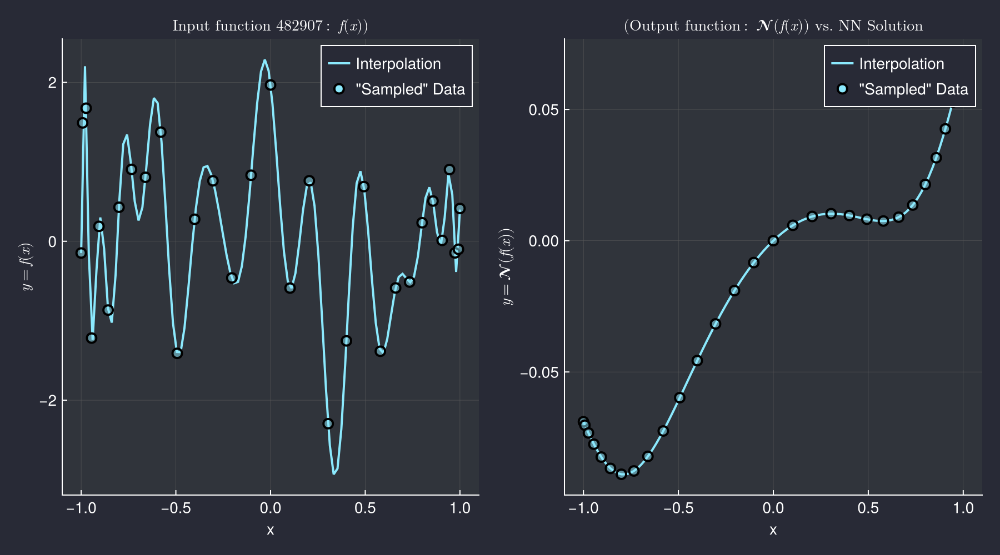

In [119]:
selection = rand(1:num_samples);

plot_inputoutput_curves(selection;
  grid_nodes=nodes_x,
  input_data=train_input_fns[:, selection],
  output_data=train_output_fns[:, selection])

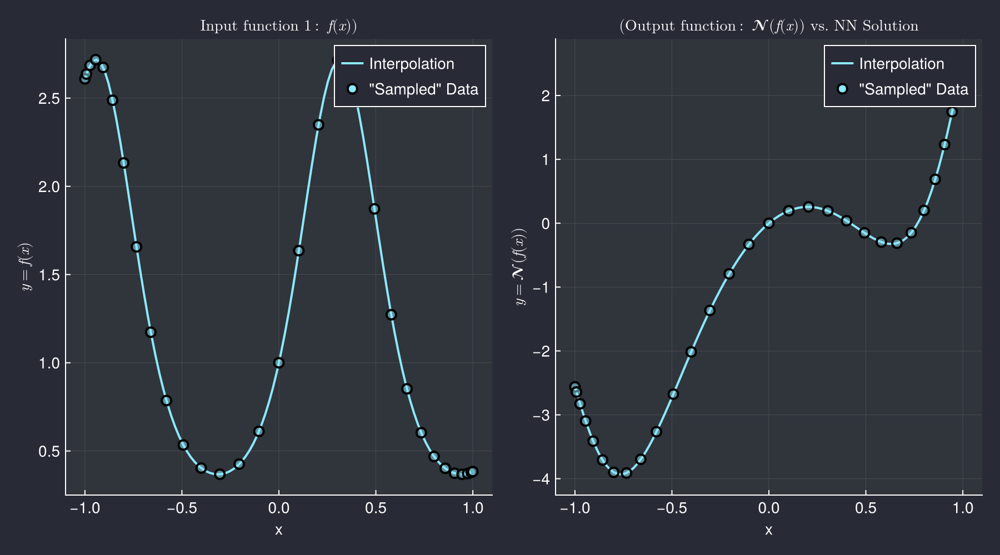

In [120]:
function f_part(x)
  return exp.(sin.(5 * x))
end

nodes_x_part, nodes_y_part, input_f_part, output_f_part = generate_data(Nx, Ny, f_part, test_nonlin_integDiff_operator);
plot_inputoutput_curves(1;
  grid_nodes=nodes_x_part,
  input_data=input_f_part,
  output_data=output_f_part)

In [122]:
# train_input_fns = f32(train_input_fns);
# train_output_fns = f32(vec.(train_output_fns))

train_input_fns = f32(train_input_fns);
train_output_fns = f32(train_output_fns)

31×1000000 Matrix{Float32}:
  0.205612     0.395477    0.0406273  …   0.471508   -0.434181    0.0318968
  0.23238      0.419682    0.0917137      0.448565   -0.469346   -0.0501114
  0.293808     0.47516     0.209076       0.395689   -0.54999    -0.238545
  0.384533     0.556794    0.382913       0.316667   -0.66886    -0.517793
  0.493278     0.653793    0.592703       0.219325   -0.810674   -0.855186
  0.601398     0.748294    0.804549   …   0.116539   -0.950154   -1.19678
  0.685177     0.81757     0.975332       0.0246844  -1.05514    -1.47394
  0.722275     0.84024     1.0644        -0.0407368  -1.09536    -1.62195
  0.699887     0.804118    1.04832       -0.0706262  -1.05352    -1.60351
  0.620095     0.711362    0.930622      -0.0659157  -0.932563   -1.42411
  ⋮                                   ⋱                          
  0.428307     0.281758    0.994662      -0.693411   -0.480037   -1.64564
  0.420361     0.259537    1.00474       -0.733081   -0.457826   -1.66879
  0.356131 

In [224]:
methods(leakyrelu)

# 3 methods for generic function "leakyrelu" from NNlib:
 [1] leakyrelu(x::AbstractArray, args...)
     @ ~/.julia/packages/NNlib/mRRJu/src/activations.jl:754
 [2] leakyrelu(x, a)
     @ ~/.julia/packages/NNlib/mRRJu/src/activations.jl:212
 [3] leakyrelu(x)
     @ ~/.julia/packages/NNlib/mRRJu/src/activations.jl:212

In [225]:
typeof(α_custom)

Float32

In [226]:
typeof(0.001f0)

Float32

In [227]:
typeof(0.01f0)

Float32

In [123]:
# celu_custom(x) = NNlib.celu(x, 0.001f0)
# function custom_celu(x::Float32)::Float32
#   α::Float32 = 0.001f0
#   ifelse(x > 0f0, x, α * (exp(x / α) - 1f0))
# end

# celu_custom(x) = NNlib.celu(x; α=0.001f0)

# ϕ = celu_custom
ϕ = leakyrelu;
N_hidden_layers = 2;
neuron_sizes::Vector{Int} = fill(64, N_hidden_layers + 1);
𝛟::Vector{<:Function} = fill(ϕ, N_hidden_layers + 1);

# model, Θ, layer_states = create_3layer_model(Nx, Ny, ϕ, rng)
model, Θ, layer_states = create_nlayer_mlp(Nx,
  Ny,
  neuron_sizes,
  𝛟; num_hidden_layers=N_hidden_layers)
model

Chain(
    layer_1 = Dense(31 => 64, leakyrelu),  # 2_048 parameters
    layer_2 = Dense(64 => 64, leakyrelu),  # 4_160 parameters
    layer_3 = Dense(64 => 31, use_bias=false),  # 1_984 parameters
)         # Total: 8_192 parameters,
          #        plus 0 states.

In [124]:
lines(LinRange(-1.0, 1.0, 1000), celu_custom.(LinRange(-1.0, 1.0, 1000)))

UndefVarError: UndefVarError: `celu_custom` not defined in `Main`
Suggestion: check for spelling errors or missing imports.

In [83]:
# opt = Adam(0.001f0)
# optimiser_state = Optimisers.setup(opt, Θ)

In [125]:
function loss_function(model, ps, st, x, y)
  pred, _ = model(x, ps, st)
  return MSELoss()(pred, y)
end

loss_function (generic function with 1 method)

In [126]:
const dev_cpu = cpu_device()
const dev_gpu = gpu_device()
const dev_xla = xla_device()

chosen_dev = dev_gpu;
# chosen_dev = dev_cpu;
Θ_ra = Θ |> chosen_dev;
st_ra = layer_states |> chosen_dev;
# dataloader = DeviceIterator(chosen_dev, zip(train_input_fns, train_output_fns))

(layer_1 = NamedTuple(), layer_2 = NamedTuple(), layer_3 = NamedTuple())

In [127]:
# Batch size
# batch_size = 500

# Create DataLoader
train_loss_history::Vector{Float64} = [];
dataloader = DataLoader((train_input_fns, train_output_fns); parallel=true, batchsize=1000)
# batchsize = batch_size, shuffle = true)


1000-element DataLoader(::Tuple{Matrix{Float32}, Matrix{Float32}}, parallel=true, batchsize=1000)
  with first element:
  (31×1000 Matrix{Float32}, 31×1000 Matrix{Float32},)

In [259]:
# # function create_batches(inputs, outputs, batch_size)
# #   # batches = []
# #   batches = Vector{Tuple{MtlArray,MtlArray}}()
# #   for i in 1:batch_size:length(inputs)
# #     end_idx = min(i + batch_size - 1, length(inputs))
# #     push!(batches, (inputs[i:end_idx], outputs[i:end_idx]))
# #   end
# #   return batches
# # end

# # function create_metal_batches(inputs, outputs, batch_size)
# #   batches = []
# #   for i in 1:batch_size:length(inputs)
# #     end_idx = min(i + batch_size - 1, length(inputs))
# #     x_batch = MtlArray.(inputs[i:end_idx])
# #     y_batch = MtlArray.(outputs[i:end_idx])
# #     push!(batches, (x_batch, y_batch))
# #   end
# #   return batches
# # end

# function create_mtl_batches(inputs_matrix, outputs_matrix, batch_size)
#   batches = Vector{Tuple{MtlArray,MtlArray}}()  # Pre-allocate with specific types
#   num_samples = size(inputs_matrix, 2)

#   for i in 1:batch_size:num_samples
#     end_idx = min(i + batch_size - 1, num_samples)
#     x_batch = MtlArray(inputs_matrix[:, i:end_idx])
#     y_batch = MtlArray(outputs_matrix[:, i:end_idx])
#     push!(batches, (x_batch, y_batch))
#   end
#   return batches
# end

# batch_size = 100  # Set batch size
# # batched_inputs_outputs = create_batches(train_input_fns, train_output_fns, batch_size)

# # # Convert to device-specific iterator with batches
# # dataloader = DeviceIterator(chosen_dev, batched_inputs_outputs)

# # # # Create Metal-compatible batches
# # batched_inputs_outputs = create_metal_batches(train_input_fns, train_output_fns, batch_size)
# # dataloader = DeviceIterator(chosen_dev, batched_inputs_outputs)

# batched_inputs_outputs = create_mtl_batches(train_input_fns, train_output_fns, batch_size)
# dataloader = DeviceIterator(chosen_dev, batched_inputs_outputs)

In [128]:
dataloader

1000-element DataLoader(::Tuple{Matrix{Float32}, Matrix{Float32}}, parallel=true, batchsize=1000)
  with first element:
  (31×1000 Matrix{Float32}, 31×1000 Matrix{Float32},)

In [129]:
function train_model_with_dataloader(model, ps, st, dataloader; epochs, lr)
  train_loss_history::Vector{Float64} = []
  train_state = Training.TrainState(model, ps, st, Adam(lr))

  for epoch in 1:epochs
    epoch_loss::Real = 0.0
    num_batches::Int = 0
    for (i, (x_batch, y_batch)) in enumerate(dataloader)
      # Transfer to the desired device
      x_batch = cu(x_batch)
      y_batch = cu(y_batch)

      # Perform a training step in one sixth_conv_test
      _, loss, _, train_state = Training.single_train_step!(
        AutoZygote(), MSELoss(), (x_batch, y_batch), train_state)

      # Accumulate loss and batch count
      epoch_loss += loss
      num_batches += 1

      # Print loss for monitoring
      # if epoch % 10 == 0 || i == 1
      if epoch % 10 == 0 && i % 100 == 0
        println("Epoch: [$epoch/$epochs]\tBatch: $i\tLoss: $loss")
      end
    end

    # Compute average loss for the epoch
    avg_epoch_loss::Float64 = epoch_loss / num_batches
    push!(train_loss_history, avg_epoch_loss)

    # Print average loss for the epoch
    if epoch % 10 == 0
      println("Epoch: [$epoch/$epochs]\tAverage Loss: $avg_epoch_loss")
    end

  end

  return train_state, train_loss_history
end

train_model_with_dataloader (generic function with 1 method)

In [130]:
# train_model(model, Θ_ra, st_ra, dataloader)
train_state, train_loss_history = train_model_with_dataloader(model, Θ_ra, st_ra, dataloader, epochs=5000, lr=0.001)

Epoch: [10/5000]	Batch: 100	Loss: 0.00063098356
Epoch: [10/5000]	Batch: 200	Loss: 0.0006053805
Epoch: [10/5000]	Batch: 300	Loss: 0.00065377716
Epoch: [10/5000]	Batch: 400	Loss: 0.0006703638
Epoch: [10/5000]	Batch: 500	Loss: 0.00066325685
Epoch: [10/5000]	Batch: 600	Loss: 0.00064724276
Epoch: [10/5000]	Batch: 700	Loss: 0.0006278726
Epoch: [10/5000]	Batch: 800	Loss: 0.00063150516
Epoch: [10/5000]	Batch: 900	Loss: 0.0006524137
Epoch: [10/5000]	Batch: 1000	Loss: 0.00063866965
Epoch: [10/5000]	Average Loss: 0.000651522665459197
Epoch: [20/5000]	Batch: 100	Loss: 0.00041198486
Epoch: [20/5000]	Batch: 200	Loss: 0.00045038178
Epoch: [20/5000]	Batch: 300	Loss: 0.00041494553
Epoch: [20/5000]	Batch: 400	Loss: 0.00041788304
Epoch: [20/5000]	Batch: 500	Loss: 0.00044295774
Epoch: [20/5000]	Batch: 600	Loss: 0.00045005445
Epoch: [20/5000]	Batch: 700	Loss: 0.00042796202
Epoch: [20/5000]	Batch: 800	Loss: 0.00040572818
Epoch: [20/5000]	Batch: 900	Loss: 0.00041216766
Epoch: [20/5000]	Batch: 1000	Loss: 0.00

Excessive output truncated after 524333 bytes.

(Lux.Training.TrainState{Nothing, Nothing, Chain{@NamedTuple{layer_1::Dense{typeof(leakyrelu), Int64, Int64, Nothing, Nothing, Static.True}, layer_2::Dense{typeof(leakyrelu), Int64, Int64, Nothing, Nothing, Static.True}, layer_3::Dense{typeof(identity), Int64, Int64, Nothing, Nothing, Static.False}}, Nothing}, @NamedTuple{layer_1::@NamedTuple{weight::CuArray{Float32, 2, CUDA.DeviceMemory}, bias::CuArray{Float32, 1, CUDA.DeviceMemory}}, layer_2::@NamedTuple{weight::CuArray{Float32, 2, CUDA.DeviceMemory}, bias::CuArray{Float32, 1, CUDA.DeviceMemory}}, layer_3::@NamedTuple{weight::CuArray{Float32, 2, CUDA.DeviceMemory}}}, @NamedTuple{layer_1::@NamedTuple{}, layer_2::@NamedTuple{}, layer_3::@NamedTuple{}}, Adam, @NamedTuple{layer_1::@NamedTuple{weight::Optimisers.Leaf{Adam, Tuple{CuArray{Float32, 2, CUDA.DeviceMemory}, CuArray{Float32, 2, CUDA.DeviceMemory}, Tuple{Float32, Float32}}}, bias::Optimisers.Leaf{Adam, Tuple{CuArray{Float32, 1, CUDA.DeviceMemory}, CuArray{Float32, 1, CUDA.DeviceM

In [109]:
Θ_ra

(layer_1 = (weight = Float32[0.011377039 0.012891314 … 0.013773428 -0.0039304867; -0.0074649965 0.0009998989 … 0.005803765 0.018894017; … ; 0.014267255 0.008859368 … 0.00751825 -0.008955712; -0.0008434155 -0.0036377471 … 0.0021348945 -0.002058774], bias = Float32[0.5857768, -0.37029892, 0.2116236, 0.53061724, -0.1315889, -0.58056813, -0.28818542, 0.71669406, 0.041078635, 0.43987265  …  -0.5069365, 0.94779134, 0.29128796, 0.3004107, -0.6921037, 0.20385589, 0.096869856, 0.58435214, 0.6349592, -0.2238326]), layer_2 = (weight = Float32[0.14822637 -0.028702393 … 0.09214293 0.045455754; 0.036344178 0.003828614 … 0.08833612 -0.052476924; … ; 0.07666737 -0.029099442 … 0.28441724 0.1788605; -0.13534586 -0.026660055 … -0.12573187 0.115386404], bias = Float32[-0.01651977, -0.11610421, -0.047651526, -0.27778566, -0.20952933, -0.013731723, -0.18016508, 0.5227366, -0.052421622, -0.05030081  …  0.17856729, -0.117136426, 0.028771034, -0.18094152, 0.22650287, -0.41908196, -0.34629652, 0.13401963, -0.22

In [110]:
train_loss_history

Float64[]

In [92]:
# using Plots
epochs = 100
# Assume train_loss_history is available after training
lines(train_loss_history, xlabel="Epoch", ylabel="Average Loss", title="Training Loss History")


MakieCore.InvalidAttributeError: Invalid attributes ylabel, title and xlabel for plot type Lines{Tuple{Vector{Point{2, Float64}}}}.

The available plot attributes for Lines{Tuple{Vector{Point{2, Float64}}}} are:

alpha        cycle            inspector_hover  lowclip      ssao          
clip_planes  depth_shift      inspector_label  miter_limit  transformation
color        fxaa             joinstyle        model        transparency  
colormap     highclip         linecap          nan_color    visible       
colorrange   inspectable      linestyle        overdraw                   
colorscale   inspector_clear  linewidth        space                      



In [109]:
CairoMakie.activate!()

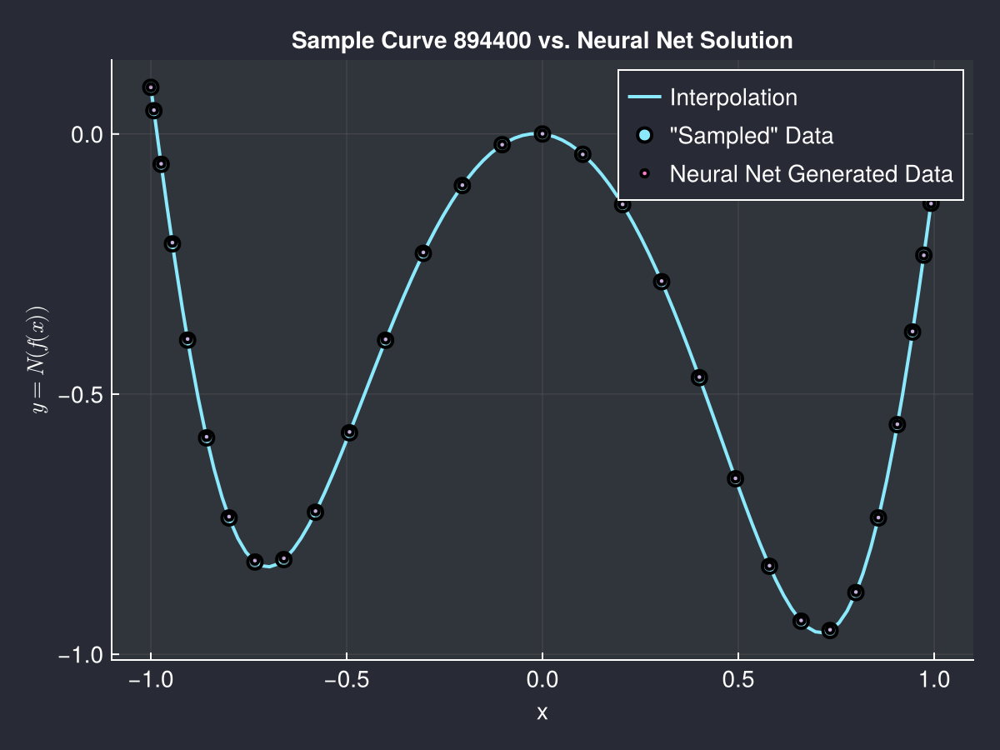

In [142]:
selection = rand(1:num_samples);
Θ_cpu = Θ_ra |> dev_cpu
st_cpu = st_ra |> dev_cpu
## input_data = dev_cpu(train_input_fns[:, selection])
# input_data = train_input_fns[selection] |> chosen_dev
# y_pred, _ = model(input_data, Θ_ra, st_ra)
input_data = train_input_fns[:, selection] |> dev_cpu
y_pred, _ = model(input_data, Θ_cpu, st_cpu)

# nodes_x_ra = nodes_x |> chosen_dev
nodes_x_ra = nodes_x |> dev_cpu

print("Selection: ", selection)
begin

  fig = Makie.Figure()
  ax = Makie.Axis(fig[1, 1]; xlabel="x", ylabel=L"y = N(f(x))", title="Sample Curve $selection vs. Neural Net Solution")

  add_interp_line(ax, train_output_fns[:, selection])
  Makie.scatter!(ax, nodes_x_ra, train_output_fns[:, selection],
    label="\"Sampled\" Data";
    markersize=12,
    alpha=0.5,
    strokewidth=2)
  Makie.scatter!(ax, nodes_x_ra, y_pred,
    label="Neural Net Generated Data";
    markersize=6,
    alpha=0.5,
    strokewidth=2)

  axislegend(ax)
  fig

end

In [143]:
function 𝒻ₚ(x)
  return exp.(sin.(5 * x))
end

𝒻ₚ (generic function with 1 method)

In [144]:
nodesxₚ_gll, nodes_y_part, input_𝒻ₚ, output_𝒻ₚ = generate_data(Nx, Ny, 𝒻ₚ, test_nonlin_integDiff_operator)

([-1.0, -0.9921168443464811, -0.9736549358157365, -0.9448691702080393, -0.9060669514412698, -0.8576599952974556, -0.800161543192463, -0.7341811363090752, -0.6604182026115255, -0.5796546572080019  …  0.5796546572080019, 0.6604182026115255, 0.7341811363090752, 0.800161543192463, 0.8576599952974556, 0.9060669514412698, 0.9448691702080393, 0.9736549358157365, 0.9921168443464811, 1.0], [-1.0, -0.9921168443464811, -0.9736549358157365, -0.9448691702080393, -0.9060669514412698, -0.8576599952974556, -0.800161543192463, -0.7341811363090752, -0.6604182026115255, -0.5796546572080019  …  0.5796546572080019, 0.6604182026115255, 0.7341811363090752, 0.800161543192463, 0.8576599952974556, 0.9060669514412698, 0.9448691702080393, 0.9736549358157365, 0.9921168443464811, 1.0], [2.6088885159207567, 2.6362497235774076, 2.6855200839832483, 2.7180875257514727, 2.6737282601097756, 2.4878377941777083, 2.1325750789316196, 1.6568869288219128, 1.1732881373231523, 0.7859001433297719  …  1.2724262853078392, 0.8523055

In [145]:
𝒻ₚ_gll::Data_with_Grid{Float64} = Data_with_Grid(input_data=input_𝒻ₚ, output_data=output_𝒻ₚ, nodes=nodesxₚ_gll) # domain and codomain grid are the same size

Data_with_Grid{Float64}([2.6088885159207567, 2.6362497235774076, 2.6855200839832483, 2.7180875257514727, 2.6737282601097756, 2.4878377941777083, 2.1325750789316196, 1.6568869288219128, 1.1732881373231523, 0.7859001433297719  …  1.2724262853078392, 0.8523055575090807, 0.6035414865098999, 0.46891666787224273, 0.40195546604376775, 0.3740095861345845, 0.3679057390631778, 0.37236735110048713, 0.3793267348902719, 0.3833049951722714], [-2.562174332955322, -2.6428505229980153, -2.827316991751032, -3.0969745627794305, -3.4123161474340717, -3.707848440046156, -3.900235454886969, -3.911211786717782, -3.6965585944025037, -3.2651031535627384  …  -0.2947505842100216, -0.3123454589070276, -0.14901166033561078, 0.20007128148433148, 0.68710041266129, 1.2306868264097242, 1.7448645090362334, 2.1620303796536513, 2.4411021047563533, 2.562174332955322], [-1.0, -0.9921168443464811, -0.9736549358157365, -0.9448691702080393, -0.9060669514412698, -0.8576599952974556, -0.800161543192463, -0.7341811363090752, -0.

In [149]:
𝚯_2L::ComponentArray{<:Float32} = Θ_cpu |> ComponentArray

ComponentVector{Float32}(layer_1 = (weight = Float32[0.001630226 0.03785439 … -0.040914465 0.006787362; 0.01380539 -0.010417026 … -0.022645853 -0.0048397756; … ; 0.005913738 -0.01508383 … 0.015414384 -0.034277953; -0.03007214 -0.038436707 … -0.00011298003 -0.05642485], bias = Float32[0.11560506, -0.015366524, -0.8344912, 0.9139714, -0.13406642, 0.22684495, 0.19937728, 0.005209032, 4.2867155, 0.028010791  …  0.0015541036, 0.77926695, 0.08831454, 0.0022311413, -1.4468225, 4.306013, 0.15076417, 0.6178902, 1.1228822, -0.9973082]), layer_2 = (weight = Float32[0.00052721926 -0.00539972 … 0.00033521518 0.0028468487; -0.04671078 -1.4799471 … -0.00498913 -0.02342096; … ; -0.005819299 0.0022466464 … -0.005650473 -0.018647127; 0.0032913515 0.012108167 … 0.004310333 0.009798938], bias = Float32[-2.1493387, 0.54204094, -0.94745654, 0.2547512, -0.7635997, -5.034853, -2.3011286, -0.6993657, 0.012715354, 0.058247067  …  -0.42049962, 0.11063289, -0.71436095, 0.035454623, -0.23533742, -0.6447184, -0.079

In [150]:
𝒩ₙₙ2L(x; ps=𝚯_2L, st=st_cpu) = model(x, ps, st)[1]

𝒩ₙₙ2L (generic function with 1 method)

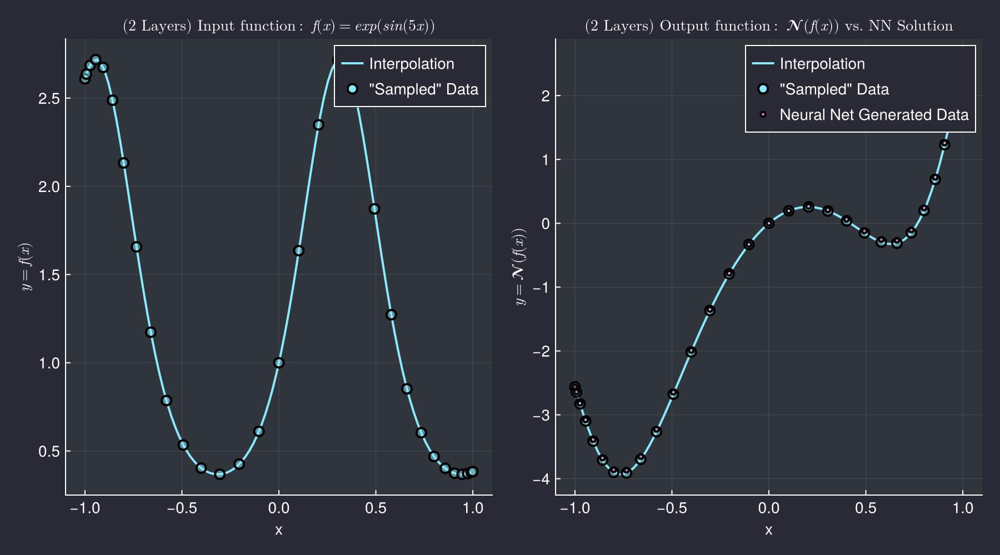

In [153]:
plot_inputoutput_curves(𝒻ₚ_gll, 𝒩ₙₙ2L, 𝚯_2L)

In [132]:
jldsave("Saved_Models/nonlin_op/2layerFF_LReluActFN_1MSamples_1kBatch_5000Epochs.jld2"; params=Θ_cpu, layer_states=st_cpu)

In [106]:
train_input_fns

31×1000000 Matrix{Float32}:
  1.06752     1.37333     2.5162    …   0.282795   -1.56013    -0.358542
  0.811406    1.2821     -1.16564       0.665818   -1.10401     1.83023
  0.0837552   0.245285    0.228311     -0.0964818  -1.40194     0.35242
 -0.631024    1.84       -0.143559     -0.403137   -1.14233     1.36549
  0.157542   -0.0337075   1.46445      -1.23258     0.671079   -0.0510741
  1.24198     1.20631    -0.41518   …   0.352565   -0.322054    1.39472
  0.0178615  -1.45546    -1.59721      -0.334656   -0.308054    1.85666
  1.08882     0.43107     0.746918      0.0422986   0.542664   -0.762676
  0.0234508   0.98431    -0.1664        0.218161    0.350909   -0.97096
  0.309894   -1.46162    -0.218155     -1.30045    -0.709046    0.467615
  ⋮                                 ⋱                          
 -0.570495   -0.27989     0.818844     -0.0545032  -2.43784    -0.583413
 -0.409967    1.05176     0.759989     -0.898722   -0.972092    1.38614
 -0.133532    1.46183     1.21441     

In [ ]:
selection = rand(1:num_samples);
Θ_cpu = Θ_ra |> dev_cpu
st_cpu = st_ra |> dev_cpu
input_data = train_input_fns[:, selection] |> dev_cpu
y_pred, _ = model(input_data, Θ_cpu, st_cpu)

# nodes_x_ra = nodes_x |> chosen_dev
nodes_x_ra = nodes_x |> dev_cpu

print("Selection: ", selection)
begin

  fig = Makie.Figure()
  ax = Makie.Axis(fig[1, 1]; xlabel="x", ylabel=L"y = N(f(x))", title="Sample Curve $selection vs. Neural Net Solution")

  add_interp_line(ax, train_output_fns[:, selection])
  Makie.scatter!(ax, nodes_x_ra, train_output_fns[:, selection],
    label="\"Sampled\" Data";
    markersize=12,
    alpha=0.5,
    strokewidth=2)
  Makie.scatter!(ax, nodes_x_ra, y_pred,
    label="Neural Net Generated Data";
    markersize=6,
    alpha=0.5,
    strokewidth=2)

  axislegend(ax)
  fig

end

In [265]:
# celu_custom(x) = NNlib.celu(x, 0.001f0)
# function custom_celu(x::Float32)::Float32
#   α::Float32 = 0.001f0
#   ifelse(x > 0f0, x, α * (exp(x / α) - 1f0))
# end

# celu_custom(x) = NNlib.celu(x; α=0.001f0)

ϕ = leakyrelu
# ϕ = leakyrelu;
N_hidden_layers = 3;
neuron_sizes::Vector{Int} = fill(64, N_hidden_layers + 1);
𝛟::Vector{<:Function} = fill(ϕ, N_hidden_layers + 1);

# model, Θ, layer_states = create_3layer_model(Nx, Ny, ϕ, rng)
model, Θ, layer_states = create_nlayer_mlp(Nx,
  Ny,
  neuron_sizes,
  𝛟; num_hidden_layers=N_hidden_layers)
model

Chain(
    layer_1 = Dense(31 => 64, leakyrelu),  # 2_048 parameters
    layer_2 = Dense(64 => 64, leakyrelu),  # 4_160 parameters
    layer_3 = Dense(64 => 64, leakyrelu),  # 4_160 parameters
    layer_4 = Dense(64 => 31, use_bias=false),  # 1_984 parameters
)         # Total: 12_352 parameters,
          #        plus 0 states.

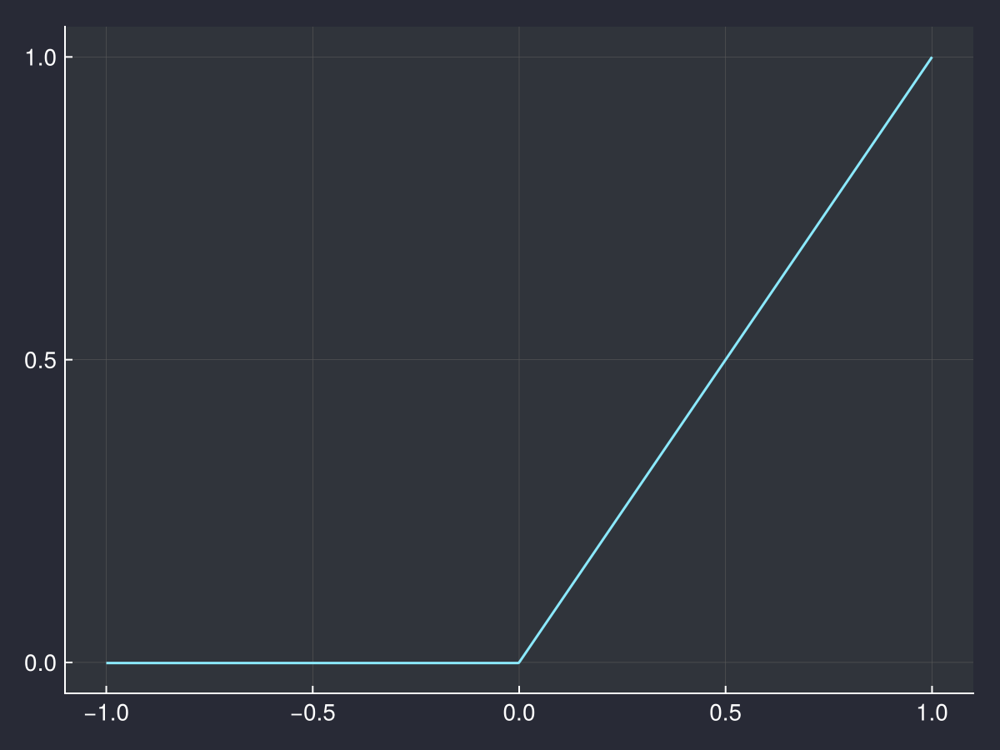

In [266]:
lines(LinRange(-1.0, 1.0, 1000), celu_custom.(LinRange(-1.0, 1.0, 1000)))

In [ ]:
# opt = Adam(0.001f0)
# optimiser_state = Optimisers.setup(opt, Θ)

In [267]:
function loss_function(model, ps, st, x, y)
  pred, _ = model(x, ps, st)
  return MSELoss()(pred, y)
end

loss_function (generic function with 1 method)

In [268]:
const dev_cpu = cpu_device()
const dev_gpu = gpu_device()
const dev_xla = xla_device()

chosen_dev = dev_gpu;
# chosen_dev = dev_cpu;
Θ_ra = Θ |> chosen_dev;
st_ra = layer_states |> chosen_dev;
# dataloader = DeviceIterator(chosen_dev, zip(train_input_fns, train_output_fns))

(layer_1 = NamedTuple(), layer_2 = NamedTuple(), layer_3 = NamedTuple(), layer_4 = NamedTuple())

In [269]:
# Batch size
# batch_size = 500

# Create DataLoader
train_loss_history::Vector{Float64} = [];
dataloader = DataLoader((train_input_fns, train_output_fns); parallel=true, batchsize=1000)
# batchsize = batch_size, shuffle = true)


1000-element DataLoader(::Tuple{Matrix{Float32}, Matrix{Float32}}, parallel=true, batchsize=1000)
  with first element:
  (31×1000 Matrix{Float32}, 31×1000 Matrix{Float32},)

In [270]:
# # function create_batches(inputs, outputs, batch_size)
# #   # batches = []
# #   batches = Vector{Tuple{MtlArray,MtlArray}}()
# #   for i in 1:batch_size:length(inputs)
# #     end_idx = min(i + batch_size - 1, length(inputs))
# #     push!(batches, (inputs[i:end_idx], outputs[i:end_idx]))
# #   end
# #   return batches
# # end

# # function create_metal_batches(inputs, outputs, batch_size)
# #   batches = []
# #   for i in 1:batch_size:length(inputs)
# #     end_idx = min(i + batch_size - 1, length(inputs))
# #     x_batch = MtlArray.(inputs[i:end_idx])
# #     y_batch = MtlArray.(outputs[i:end_idx])
# #     push!(batches, (x_batch, y_batch))
# #   end
# #   return batches
# # end

# function create_mtl_batches(inputs_matrix, outputs_matrix, batch_size)
#   batches = Vector{Tuple{MtlArray,MtlArray}}()  # Pre-allocate with specific types
#   num_samples = size(inputs_matrix, 2)

#   for i in 1:batch_size:num_samples
#     end_idx = min(i + batch_size - 1, num_samples)
#     x_batch = MtlArray(inputs_matrix[:, i:end_idx])
#     y_batch = MtlArray(outputs_matrix[:, i:end_idx])
#     push!(batches, (x_batch, y_batch))
#   end
#   return batches
# end

# batch_size = 100  # Set batch size
# # batched_inputs_outputs = create_batches(train_input_fns, train_output_fns, batch_size)

# # # Convert to device-specific iterator with batches
# # dataloader = DeviceIterator(chosen_dev, batched_inputs_outputs)

# # # # Create Metal-compatible batches
# # batched_inputs_outputs = create_metal_batches(train_input_fns, train_output_fns, batch_size)
# # dataloader = DeviceIterator(chosen_dev, batched_inputs_outputs)

# batched_inputs_outputs = create_mtl_batches(train_input_fns, train_output_fns, batch_size)
# dataloader = DeviceIterator(chosen_dev, batched_inputs_outputs)

In [271]:
dataloader

1000-element DataLoader(::Tuple{Matrix{Float32}, Matrix{Float32}}, parallel=true, batchsize=1000)
  with first element:
  (31×1000 Matrix{Float32}, 31×1000 Matrix{Float32},)

In [272]:
function train_model_with_dataloader(model, ps, st, dataloader; epochs, lr)
  train_loss_history::Vector{Float64} = []
  train_state = Training.TrainState(model, ps, st, Adam(lr))

  for epoch in 1:epochs
    epoch_loss::Real = 0.0
    num_batches::Int = 0
    for (i, (x_batch, y_batch)) in enumerate(dataloader)
      # Transfer to the desired device
      x_batch = cu(x_batch)
      y_batch = cu(y_batch)

      # Perform a training step in one sixth_conv_test
      _, loss, _, train_state = Training.single_train_step!(
        AutoZygote(), MSELoss(), (x_batch, y_batch), train_state)

      # Accumulate loss and batch count
      epoch_loss += loss
      num_batches += 1

      # Print loss for monitoring
      # if epoch % 10 == 0 || i == 1
      if epoch % 10 == 0 && i % 100 == 0
        println("Epoch: [$epoch/$epochs]\tBatch: $i\tLoss: $loss")
      end
    end

    # Compute average loss for the epoch
    avg_epoch_loss::Float64 = epoch_loss / num_batches
    push!(train_loss_history, avg_epoch_loss)

    # Print average loss for the epoch
    if epoch % 10 == 0
      println("Epoch: [$epoch/$epochs]\tAverage Loss: $avg_epoch_loss")
    end

  end

  return train_state, train_loss_history
end

train_model_with_dataloader (generic function with 1 method)

In [273]:
# train_model(model, Θ_ra, st_ra, dataloader)
train_state, train_loss_history = train_model_with_dataloader(model, Θ_ra, st_ra, dataloader, epochs=1000, lr=0.001)

Epoch: [10/1000]	Batch: 100	Loss: 0.06307292
Epoch: [10/1000]	Batch: 200	Loss: 0.07431024
Epoch: [10/1000]	Batch: 300	Loss: 0.061665095
Epoch: [10/1000]	Batch: 400	Loss: 0.061810058
Epoch: [10/1000]	Batch: 500	Loss: 0.06993704
Epoch: [10/1000]	Batch: 600	Loss: 0.07490139
Epoch: [10/1000]	Batch: 700	Loss: 0.06596594
Epoch: [10/1000]	Batch: 800	Loss: 0.06412835
Epoch: [10/1000]	Batch: 900	Loss: 0.070296705
Epoch: [10/1000]	Batch: 1000	Loss: 0.06327449
Epoch: [10/1000]	Average Loss: 0.0694755700752139
Epoch: [20/1000]	Batch: 100	Loss: 0.050347026
Epoch: [20/1000]	Batch: 200	Loss: 0.046878446
Epoch: [20/1000]	Batch: 300	Loss: 0.047199562
Epoch: [20/1000]	Batch: 400	Loss: 0.046656974
Epoch: [20/1000]	Batch: 500	Loss: 0.05005933
Epoch: [20/1000]	Batch: 600	Loss: 0.05071903
Epoch: [20/1000]	Batch: 700	Loss: 0.04758215
Epoch: [20/1000]	Batch: 800	Loss: 0.049198207
Epoch: [20/1000]	Batch: 900	Loss: 0.044540662
Epoch: [20/1000]	Batch: 1000	Loss: 0.042483337
Epoch: [20/1000]	Average Loss: 0.04948

(Lux.Training.TrainState{Nothing, Nothing, Chain{@NamedTuple{layer_1::Dense{typeof(leakyrelu), Int64, Int64, Nothing, Nothing, Static.True}, layer_2::Dense{typeof(leakyrelu), Int64, Int64, Nothing, Nothing, Static.True}, layer_3::Dense{typeof(leakyrelu), Int64, Int64, Nothing, Nothing, Static.True}, layer_4::Dense{typeof(identity), Int64, Int64, Nothing, Nothing, Static.False}}, Nothing}, @NamedTuple{layer_1::@NamedTuple{weight::CuArray{Float32, 2, CUDA.DeviceMemory}, bias::CuArray{Float32, 1, CUDA.DeviceMemory}}, layer_2::@NamedTuple{weight::CuArray{Float32, 2, CUDA.DeviceMemory}, bias::CuArray{Float32, 1, CUDA.DeviceMemory}}, layer_3::@NamedTuple{weight::CuArray{Float32, 2, CUDA.DeviceMemory}, bias::CuArray{Float32, 1, CUDA.DeviceMemory}}, layer_4::@NamedTuple{weight::CuArray{Float32, 2, CUDA.DeviceMemory}}}, @NamedTuple{layer_1::@NamedTuple{}, layer_2::@NamedTuple{}, layer_3::@NamedTuple{}, layer_4::@NamedTuple{}}, Adam, @NamedTuple{layer_1::@NamedTuple{weight::Optimisers.Leaf{Adam,

In [ ]:
Θ_ra

(layer_1 = (weight = Float32[0.011377039 0.012891314 … 0.013773428 -0.0039304867; -0.0074649965 0.0009998989 … 0.005803765 0.018894017; … ; 0.014267255 0.008859368 … 0.00751825 -0.008955712; -0.0008434155 -0.0036377471 … 0.0021348945 -0.002058774], bias = Float32[0.5857768, -0.37029892, 0.2116236, 0.53061724, -0.1315889, -0.58056813, -0.28818542, 0.71669406, 0.041078635, 0.43987265  …  -0.5069365, 0.94779134, 0.29128796, 0.3004107, -0.6921037, 0.20385589, 0.096869856, 0.58435214, 0.6349592, -0.2238326]), layer_2 = (weight = Float32[0.14822637 -0.028702393 … 0.09214293 0.045455754; 0.036344178 0.003828614 … 0.08833612 -0.052476924; … ; 0.07666737 -0.029099442 … 0.28441724 0.1788605; -0.13534586 -0.026660055 … -0.12573187 0.115386404], bias = Float32[-0.01651977, -0.11610421, -0.047651526, -0.27778566, -0.20952933, -0.013731723, -0.18016508, 0.5227366, -0.052421622, -0.05030081  …  0.17856729, -0.117136426, 0.028771034, -0.18094152, 0.22650287, -0.41908196, -0.34629652, 0.13401963, -0.22

In [ ]:
train_loss_history

Float64[]

In [ ]:
# using Plots
epochs = 100
# Assume train_loss_history is available after training
lines(train_loss_history, xlabel="Epoch", ylabel="Average Loss", title="Training Loss History")


MakieCore.InvalidAttributeError: Invalid attributes ylabel, title and xlabel for plot type Lines{Tuple{Vector{Point{2, Float64}}}}.

The available plot attributes for Lines{Tuple{Vector{Point{2, Float64}}}} are:

alpha        cycle            inspector_hover  lowclip      ssao          
clip_planes  depth_shift      inspector_label  miter_limit  transformation
color        fxaa             joinstyle        model        transparency  
colormap     highclip         linecap          nan_color    visible       
colorrange   inspectable      linestyle        overdraw                   
colorscale   inspector_clear  linewidth        space                      


Generic attributes are:

clip_planes  dim_conversions  model      transformation  yautolimits        
cycle        label            rasterize  xautolimits     zautolimits        



In [ ]:
CairoMakie.activate!()

Selection: 568221

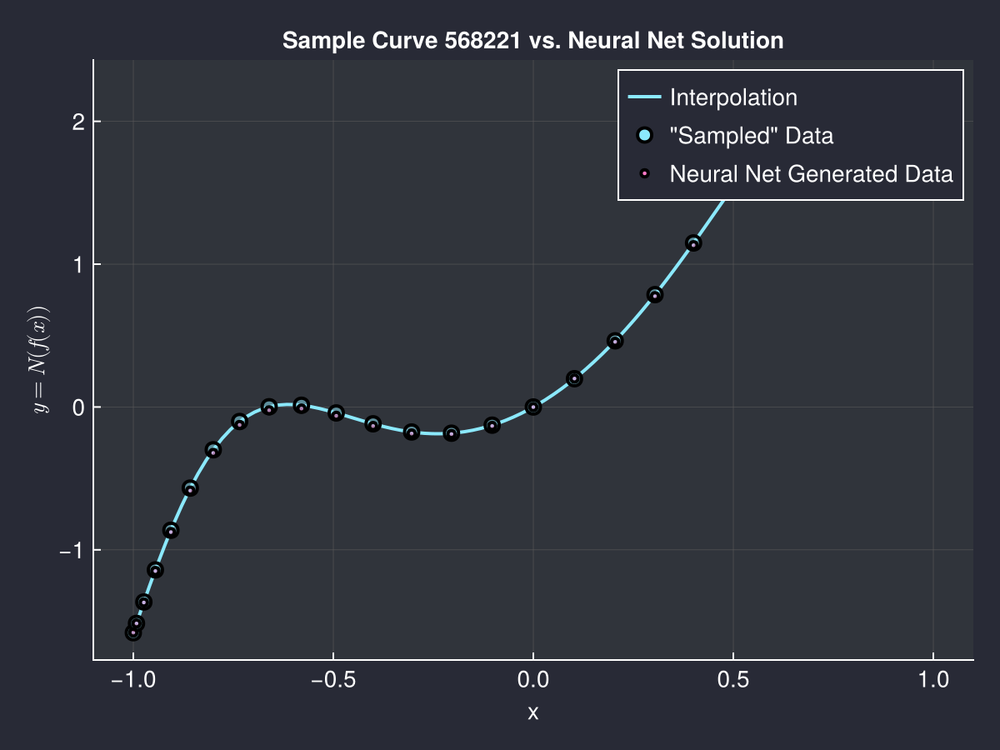

In [274]:
selection = rand(1:num_samples);
Θ_cpu = Θ_ra |> dev_cpu
st_cpu = st_ra |> dev_cpu
## input_data = dev_cpu(train_input_fns[:, selection])
# input_data = train_input_fns[selection] |> chosen_dev
# y_pred, _ = model(input_data, Θ_ra, st_ra)
input_data = train_input_fns[:, selection] |> dev_cpu
y_pred, _ = model(input_data, Θ_cpu, st_cpu)

# nodes_x_ra = nodes_x |> chosen_dev
nodes_x_ra = nodes_x |> dev_cpu

print("Selection: ", selection)
begin

  fig = Makie.Figure()
  ax = Makie.Axis(fig[1, 1]; xlabel="x", ylabel=L"y = N(f(x))", title="Sample Curve $selection vs. Neural Net Solution")

  add_interp_line(ax, train_output_fns[:, selection])
  Makie.scatter!(ax, nodes_x_ra, train_output_fns[:, selection],
    label="\"Sampled\" Data";
    markersize=12,
    alpha=0.5,
    strokewidth=2)
  Makie.scatter!(ax, nodes_x_ra, y_pred,
    label="Neural Net Generated Data";
    markersize=6,
    alpha=0.5,
    strokewidth=2)

  axislegend(ax)
  fig

end

In [ ]:
model

Chain(
    layer_1 = Dense(31 => 64, celu_custom),  # 2_048 parameters
    layer_2 = Dense(64 => 64, celu_custom),  # 4_160 parameters
    layer_3 = Dense(64 => 64, celu_custom),  # 4_160 parameters
    layer_4 = Dense(64 => 31, use_bias=false),  # 1_984 parameters
)         # Total: 12_352 parameters,
          #        plus 0 states.

In [275]:
jldsave("Saved_Models/3layerFF_leakyreluActFN_1MSamples_1kBatch_500Epochs.jld2"; params=Θ_cpu, layer_states=st_cpu)

In [276]:
celu_custom(x) = NNlib.celu(x, 0.00001f0)
# function custom_celu(x::Float32)::Float32
#   α::Float32 = 0.001f0
#   ifelse(x > 0f0, x, α * (exp(x / α) - 1f0))
# end

# celu_custom(x) = NNlib.celu(x; α=0.001f0)

ϕ = celu_custom
# ϕ = leakyrelu;
N_hidden_layers = 3;
neuron_sizes::Vector{Int} = fill(64, N_hidden_layers + 1);
𝛟::Vector{<:Function} = fill(ϕ, N_hidden_layers + 1);

# model, Θ, layer_states = create_3layer_model(Nx, Ny, ϕ, rng)
model, Θ, layer_states = create_nlayer_mlp(Nx,
  Ny,
  neuron_sizes,
  𝛟; num_hidden_layers=N_hidden_layers)
model

Chain(
    layer_1 = Dense(31 => 64, celu_custom),  # 2_048 parameters
    layer_2 = Dense(64 => 64, celu_custom),  # 4_160 parameters
    layer_3 = Dense(64 => 64, celu_custom),  # 4_160 parameters
    layer_4 = Dense(64 => 31, use_bias=false),  # 1_984 parameters
)         # Total: 12_352 parameters,
          #        plus 0 states.

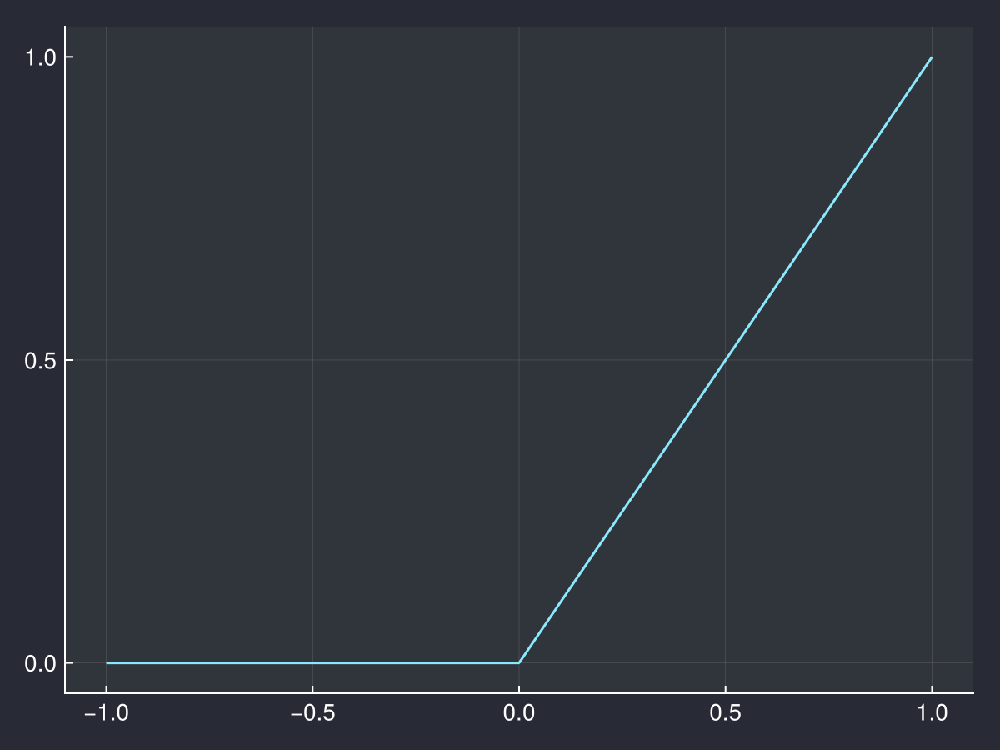

In [277]:
lines(LinRange(-1.0, 1.0, 1000), celu_custom.(LinRange(-1.0, 1.0, 1000)))

In [278]:
# opt = Adam(0.001f0)
# optimiser_state = Optimisers.setup(opt, Θ)

In [279]:
function loss_function(model, ps, st, x, y)
  pred, _ = model(x, ps, st)
  return MSELoss()(pred, y)
end

loss_function (generic function with 1 method)

In [280]:
const dev_cpu = cpu_device()
const dev_gpu = gpu_device()
const dev_xla = xla_device()

chosen_dev = dev_gpu;
# chosen_dev = dev_cpu;
Θ_ra = Θ |> chosen_dev;
st_ra = layer_states |> chosen_dev;
# dataloader = DeviceIterator(chosen_dev, zip(train_input_fns, train_output_fns))

(layer_1 = NamedTuple(), layer_2 = NamedTuple(), layer_3 = NamedTuple(), layer_4 = NamedTuple())

In [281]:
# Batch size
# batch_size = 500

# Create DataLoader
train_loss_history::Vector{Float64} = [];
dataloader = DataLoader((train_input_fns, train_output_fns); parallel=true, batchsize=1000)
# batchsize = batch_size, shuffle = true)


1000-element DataLoader(::Tuple{Matrix{Float32}, Matrix{Float32}}, parallel=true, batchsize=1000)
  with first element:
  (31×1000 Matrix{Float32}, 31×1000 Matrix{Float32},)

In [282]:
# # function create_batches(inputs, outputs, batch_size)
# #   # batches = []
# #   batches = Vector{Tuple{MtlArray,MtlArray}}()
# #   for i in 1:batch_size:length(inputs)
# #     end_idx = min(i + batch_size - 1, length(inputs))
# #     push!(batches, (inputs[i:end_idx], outputs[i:end_idx]))
# #   end
# #   return batches
# # end

# # function create_metal_batches(inputs, outputs, batch_size)
# #   batches = []
# #   for i in 1:batch_size:length(inputs)
# #     end_idx = min(i + batch_size - 1, length(inputs))
# #     x_batch = MtlArray.(inputs[i:end_idx])
# #     y_batch = MtlArray.(outputs[i:end_idx])
# #     push!(batches, (x_batch, y_batch))
# #   end
# #   return batches
# # end

# function create_mtl_batches(inputs_matrix, outputs_matrix, batch_size)
#   batches = Vector{Tuple{MtlArray,MtlArray}}()  # Pre-allocate with specific types
#   num_samples = size(inputs_matrix, 2)

#   for i in 1:batch_size:num_samples
#     end_idx = min(i + batch_size - 1, num_samples)
#     x_batch = MtlArray(inputs_matrix[:, i:end_idx])
#     y_batch = MtlArray(outputs_matrix[:, i:end_idx])
#     push!(batches, (x_batch, y_batch))
#   end
#   return batches
# end

# batch_size = 100  # Set batch size
# # batched_inputs_outputs = create_batches(train_input_fns, train_output_fns, batch_size)

# # # Convert to device-specific iterator with batches
# # dataloader = DeviceIterator(chosen_dev, batched_inputs_outputs)

# # # # Create Metal-compatible batches
# # batched_inputs_outputs = create_metal_batches(train_input_fns, train_output_fns, batch_size)
# # dataloader = DeviceIterator(chosen_dev, batched_inputs_outputs)

# batched_inputs_outputs = create_mtl_batches(train_input_fns, train_output_fns, batch_size)
# dataloader = DeviceIterator(chosen_dev, batched_inputs_outputs)

In [283]:
dataloader

1000-element DataLoader(::Tuple{Matrix{Float32}, Matrix{Float32}}, parallel=true, batchsize=1000)
  with first element:
  (31×1000 Matrix{Float32}, 31×1000 Matrix{Float32},)

In [95]:
function train_model_with_dataloader(model, ps, st, dataloader; epochs, lr)
  train_loss_history::Vector{Float64} = []
  train_state = Training.TrainState(model, ps, st, Adam(lr))

  for epoch in 1:epochs
    epoch_loss::Real = 0.0
    num_batches::Int = 0
    for (i, (x_batch, y_batch)) in enumerate(dataloader)
      # Transfer to the desired device
      x_batch = cu(x_batch)
      y_batch = cu(y_batch)

      # Perform a training step in one sixth_conv_test
      _, loss, _, train_state = Training.single_train_step!(
        AutoZygote(), MSELoss(), (x_batch, y_batch), train_state)

      # Accumulate loss and batch count
      epoch_loss += loss
      num_batches += 1

      # Print loss for monitoring
      # if epoch % 10 == 0 || i == 1
      if epoch % 10 == 0 && i % 100 == 0
        println("Epoch: [$epoch/$epochs]\tBatch: $i\tLoss: $loss")
      end
    end

    # Compute average loss for the epoch
    avg_epoch_loss::Float64 = epoch_loss / num_batches
    push!(train_loss_history, avg_epoch_loss)

    # Print average loss for the epoch
    if epoch % 10 == 0
      println("Epoch: [$epoch/$epochs]\tAverage Loss: $avg_epoch_loss")
    end

  end

  return train_state, train_loss_history
end

train_model_with_dataloader (generic function with 1 method)

In [96]:
# train_model(model, Θ_ra, st_ra, dataloader)
train_state, train_loss_history = train_model_with_dataloader(model, Θ_ra, st_ra, dataloader, epochs=1000, lr=0.001)

ErrorException: Not implemented

In [ ]:
Θ_ra

(layer_1 = (weight = Float32[0.011377039 0.012891314 … 0.013773428 -0.0039304867; -0.0074649965 0.0009998989 … 0.005803765 0.018894017; … ; 0.014267255 0.008859368 … 0.00751825 -0.008955712; -0.0008434155 -0.0036377471 … 0.0021348945 -0.002058774], bias = Float32[0.5857768, -0.37029892, 0.2116236, 0.53061724, -0.1315889, -0.58056813, -0.28818542, 0.71669406, 0.041078635, 0.43987265  …  -0.5069365, 0.94779134, 0.29128796, 0.3004107, -0.6921037, 0.20385589, 0.096869856, 0.58435214, 0.6349592, -0.2238326]), layer_2 = (weight = Float32[0.14822637 -0.028702393 … 0.09214293 0.045455754; 0.036344178 0.003828614 … 0.08833612 -0.052476924; … ; 0.07666737 -0.029099442 … 0.28441724 0.1788605; -0.13534586 -0.026660055 … -0.12573187 0.115386404], bias = Float32[-0.01651977, -0.11610421, -0.047651526, -0.27778566, -0.20952933, -0.013731723, -0.18016508, 0.5227366, -0.052421622, -0.05030081  …  0.17856729, -0.117136426, 0.028771034, -0.18094152, 0.22650287, -0.41908196, -0.34629652, 0.13401963, -0.22

In [ ]:
train_loss_history

Float64[]

In [ ]:
# using Plots
epochs = 100
# Assume train_loss_history is available after training
lines(train_loss_history, xlabel="Epoch", ylabel="Average Loss", title="Training Loss History")


MakieCore.InvalidAttributeError: Invalid attributes ylabel, title and xlabel for plot type Lines{Tuple{Vector{Point{2, Float64}}}}.

The available plot attributes for Lines{Tuple{Vector{Point{2, Float64}}}} are:

alpha        cycle            inspector_hover  lowclip      ssao          
clip_planes  depth_shift      inspector_label  miter_limit  transformation
color        fxaa             joinstyle        model        transparency  
colormap     highclip         linecap          nan_color    visible       
colorrange   inspectable      linestyle        overdraw                   
colorscale   inspector_clear  linewidth        space                      


Generic attributes are:

clip_planes  dim_conversions  model      transformation  yautolimits        
cycle        label            rasterize  xautolimits     zautolimits        



In [ ]:
CairoMakie.activate!()

In [2]:
selection = rand(1:num_samples);
Θ_cpu = Θ_ra |> dev_cpu
st_cpu = st_ra |> dev_cpu
## input_data = dev_cpu(train_input_fns[:, selection])
# input_data = train_input_fns[selection] |> chosen_dev
# y_pred, _ = model(input_data, Θ_ra, st_ra)
input_data = train_input_fns[:, selection] |> dev_cpu
y_pred, _ = model(input_data, Θ_cpu, st_cpu)

# nodes_x_ra = nodes_x |> chosen_dev
nodes_x_ra = nodes_x |> dev_cpu

print("Selection: ", selection)
begin

  fig = Makie.Figure()
  ax = Makie.Axis(fig[1, 1]; xlabel="x", ylabel=L"y = N(f(x))", title="Sample Curve $selection vs. Neural Net Solution")

  add_interp_line(ax, train_output_fns[:, selection])
  Makie.scatter!(ax, nodes_x_ra, train_output_fns[:, selection],
    label="\"Sampled\" Data";
    markersize=12,
    alpha=0.5,
    strokewidth=2)
  Makie.scatter!(ax, nodes_x_ra, y_pred,
    label="Neural Net Generated Data";
    markersize=6,
    alpha=0.5,
    strokewidth=2)

  axislegend(ax)
  fig

end

UndefVarError: UndefVarError: `num_samples` not defined in `Main`
Suggestion: check for spelling errors or missing imports.

In [287]:
model

Chain(
    layer_1 = Dense(31 => 64, celu_custom),  # 2_048 parameters
    layer_2 = Dense(64 => 64, celu_custom),  # 4_160 parameters
    layer_3 = Dense(64 => 64, celu_custom),  # 4_160 parameters
    layer_4 = Dense(64 => 31, use_bias=false),  # 1_984 parameters
)         # Total: 12_352 parameters,
          #        plus 0 states.

In [288]:
jldsave("Saved_Models/3layerFF_celusmalleralphaActFN_1MSamples_1kBatch_1000Epochs.jld2"; params=Θ_cpu, layer_states=st_cpu)